In [1]:
import country_converter as coco
import matplotlib.pyplot as plt
import nltk
import numpy as np
import pandas as pd
import plotly.express as px
import seaborn as sns
import statsmodels.api as sm
import warnings

from collections import Counter
from datetime import datetime
from IPython.display import display, HTML
from nltk.corpus import stopwords
from scipy import stats
from scipy.stats import pearsonr, spearmanr
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_curve, auc, classification_report
from sklearn.model_selection import train_test_split
from statsmodels.formula.api import ols
from statsmodels.stats.api import anova_lm
from wordcloud import WordCloud

nltk.download('stopwords')
pd.set_option('display.max_rows', None) 
pd.set_option('display.max_columns', None)
warnings.filterwarnings('ignore')

%matplotlib inline

[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/merlekuehlenborg/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [2]:
#Loading the dataset
pd.set_option('display.max_rows', None) 
pd.set_option('display.max_columns', None)

df_trustpilot = pd.read_csv('data/data_trustpilot.csv.gz', encoding='utf-8')

display(df_trustpilot.head())


,rating,location,username,number_reviews,verification,repeat_reviewer,repeat_reviewer_encoded,company,text,text_processed,text_length,text_word_length,Sentiment_Blob,Sentiment_Blob_cat,Sentiment_VADER,Sentiment_VADER_cat,subject,subject_processed,subject_length,subject_word_length,answer,answer_processed,answered_encoded,date_of_experience,date_posted,local_date_posted,month_local,local_hour,time_of_day,day_of_week_posted,day_type,days_between_experience_and_post,review_time,review_time_encoded,punctuation_counts
0,1,GB,Sstreetly,4,Not Verified,repeat,1,Asda,Asda at fosse park leicester is old yes. Thoug...,asda fosse park leicester old yes though reall...,330,54,0.111099,5,0.8685,5,Asda at fosse park leicester is old…,asda fosse park leicester old,29,5,0,0,0,2024-11-20,2024-11-22 09:22:38,2024-11-22,11,8,Morning,4,Business Day,2,late_review,0,"{'.': 2, ""'"": 2, '?': 1}"
1,1,GB,Ciaran,1,Not Verified,one-time,0,Asda,Ordered flowers this morning and paid extra fo...,ordered flower morning paid extra express deli...,301,47,0.100000,5,0.3612,5,Ordered flowers this morning and paid…,ordered flower morning paid,27,4,0,0,0,2024-11-22,2024-11-22 12:21:22,2024-11-22,11,11,Business Hours,4,Business Day,0,quick_review,1,"{'-': 2, '.': 4, ""'"": 1, '!': 1}"
2,1,GB,Rosie Brocklehurst,63,Not Verified,repeat,1,Asda,Why is Asda taking money for a grocery deliver...,why asda taking money grocery delivery day bef...,375,62,0.043333,4,-0.2263,3,Why is Asda taking money for a grocery…,why asda taking money grocery,29,5,0,0,0,2024-11-22,2024-11-22 14:14:39,2024-11-22,11,13,Business Hours,4,Business Day,0,quick_review,1,"{'.': 5, ""'"": 1}"
3,1,GB,Heidi Warfield,1,Not Verified,one-time,0,Asda,I’m absolutely disgusted that a company like A...,absolutely disgusted company like asda ha robb...,304,54,-0.288889,1,-0.6531,2,I’m absolutely disgusted robbed by Asda that a...,absolutely disgusted robbed asda company,40,5,0,0,0,2024-11-19,2024-11-22 09:30:19,2024-11-22,11,8,Morning,4,Business Day,3,late_review,0,"{'.': 3, ',': 1}"
4,1,GB,Noetic Aphrodite,3,Not Verified,repeat,1,Asda,"For those who haven't seen my previous review,...",those who havent seen previous review if asda ...,354,56,0.217424,5,0.6369,5,For those who haven't seen my previous…,those who havent seen previous,30,5,0,0,0,2024-11-19,2024-11-19 22:58:03,2024-11-19,11,21,Evening,1,Business Day,0,quick_review,1,"{""'"": 1, ',': 3, '/': 2, '.': 3, ':': 1, '-': ..."


In [3]:
#First check
df_trustpilot['local_date_posted'] = pd.to_datetime(df_trustpilot['local_date_posted'])
df_trustpilot['date_of_experience'] = pd.to_datetime(df_trustpilot['date_of_experience'])
df_trustpilot['date_posted'] = pd.to_datetime(df_trustpilot['date_posted'])

print(df_trustpilot.columns)
display(df_trustpilot.info())

Index(['rating', 'location', 'username', 'number_reviews', 'verification',
       'repeat_reviewer', 'repeat_reviewer_encoded', 'company', 'text',
       'text_processed', 'text_length', 'text_word_length', 'Sentiment_Blob',
       'Sentiment_Blob_cat', 'Sentiment_VADER', 'Sentiment_VADER_cat',
       'subject', 'subject_processed', 'subject_length', 'subject_word_length',
       'answer', 'answer_processed', 'answered_encoded', 'date_of_experience',
       'date_posted', 'local_date_posted', 'month_local', 'local_hour',
       'time_of_day', 'day_of_week_posted', 'day_type',
       'days_between_experience_and_post', 'review_time',
       'review_time_encoded', 'punctuation_counts'],
      dtype='object')
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 320087 entries, 0 to 320086
Data columns (total 35 columns):
 #   Column                            Non-Null Count   Dtype         
---  ------                            --------------   -----         
 0   rating                    

None

STAGE 1 - UNIVARIATE ANALYSIS

Analyzing binary column: repeat_reviewer
Distribution:
one-time: 202,657 (63.3%)
repeat: 117,430 (36.7%)


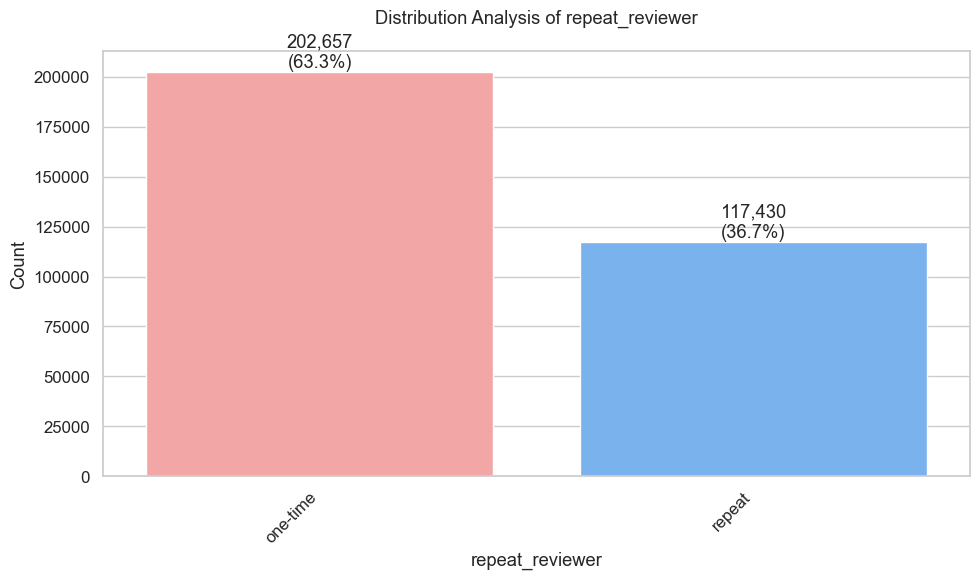

Analyzing binary column: repeat_reviewer_encoded
Distribution:
0: 202,657 (63.3%)
1: 117,430 (36.7%)


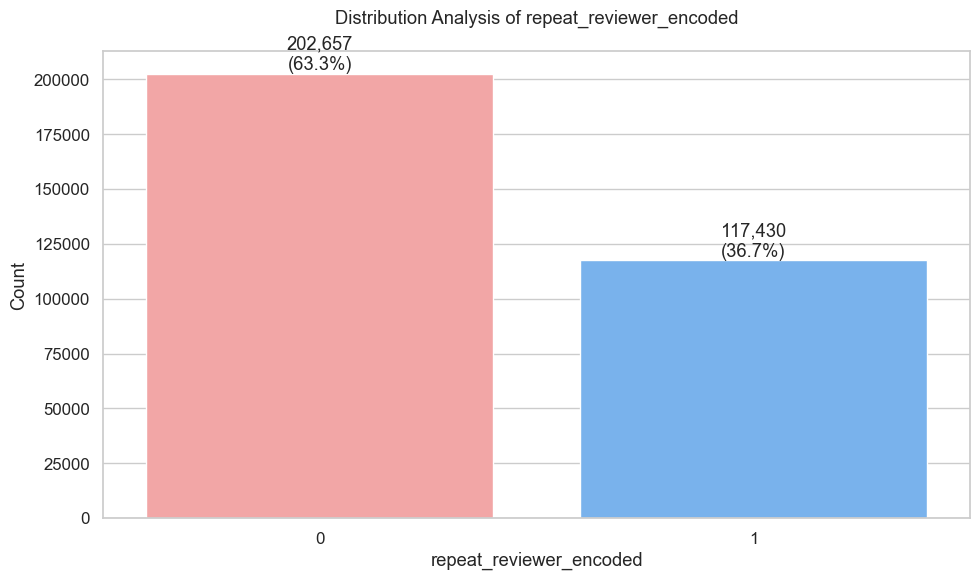

Analyzing binary column: answered_encoded
Distribution:
1: 164,817 (51.5%)
0: 155,270 (48.5%)


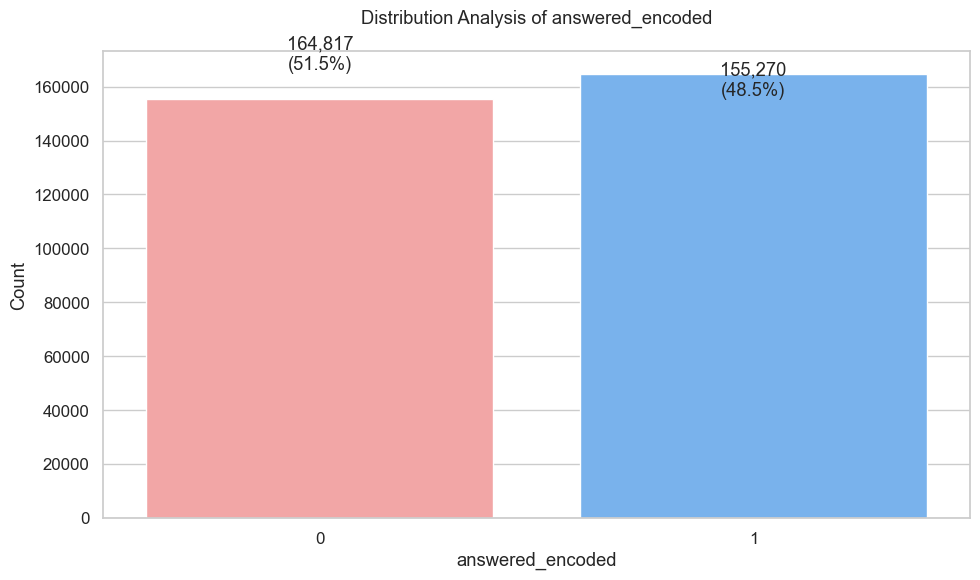

Analyzing binary column: day_type
Distribution:
Business Day: 243,598 (76.1%)
Weekend: 76,489 (23.9%)


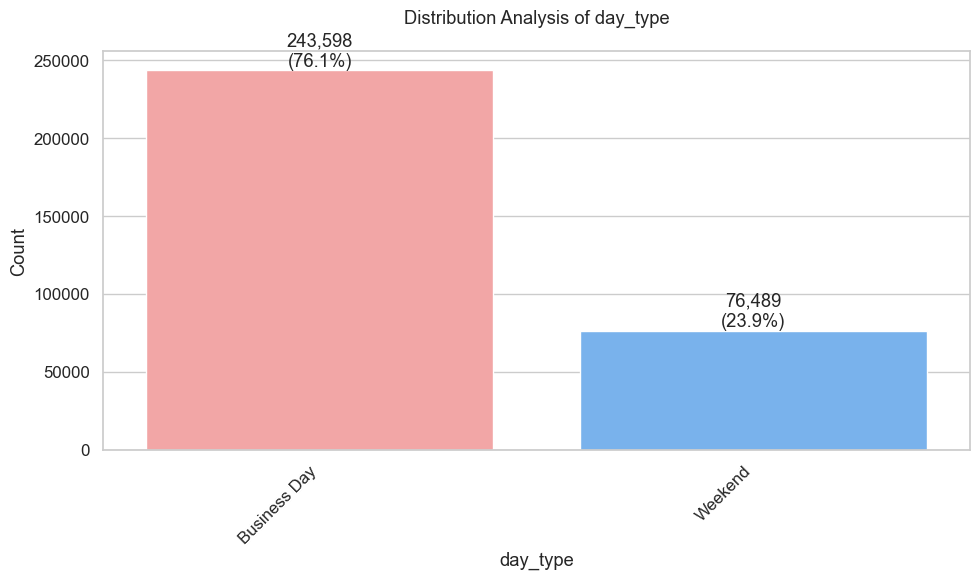

Analyzing binary column: review_time
Distribution:
quick_review: 198,187 (61.9%)
late_review: 121,900 (38.1%)


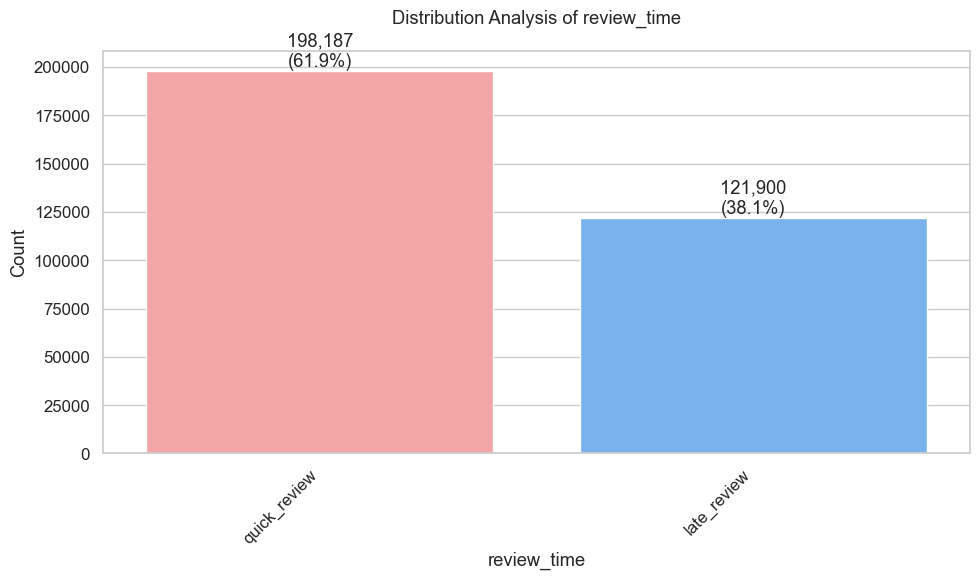

Analyzing binary column: review_time_encoded
Distribution:
1: 198,187 (61.9%)
0: 121,900 (38.1%)


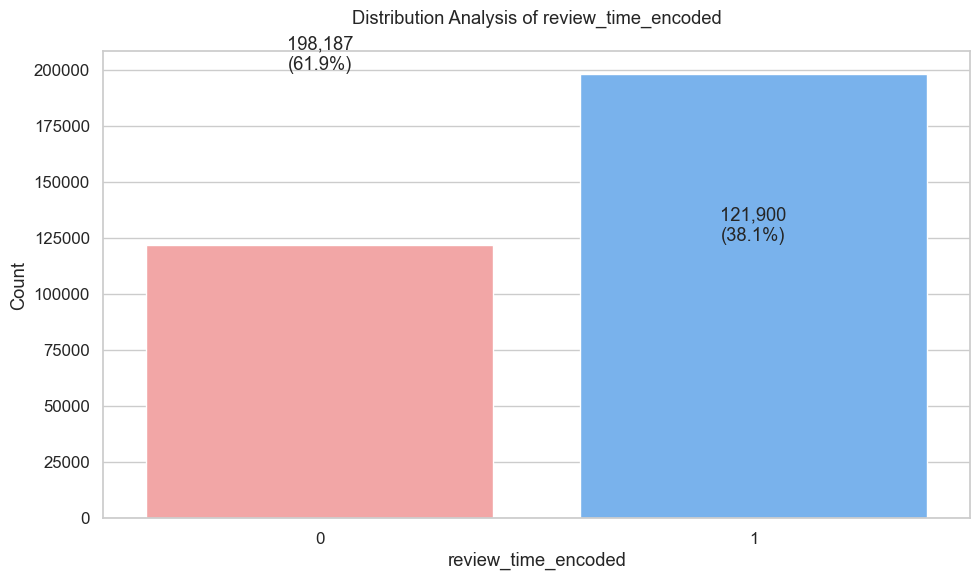

In [4]:
# Univariate analysis on binary columns
binary_columns = []
for column in df_trustpilot.columns:
    if len(df_trustpilot[column].unique()) == 2:
        binary_columns.append(column)

def analyze_binary_columns(df, binary_columns):
    sns.set_theme(style="whitegrid", palette="husl", font_scale=1.1)
    for column in binary_columns:
        print(f"Analyzing binary column: {column}")
        value_counts = df[column].value_counts()
        percentages = df[column].value_counts(normalize=True) * 100
        print("Distribution:")
        for value, count in value_counts.items():
            pct = percentages[value]
            print(f"{value}: {count:,} ({pct:.1f}%)")
        plt.figure(figsize=(10, 6))
        ax = sns.barplot(x=df[column].value_counts().index, 
                        y=df[column].value_counts().values, palette=['#FF9999', '#66B2FF'])
        for i, v in enumerate(value_counts):
            ax.text(i, v, f'{v:,}\n({percentages[value_counts.index[i]]:.1f}%)', 
                   ha='center', va='bottom')
    
        plt.title(f'Distribution Analysis of {column}', pad=20)
        plt.xlabel(column)
        plt.ylabel('Count')
        
        if not np.issubdtype(df[column].dtype, np.number):
            plt.xticks(rotation=45, ha='right')

        plt.tight_layout()
        plt.show()

analyze_binary_columns(df_trustpilot, binary_columns)

Basic Statistics:
TextBlob Sentiment Statistics:
count    320087.000
mean          0.232
std           0.311
min          -1.000
25%           0.000
50%           0.225
75%           0.433
max           1.000
Name: Sentiment_Blob, dtype: float64
VADER Sentiment Statistics:
count    320087.000
mean          0.335
std           0.525
min          -0.999
25%           0.000
50%           0.488
75%           0.778
max           0.999
Name: Sentiment_VADER, dtype: float64


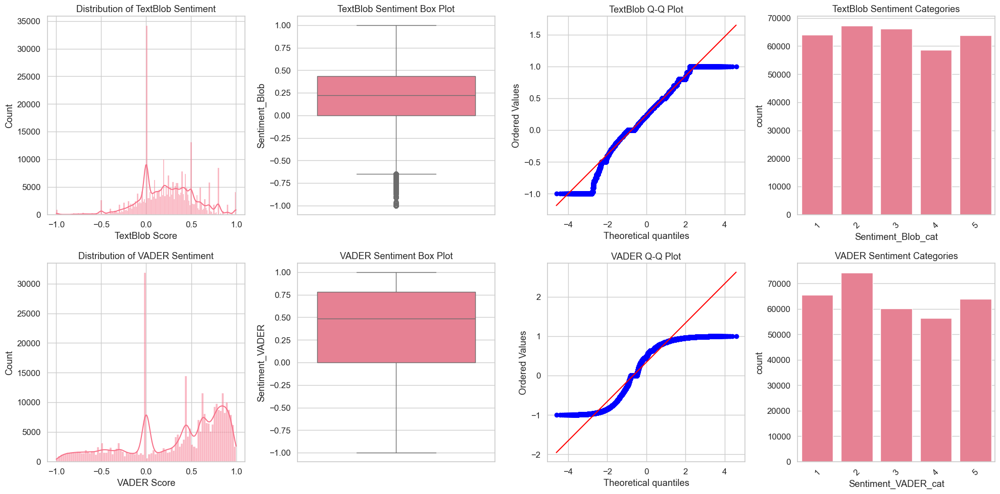

TextBlob Sentiment Category Distribution (%):
Sentiment_Blob_cat
2    21.0
3    20.7
1    20.0
5    20.0
4    18.3
Name: proportion, dtype: float64
VADER Sentiment Category Distribution (%):
Sentiment_VADER_cat
2    23.2
1    20.4
5    19.9
3    18.8
4    17.6
Name: proportion, dtype: float64


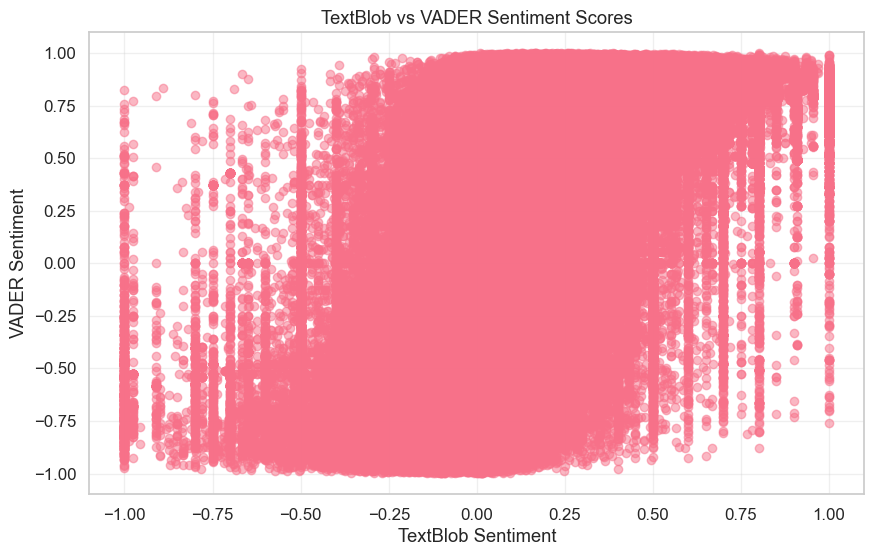

Correlation between TextBlob and VADER sentiment scores: 0.612


In [5]:
#Univariate analysis of sentiment scores

def analyze_sentiment_distributions():
    print("Basic Statistics:")
    print("TextBlob Sentiment Statistics:")
    print(df_trustpilot['Sentiment_Blob'].describe().round(3))
    print("VADER Sentiment Statistics:")
    print(df_trustpilot['Sentiment_VADER'].describe().round(3))
    
    fig = plt.figure(figsize=(20, 10))
    
    # TextBlob distributions
    plt.subplot(241)
    sns.histplot(data=df_trustpilot, x='Sentiment_Blob', kde=True)
    plt.title('Distribution of TextBlob Sentiment')
    plt.xlabel('TextBlob Score')
    plt.subplot(242)
    sns.boxplot(y=df_trustpilot['Sentiment_Blob'])
    plt.title('TextBlob Sentiment Box Plot')
    plt.subplot(243)
    stats.probplot(df_trustpilot['Sentiment_Blob'], dist="norm", plot=plt)
    plt.title('TextBlob Q-Q Plot')
    plt.subplot(244)
    sns.countplot(data=df_trustpilot, x='Sentiment_Blob_cat')
    plt.title('TextBlob Sentiment Categories')
    plt.xticks(rotation=45)
    
    # VADER distributions
    plt.subplot(245)
    sns.histplot(data=df_trustpilot, x='Sentiment_VADER', kde=True)
    plt.title('Distribution of VADER Sentiment')
    plt.xlabel('VADER Score')
    plt.subplot(246)
    sns.boxplot(y=df_trustpilot['Sentiment_VADER'])
    plt.title('VADER Sentiment Box Plot')
    plt.subplot(247)
    stats.probplot(df_trustpilot['Sentiment_VADER'], dist="norm", plot=plt)
    plt.title('VADER Q-Q Plot')
    plt.subplot(248)
    sns.countplot(data=df_trustpilot, x='Sentiment_VADER_cat')
    plt.title('VADER Sentiment Categories')
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()
    
    # Category distributions
    print("TextBlob Sentiment Category Distribution (%):")
    print(df_trustpilot['Sentiment_Blob_cat'].value_counts(normalize=True).round(3) * 100)
    print("VADER Sentiment Category Distribution (%):")
    print(df_trustpilot['Sentiment_VADER_cat'].value_counts(normalize=True).round(3) * 100)
    
    # Compare sentiment metrics
    plt.figure(figsize=(10, 6))
    plt.scatter(df_trustpilot['Sentiment_Blob'], df_trustpilot['Sentiment_VADER'], alpha=0.5)
    plt.xlabel('TextBlob Sentiment')
    plt.ylabel('VADER Sentiment')
    plt.title('TextBlob vs VADER Sentiment Scores')
    plt.grid(True, alpha=0.3)
    plt.show()
    
    # Calculate correlation between sentiment metrics
    correlation = df_trustpilot['Sentiment_Blob'].corr(df_trustpilot['Sentiment_VADER'])
    print(f"Correlation between TextBlob and VADER sentiment scores: {correlation:.3f}")

analyze_sentiment_distributions()


In [6]:
sentiment_columns = ['Sentiment_Blob_cat','Sentiment_VADER', 'Sentiment_VADER_cat','Sentiment_Blob']
text_based_columns = ['text', 'text_processed', 'subject', 'subject_processed', 'answer', 'answer_processed']
administrative_columns = ['username']
univariate_pending_columns = list(set(df_trustpilot.columns) - set(binary_columns) - set(sentiment_columns) - set(text_based_columns) - set(administrative_columns))

print("Pending columns:", univariate_pending_columns)

display(df_trustpilot[univariate_pending_columns].head())

Pending columns: ['date_of_experience', 'location', 'rating', 'date_posted', 'subject_word_length', 'month_local', 'punctuation_counts', 'time_of_day', 'company', 'days_between_experience_and_post', 'local_hour', 'verification', 'number_reviews', 'text_length', 'local_date_posted', 'subject_length', 'text_word_length', 'day_of_week_posted']


,date_of_experience,location,rating,date_posted,subject_word_length,month_local,punctuation_counts,time_of_day,company,days_between_experience_and_post,local_hour,verification,number_reviews,text_length,local_date_posted,subject_length,text_word_length,day_of_week_posted
0,2024-11-20,GB,1,2024-11-22 09:22:38,5,11,"{'.': 2, ""'"": 2, '?': 1}",Morning,Asda,2,8,Not Verified,4,330,2024-11-22,29,54,4
1,2024-11-22,GB,1,2024-11-22 12:21:22,4,11,"{'-': 2, '.': 4, ""'"": 1, '!': 1}",Business Hours,Asda,0,11,Not Verified,1,301,2024-11-22,27,47,4
2,2024-11-22,GB,1,2024-11-22 14:14:39,5,11,"{'.': 5, ""'"": 1}",Business Hours,Asda,0,13,Not Verified,63,375,2024-11-22,29,62,4
3,2024-11-19,GB,1,2024-11-22 09:30:19,5,11,"{'.': 3, ',': 1}",Morning,Asda,3,8,Not Verified,1,304,2024-11-22,40,54,4
4,2024-11-19,GB,1,2024-11-19 22:58:03,5,11,"{""'"": 1, ',': 3, '/': 2, '.': 3, ':': 1, '-': ...",Evening,Asda,0,21,Not Verified,3,354,2024-11-19,30,56,1


Statistical analysis for column: company
Unique values: 24
Missing values: 0 (0.00%)
Top 10 Categories (Count and Percentage):
StockX: 84,278 (26.3%)
CASETiFY: 55,560 (17.4%)
SurveyJunkie: 28,831 (9.0%)
PDFSimpli: 27,198 (8.5%)
Quicken: 26,752 (8.4%)
Toluna: 23,549 (7.4%)
Inkfarm.com: 21,764 (6.8%)
Asda: 12,576 (3.9%)
SteelSeries: 12,423 (3.9%)
SCUFGaming: 10,385 (3.2%)
Visualizations for company


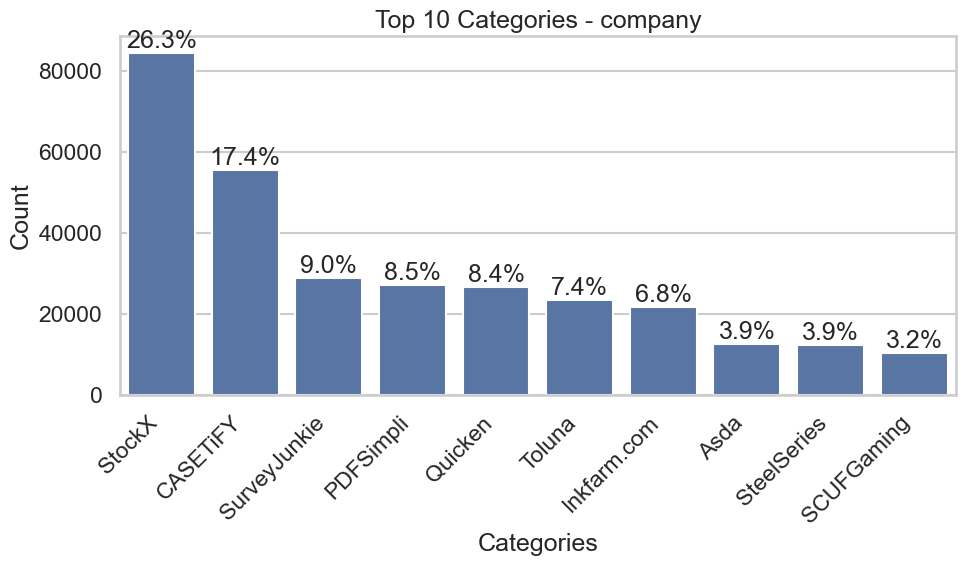

Statistical analysis for column: date_of_experience
Unique values: 4595
Missing values: 0 (0.00%)
Temporal Range:
Start: 2008-12-16 00:00:00
End: 2024-11-22 00:00:00
Range: 5820 days 00:00:00
Visualizations for date_of_experience


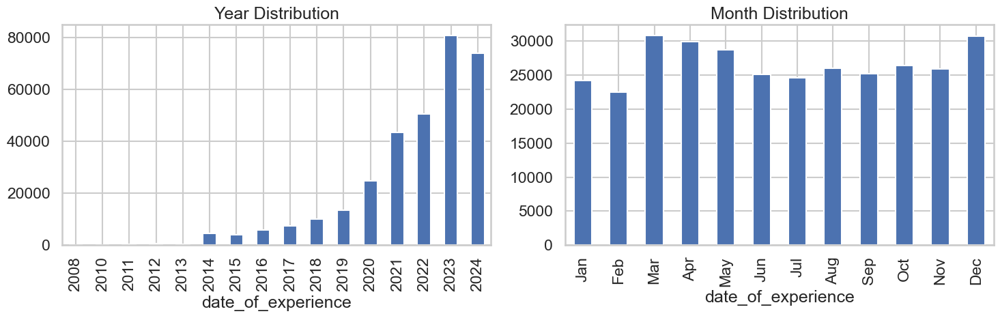

Statistical analysis for column: date_posted
Unique values: 319563
Missing values: 0 (0.00%)
Temporal Range:
Start: 2008-12-16 16:45:50
End: 2024-11-23 04:20:22
Range: 5820 days 11:34:32
Visualizations for date_posted


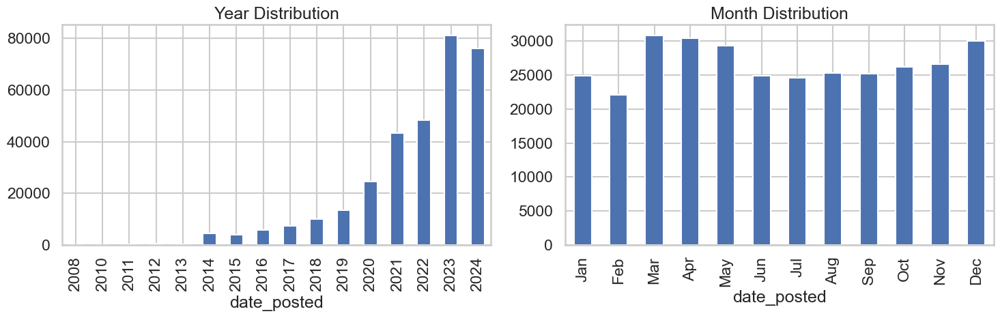

Statistical analysis for column: day_of_week_posted
Unique values: 7
Missing values: 0 (0.00%)
Descriptive Statistics:
count    320087.000000
mean          2.812863
std           1.948548
min           0.000000
25%           1.000000
50%           3.000000
75%           4.000000
max           6.000000
Name: day_of_week_posted, dtype: float64
Outliers: 0 (0.00%)
Visualizations for day_of_week_posted


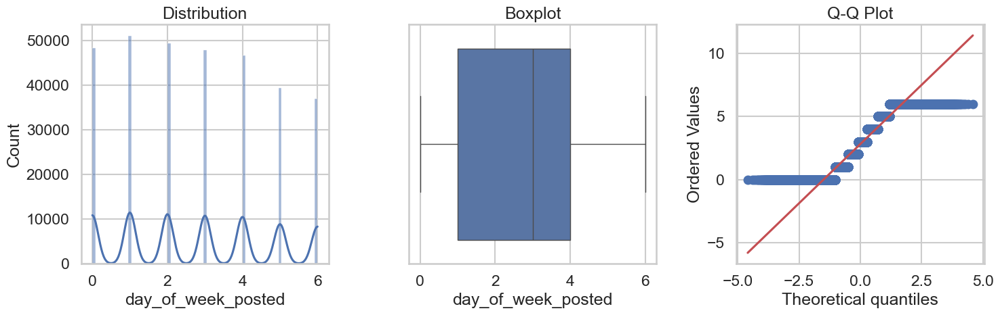

Statistical analysis for column: days_between_experience_and_post
Unique values: 467
Missing values: 0 (0.00%)
Descriptive Statistics:
count    320087.000000
mean          4.753089
std          27.456045
min          -1.000000
25%           0.000000
50%           0.000000
75%           2.000000
max        2744.000000
Name: days_between_experience_and_post, dtype: float64
Outliers: 57255 (17.89%)
Visualizations for days_between_experience_and_post


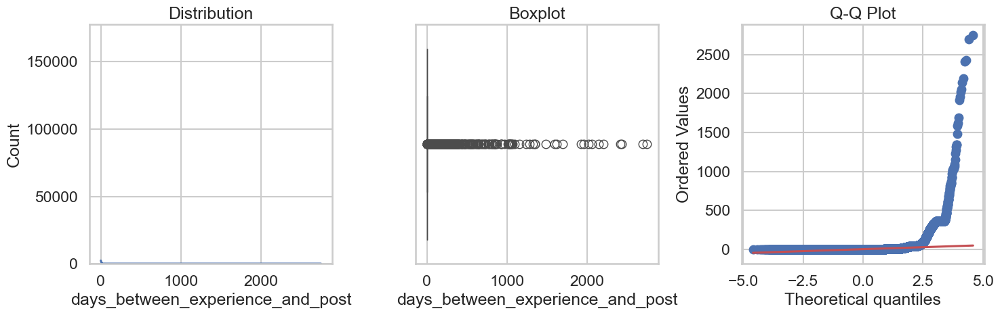

Statistical analysis for column: local_date_posted
Unique values: 4590
Missing values: 0 (0.00%)
Temporal Range:
Start: 2008-12-16 00:00:00
End: 2024-11-23 00:00:00
Range: 5821 days 00:00:00
Visualizations for local_date_posted


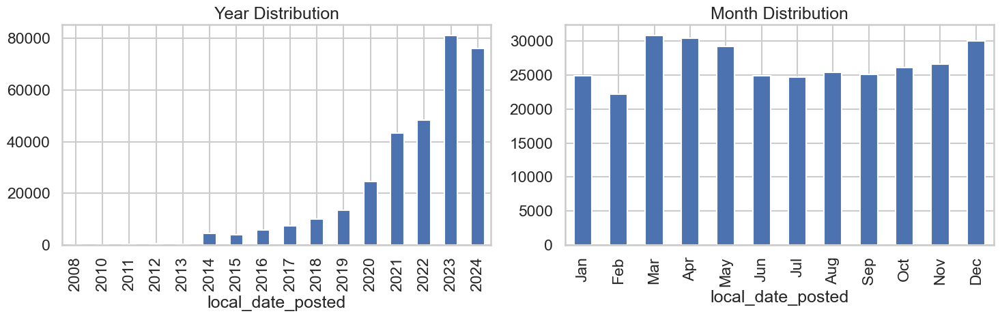

Statistical analysis for column: local_hour
Unique values: 24
Missing values: 0 (0.00%)
Descriptive Statistics:
count    320087.000000
mean         13.301087
std           5.389545
min           0.000000
25%          10.000000
50%          13.000000
75%          17.000000
max          23.000000
Name: local_hour, dtype: float64
Outliers: 0 (0.00%)
Visualizations for local_hour


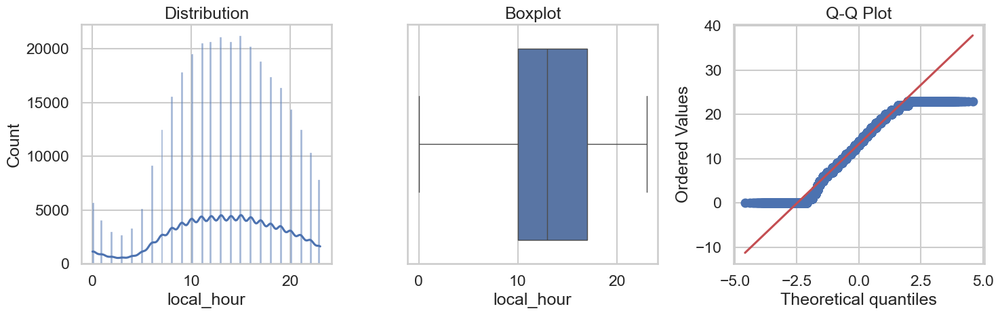

Statistical analysis for column: location
Unique values: 209
Missing values: 0 (0.00%)
Top 10 Categories (Count and Percentage):
US: 216,645 (67.7%)
GB: 30,826 (9.6%)
CA: 12,541 (3.9%)
AU: 9,806 (3.1%)
PH: 3,731 (1.2%)
IN: 3,190 (1.0%)
HK: 3,120 (1.0%)
SG: 2,448 (0.8%)
TH: 2,284 (0.7%)
KR: 2,232 (0.7%)
Visualizations for location


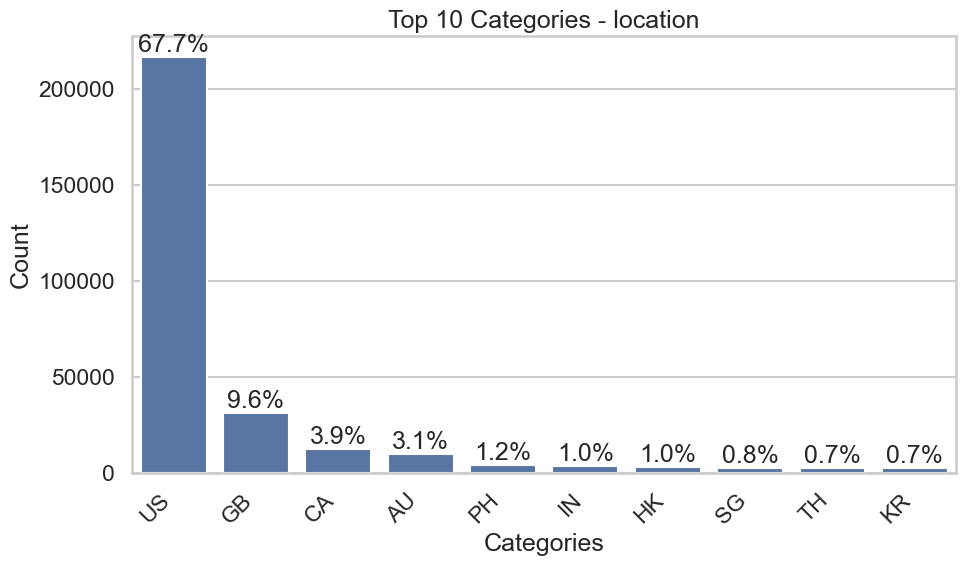

Statistical analysis for column: month_local
Unique values: 12
Missing values: 0 (0.00%)
Descriptive Statistics:
count    320087.000000
mean          6.539578
std           3.456201
min           1.000000
25%           4.000000
50%           6.000000
75%          10.000000
max          12.000000
Name: month_local, dtype: float64
Outliers: 0 (0.00%)
Visualizations for month_local


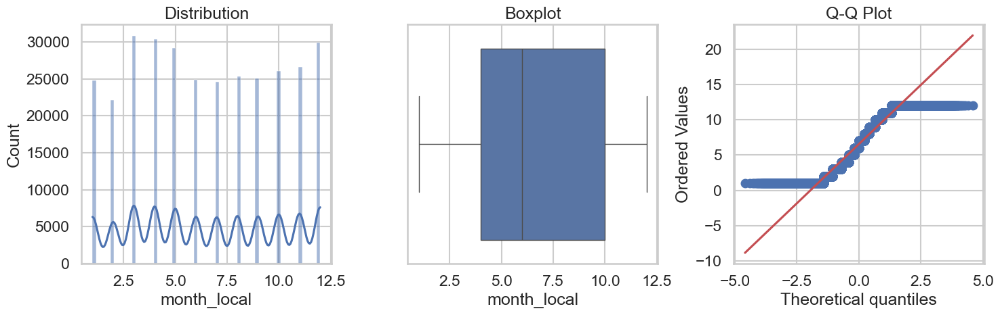

Statistical analysis for column: number_reviews
Unique values: 178
Missing values: 0 (0.00%)
Descriptive Statistics:
count    320087.000000
mean          2.467064
std           5.772469
min           1.000000
25%           1.000000
50%           1.000000
75%           2.000000
max         592.000000
Name: number_reviews, dtype: float64
Outliers: 40662 (12.70%)
Visualizations for number_reviews


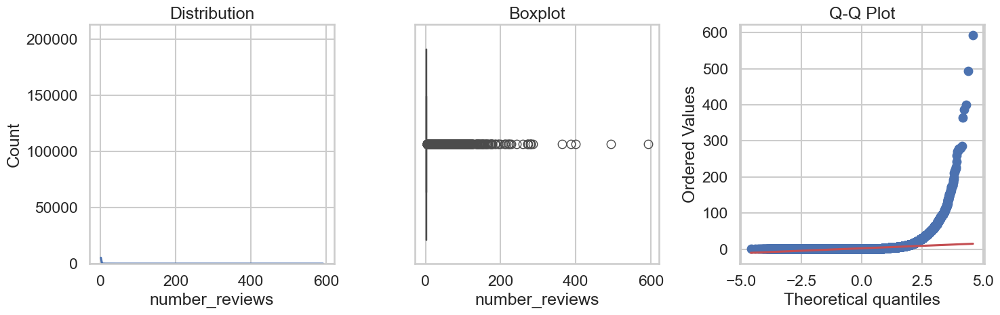

Statistical analysis for column: punctuation_counts
Unique values: 45319
Missing values: 0 (0.00%)
Top 10 Categories (Count and Percentage):
{}: 48,898 (15.3%)
{'.': 1}: 35,234 (11.0%)
{'.': 2}: 26,536 (8.3%)
{'.': 3}: 11,949 (3.7%)
{',': 1, '.': 1}: 9,042 (2.8%)
{',': 1}: 8,147 (2.5%)
{'!': 1}: 6,338 (2.0%)
{'.': 4}: 5,035 (1.6%)
{',': 1, '.': 2}: 3,653 (1.1%)
{'.': 1, '!': 1}: 3,265 (1.0%)
Visualizations for punctuation_counts


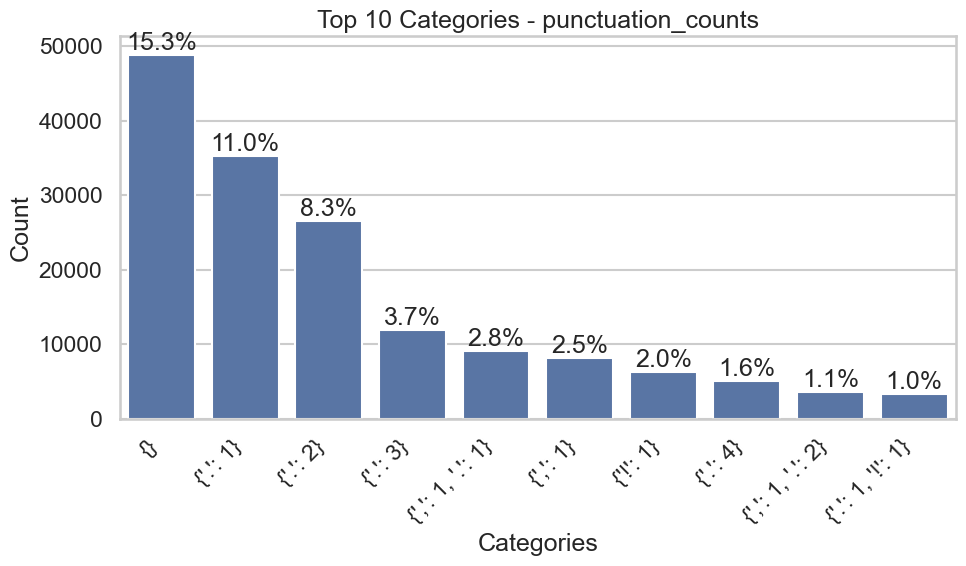

Statistical analysis for column: rating
Unique values: 5
Missing values: 0 (0.00%)
Descriptive Statistics:
count    320087.000000
mean          3.754464
std           1.580964
min           1.000000
25%           3.000000
50%           5.000000
75%           5.000000
max           5.000000
Name: rating, dtype: float64
Outliers: 0 (0.00%)
Visualizations for rating


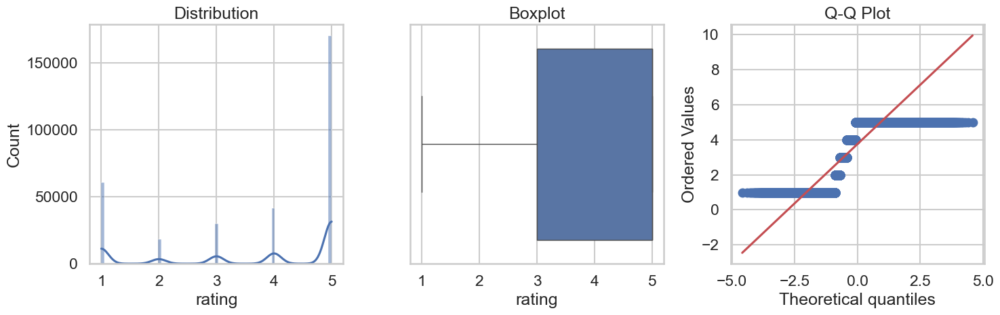

Statistical analysis for column: subject_length
Unique values: 174
Missing values: 0 (0.00%)
Descriptive Statistics:
count    320087.000000
mean         23.446332
std          10.716146
min           0.000000
25%          17.000000
50%          24.000000
75%          29.000000
max         181.000000
Name: subject_length, dtype: float64
Outliers: 6836 (2.14%)
Visualizations for subject_length


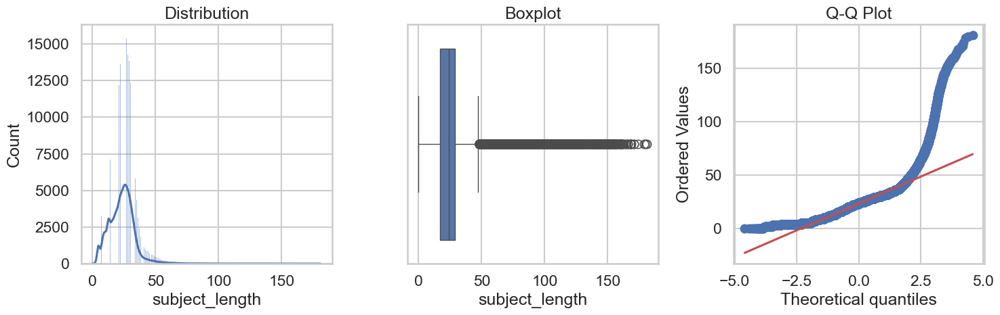

Statistical analysis for column: subject_word_length
Unique values: 34
Missing values: 0 (0.00%)
Descriptive Statistics:
count    320087.000000
mean          3.907478
std           1.780329
min           0.000000
25%           3.000000
50%           4.000000
75%           5.000000
max          34.000000
Name: subject_word_length, dtype: float64
Outliers: 4402 (1.38%)
Visualizations for subject_word_length


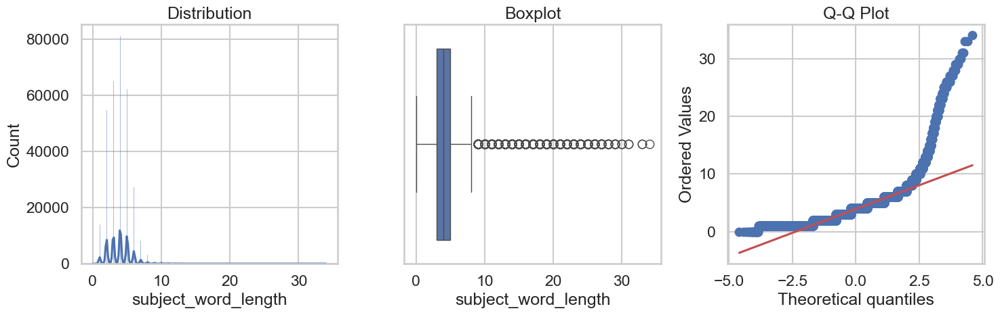

Statistical analysis for column: text_length
Unique values: 2065
Missing values: 0 (0.00%)
Descriptive Statistics:
count    320087.000000
mean        142.324156
std         190.807176
min           0.000000
25%          46.000000
50%          84.000000
75%         165.000000
max        9584.000000
Name: text_length, dtype: float64
Outliers: 25989 (8.12%)
Visualizations for text_length


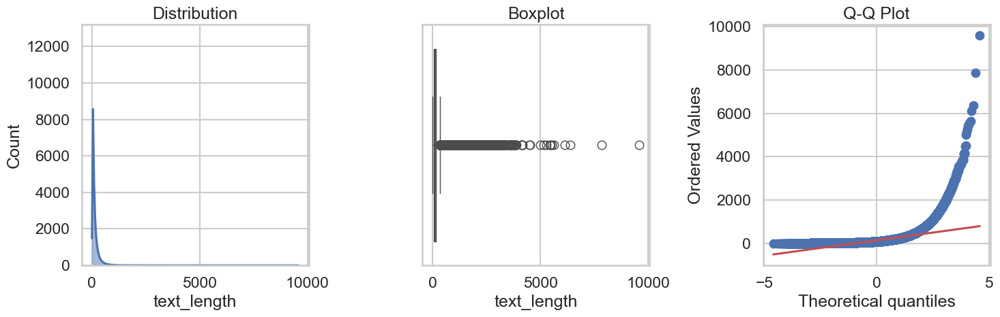

Statistical analysis for column: text_word_length
Unique values: 514
Missing values: 0 (0.00%)
Descriptive Statistics:
count    320087.000000
mean         23.334925
std          31.245664
min           0.000000
25%           8.000000
50%          14.000000
75%          27.000000
max        1464.000000
Name: text_word_length, dtype: float64
Outliers: 26685 (8.34%)
Visualizations for text_word_length


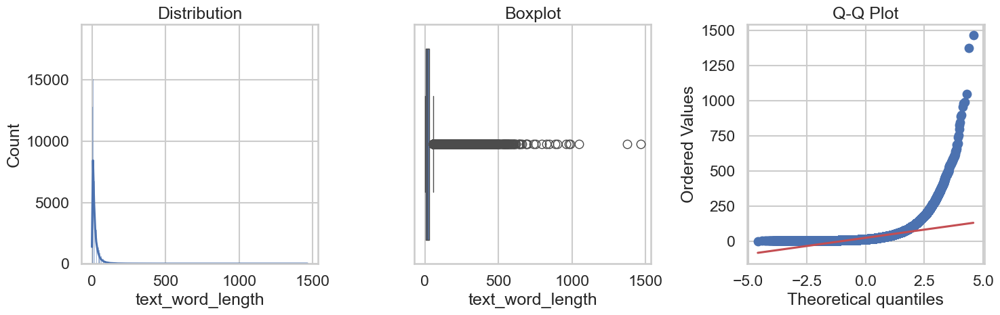

Statistical analysis for column: time_of_day
Unique values: 4
Missing values: 0 (0.00%)
Top 10 Categories (Count and Percentage):
Business Hours: 180,595 (56.4%)
Evening: 70,877 (22.1%)
Morning: 37,201 (11.6%)
Night: 31,414 (9.8%)
Visualizations for time_of_day


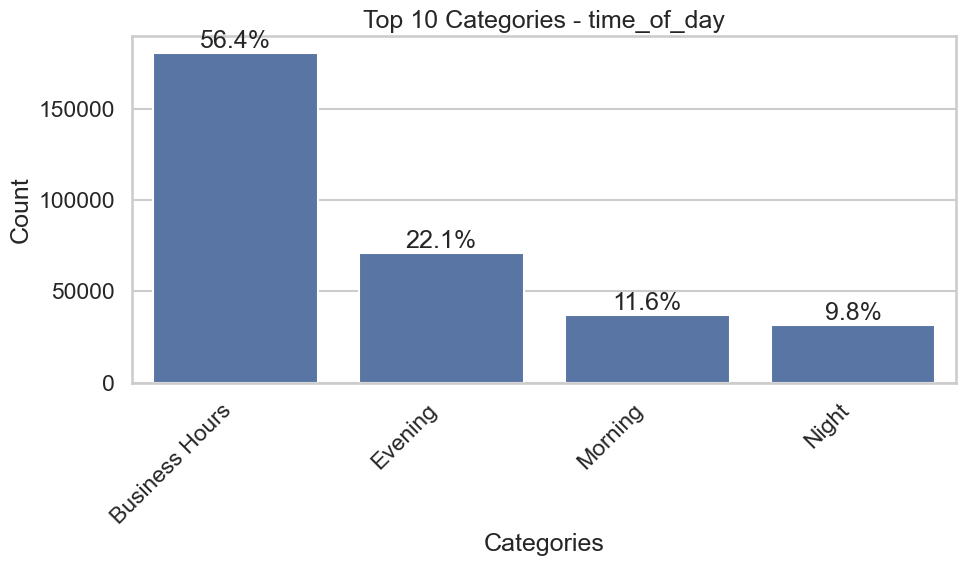

Statistical analysis for column: verification
Unique values: 5
Missing values: 0 (0.00%)
Top 10 Categories (Count and Percentage):
Verified: 197,543 (61.7%)
Not Verified: 61,671 (19.3%)
Invited: 60,799 (19.0%)
Redirected: 73 (0.0%)
Merged: 1 (0.0%)
Visualizations for verification


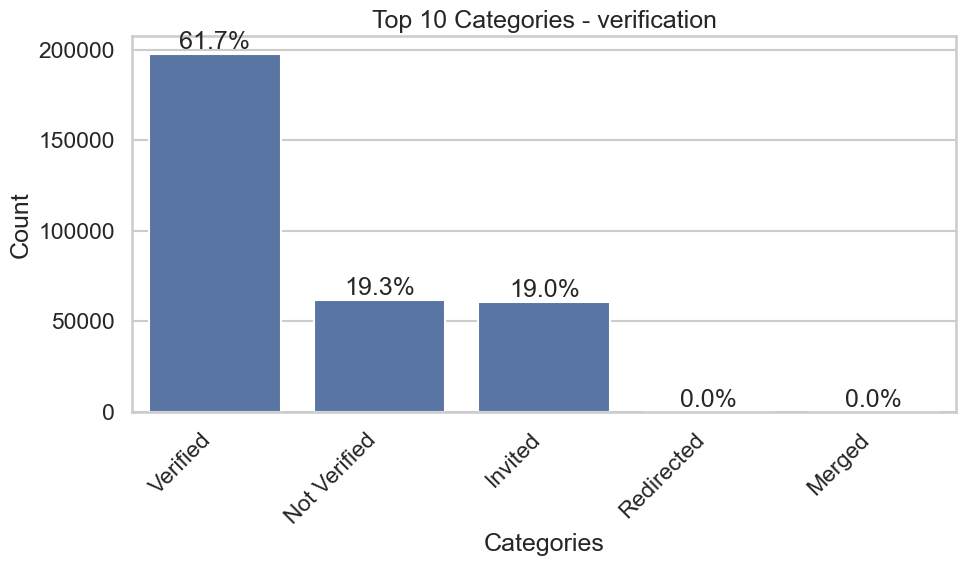

In [7]:
#Univariate analysis of remaining columns

def analyze_statistics(df, column_name):
    print(f"Statistical analysis for column: {column_name}")

    # Basic info for all columns
    n_unique = df[column_name].nunique()
    n_missing = df[column_name].isnull().sum()
    print(f"Unique values: {n_unique}")
    print(f"Missing values: {n_missing} ({(n_missing/len(df)*100):.2f}%)")
    
    if np.issubdtype(df[column_name].dtype, np.number):
        # Numeric analysis
        desc = df[column_name].describe()
        print("Descriptive Statistics:")
        print(desc)
        
        # Outlier analysis using IQR
        q1, q3 = df[column_name].quantile([0.25, 0.75])
        iqr = q3 - q1
        outliers = df[column_name][(df[column_name] < q1 - 1.5*iqr) | 
                                 (df[column_name] > q3 + 1.5*iqr)]
        print(f"Outliers: {len(outliers)} ({(len(outliers)/len(df)*100):.2f}%)")
        
    elif df[column_name].dtype == 'object':
        # Categorical analysis
        value_counts = df[column_name].value_counts()
        print("Top 10 Categories (Count and Percentage):")
        for val, count in value_counts.head(10).items():
            pct = count/len(df)*100
            print(f"{val}: {count:,} ({pct:.1f}%)")
            
    elif pd.api.types.is_datetime64_dtype(df[column_name]):
        # Datetime analysis
        print("Temporal Range:")
        print(f"Start: {df[column_name].min()}")
        print(f"End: {df[column_name].max()}")
        print(f"Range: {df[column_name].max() - df[column_name].min()}")

def create_visualizations(df, column_name):
    print(f"Visualizations for {column_name}")
    print("="*50)
    
    if np.issubdtype(df[column_name].dtype, np.number):
        fig, axes = plt.subplots(1, 3, figsize=(15, 5))
        
        # Distribution
        sns.histplot(data=df, x=column_name, kde=True, ax=axes[0])
        axes[0].set_title('Distribution')
        
        # Vertical boxplot without percentages
        sns.boxplot(x=df[column_name], ax=axes[1])
        axes[1].set_title('Boxplot')
        
        # Q-Q plot
        stats.probplot(df[column_name], dist="norm", plot=axes[2])
        axes[2].set_title('Q-Q Plot')
        
    elif df[column_name].dtype == 'object':
        # Categorical visualization with vertical bars
        plt.figure(figsize=(10, 6))
        
        # Get top 10 categories and their percentages
        top_cats = df[column_name].value_counts().head(10)
        percentages = (top_cats / len(df) * 100)
        
        # Create vertical bar plot
        ax = sns.barplot(x=range(len(top_cats)), y=top_cats.values)
        plt.title(f'Top 10 Categories - {column_name}')
        plt.xlabel('Categories')
        plt.ylabel('Count')
        
        # Set x-tick labels
        plt.xticks(range(len(top_cats)), top_cats.index, rotation=45, ha='right')
        
        # Add percentage labels on top of each bar
        for i, pct in enumerate(percentages):
            ax.text(i, top_cats.values[i], f'{pct:.1f}%', 
                   ha='center', va='bottom')
        
    elif pd.api.types.is_datetime64_dtype(df[column_name]):
        # Datetime visualizations
        fig, axes = plt.subplots(1, 2, figsize=(15, 5))
        
        # Year distribution
        df[column_name].dt.year.value_counts().sort_index().plot(
            kind='bar', ax=axes[0])
        axes[0].set_title('Year Distribution')
        
        # Month distribution
        df[column_name].dt.month.value_counts().sort_index().plot(
            kind='bar', ax=axes[1])
        axes[1].set_xticklabels(['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun',
                                'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
        axes[1].set_title('Month Distribution')
    
    plt.tight_layout()
    plt.show()

sns.set_theme(style="whitegrid", context="talk")

for column in sorted(univariate_pending_columns):
    analyze_statistics(df_trustpilot, column)
    create_visualizations(df_trustpilot, column)

STAGE 2 - MULTIVARIATE ANALYSIS

1. Binary Variables Analysis
Analyzing binary column: repeat_reviewer vs rating
Summary Statistics by Group:
                  count  mean  median   std
repeat_reviewer                            
one-time         202657  3.76     5.0  1.57
repeat           117430  3.74     5.0  1.60
Distribution of rating by groups (%):
rating               1     2     3      4      5
repeat_reviewer                                 
one-time         18.47  5.96  9.54  13.05  52.99
repeat           19.80  5.37  8.84  12.72  53.27


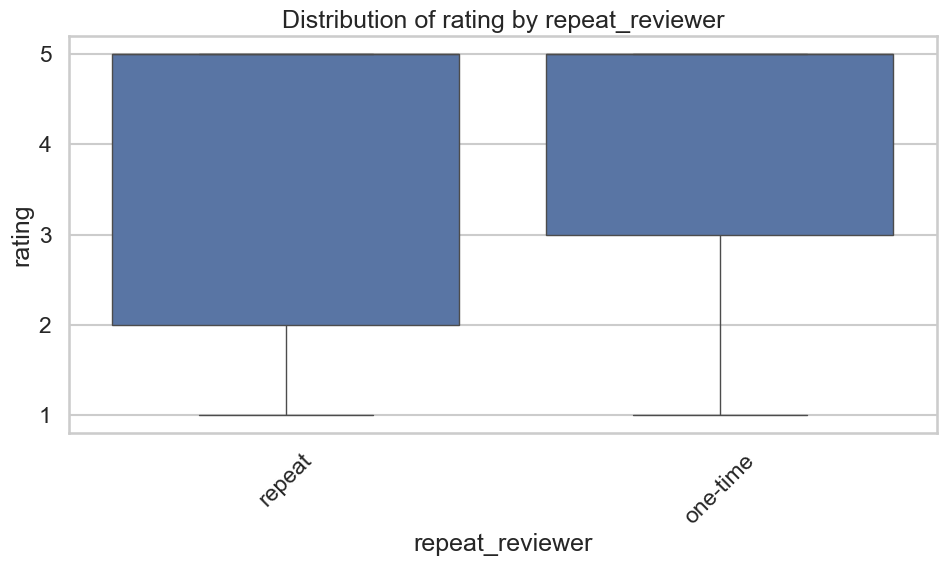

Analyzing binary column: repeat_reviewer_encoded vs rating
Summary Statistics by Group:
                          count  mean  median   std
repeat_reviewer_encoded                            
0                        202657  3.76     5.0  1.57
1                        117430  3.74     5.0  1.60
Distribution of rating by groups (%):
rating                       1     2     3      4      5
repeat_reviewer_encoded                                 
0                        18.47  5.96  9.54  13.05  52.99
1                        19.80  5.37  8.84  12.72  53.27


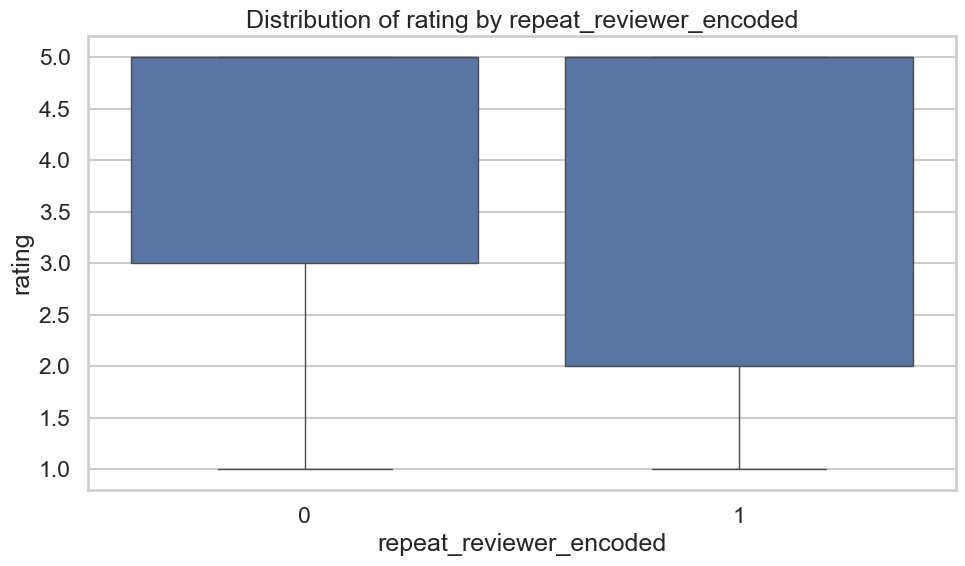

Analyzing binary column: answered_encoded vs rating
Summary Statistics by Group:
                   count  mean  median   std
answered_encoded                            
0                 155270  3.95     5.0  1.43
1                 164817  3.57     5.0  1.69
Distribution of rating by groups (%):
rating                1     2      3      4      5
answered_encoded                                  
0                 13.56  4.08  11.53  15.82  55.02
1                 24.05  7.31   7.17  10.21  51.27


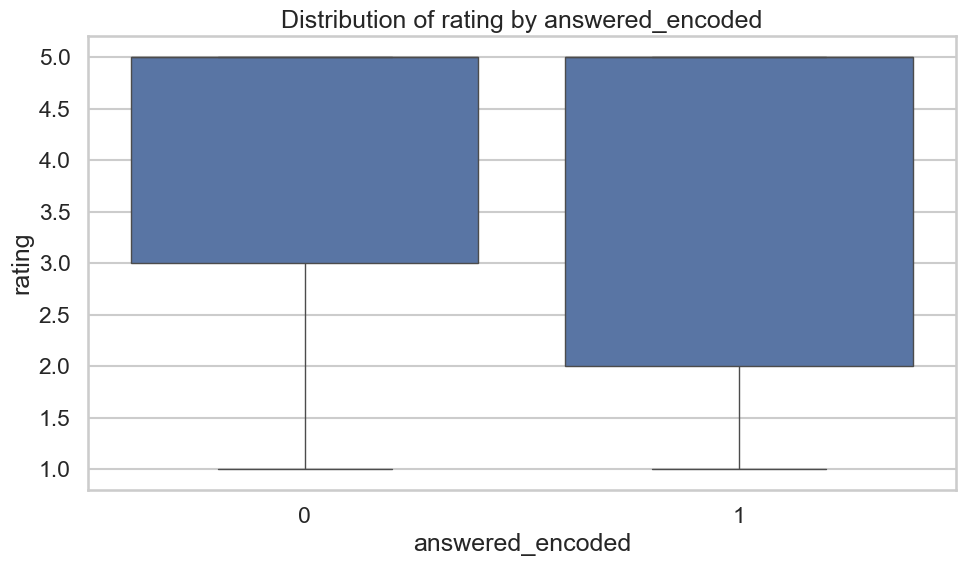

Analyzing binary column: day_type vs rating
Summary Statistics by Group:
               count  mean  median   std
day_type                                
Business Day  243598  3.75     5.0  1.58
Weekend        76489  3.76     5.0  1.58
Distribution of rating by groups (%):
rating            1     2     3      4      5
day_type                                     
Business Day  18.96  5.73  9.35  13.05  52.91
Weekend       18.97  5.78  9.05  12.54  53.65


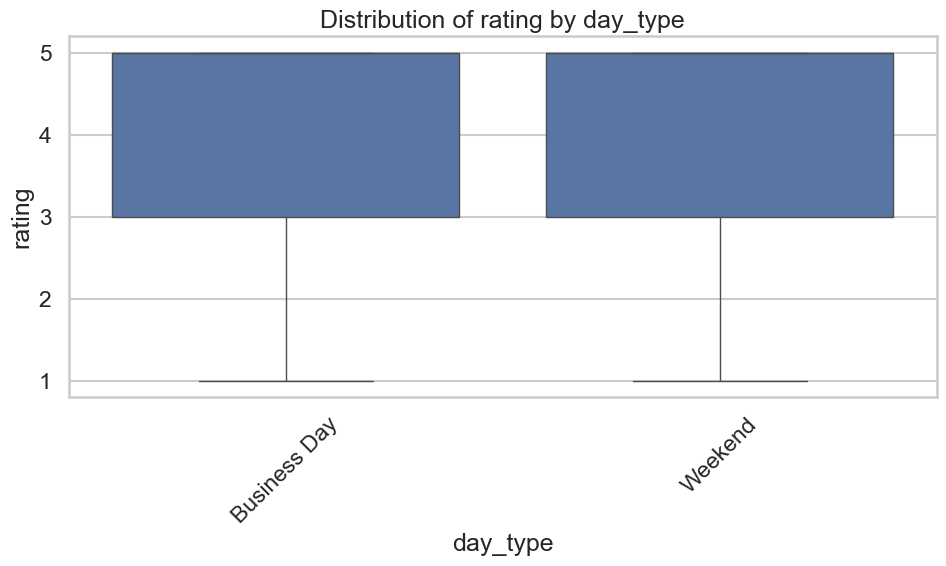

Analyzing binary column: review_time vs rating
Summary Statistics by Group:
               count  mean  median   std
review_time                             
late_review   121900  3.74     5.0  1.61
quick_review  198187  3.77     5.0  1.56
Distribution of rating by groups (%):
rating            1     2     3      4      5
review_time                                  
late_review   19.98  5.90  8.83  11.00  54.28
quick_review  18.33  5.64  9.56  14.11  52.36


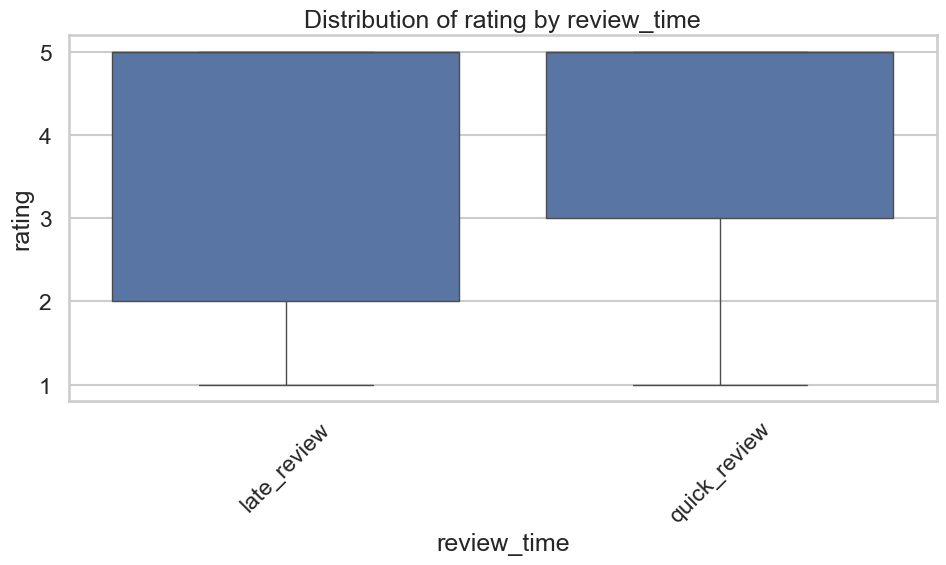

Analyzing binary column: review_time_encoded vs rating
Summary Statistics by Group:
                      count  mean  median   std
review_time_encoded                            
0                    121900  3.74     5.0  1.61
1                    198187  3.77     5.0  1.56
Distribution of rating by groups (%):
rating                   1     2     3      4      5
review_time_encoded                                 
0                    19.98  5.90  8.83  11.00  54.28
1                    18.33  5.64  9.56  14.11  52.36


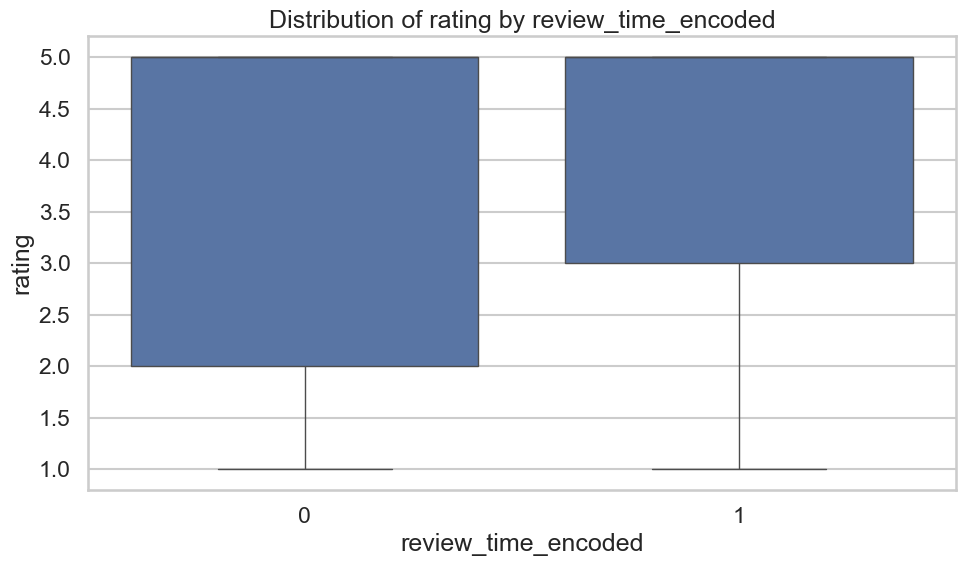

In [8]:
#Multivariate binary analysis

def analyze_multivariate_binary(df, binary_columns, target='rating'):
    for column in binary_columns:
        print(f"Analyzing binary column: {column} vs {target}")
        summary = df.groupby(column)[target].agg(['count', 'mean', 'median', 'std']).round(2)
        print("Summary Statistics by Group:")
        print(summary)
        cross_tab = pd.crosstab(df[column], df[target], normalize='index') * 100
        print(f"Distribution of {target} by groups (%):")
        print(cross_tab.round(2))
        fig, ax = plt.subplots(figsize=(10, 6))
        sns.boxplot(data=df, x=column, y=target)
        plt.title(f'Distribution of {target} by {column}')
        if not np.issubdtype(df[column].dtype, np.number):
            plt.xticks(rotation=45)
        plt.tight_layout()
        plt.show()

print("1. Binary Variables Analysis")
analyze_multivariate_binary(df_trustpilot, binary_columns)


2. Sentiment Analysis
Analyzing sentiment scores vs rating


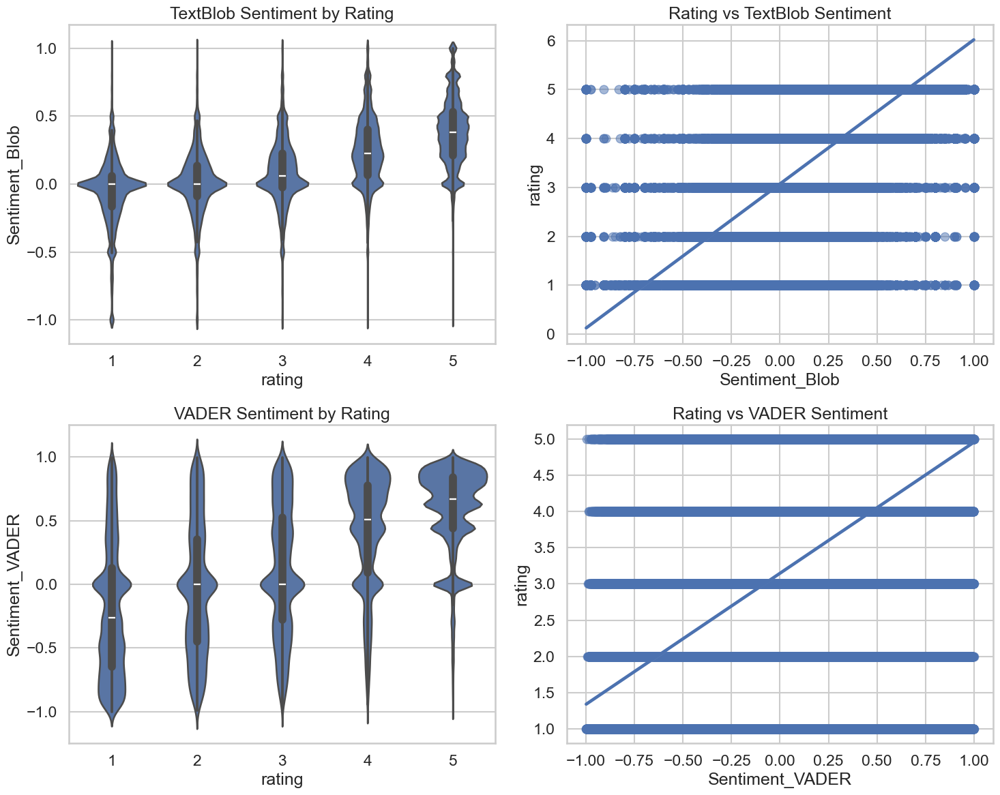

Sentiment_Blob correlation with rating:
Correlation: 0.579
Sentiment_VADER correlation with rating:
Correlation: 0.601


In [9]:
#Multivariate sentiment analysis

def analyze_multivariate_sentiment(df, target='rating'):
    print(f"Analyzing sentiment scores vs {target}")
    print("="*50)
    fig, axes = plt.subplots(2, 2, figsize=(15, 12))
    
    # TextBlob analysis
    sns.violinplot(data=df, x=target, y='Sentiment_Blob', ax=axes[0,0])
    axes[0,0].set_title('TextBlob Sentiment by Rating')
    
    sns.regplot(data=df, x='Sentiment_Blob', y=target, scatter_kws={'alpha':0.5}, ax=axes[0,1])
    axes[0,1].set_title('Rating vs TextBlob Sentiment')
    
    # VADER analysis
    sns.violinplot(data=df, x=target, y='Sentiment_VADER', ax=axes[1,0])
    axes[1,0].set_title('VADER Sentiment by Rating')
    
    sns.regplot(data=df, x='Sentiment_VADER', y=target, scatter_kws={'alpha':0.5}, ax=axes[1,1])
    axes[1,1].set_title('Rating vs VADER Sentiment')
    
    plt.tight_layout()
    plt.show()
    
    # Statistical analysis
    for sentiment in ['Sentiment_Blob', 'Sentiment_VADER']:
        print(f"{sentiment} correlation with {target}:")
        correlation = df[sentiment].corr(df[target])
        print(f"Correlation: {correlation:.3f}")

print("2. Sentiment Analysis")
analyze_multivariate_sentiment(df_trustpilot)

Analyzing company vs rating


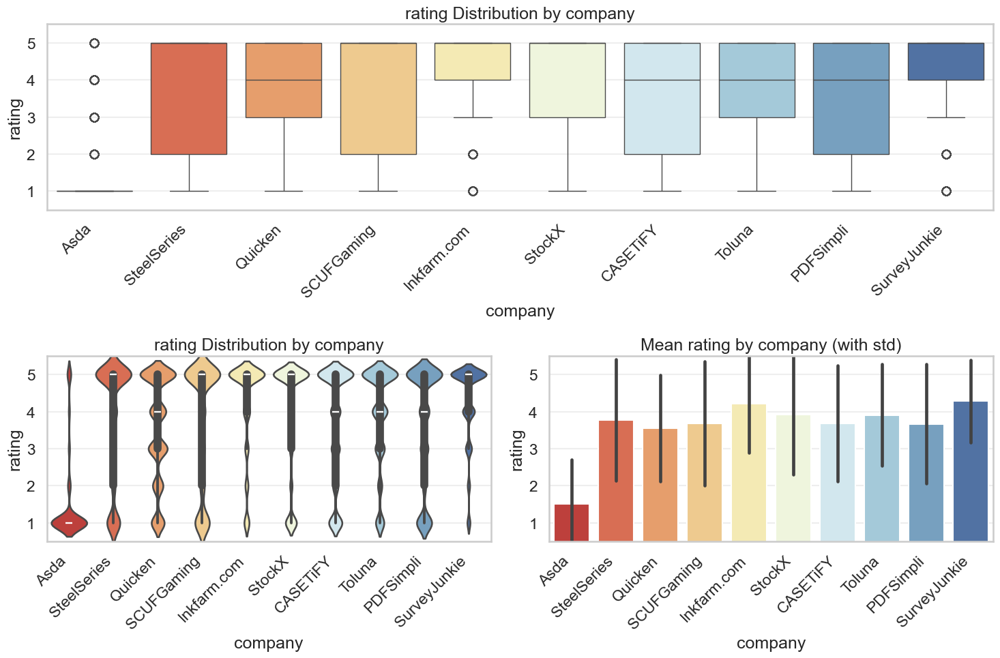

Summary Statistics for Top Categories:
              count  mean   std  median
company                                
Asda          12576  1.51  1.20     1.0
CASETiFY      55560  3.68  1.57     4.0
Inkfarm.com   21764  4.22  1.32     5.0
PDFSimpli     27198  3.67  1.60     4.0
Quicken       26752  3.54  1.43     4.0
SCUFGaming    10385  3.68  1.67     5.0
SteelSeries   12423  3.78  1.64     5.0
StockX        84278  3.91  1.61     5.0
SurveyJunkie  28831  4.28  1.11     5.0
Toluna        23549  3.91  1.37     4.0
Analyzing date_of_experience vs rating


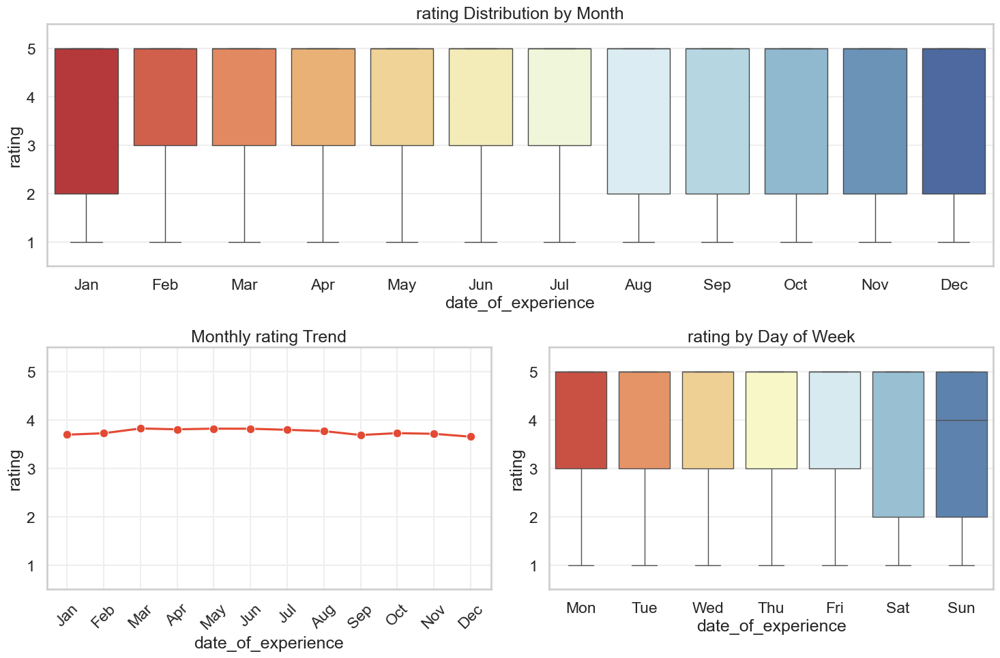

Analyzing date_posted vs rating


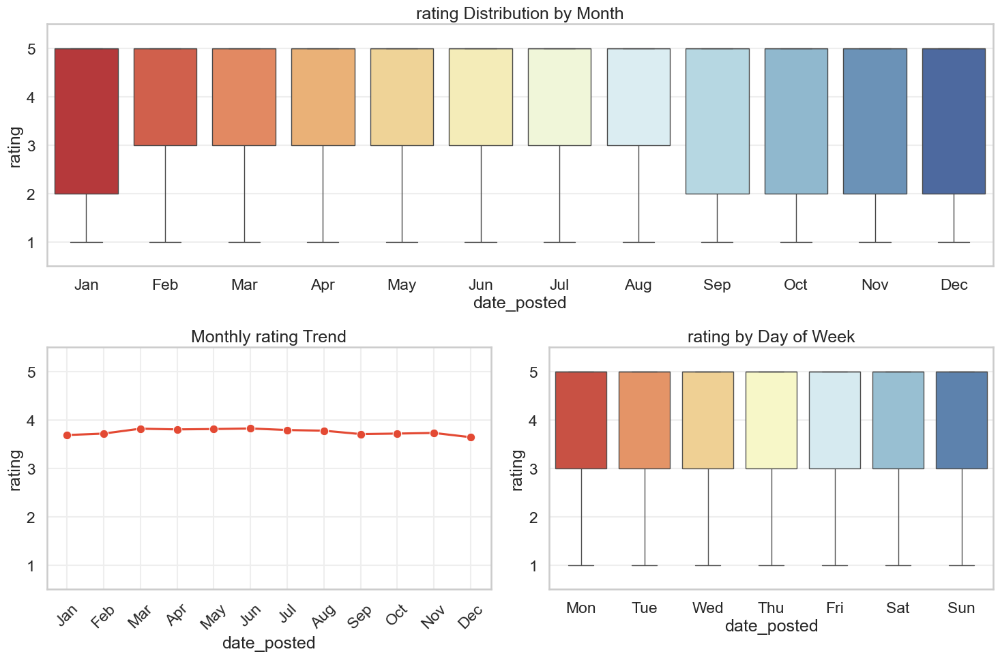

Analyzing day_of_week_posted vs rating


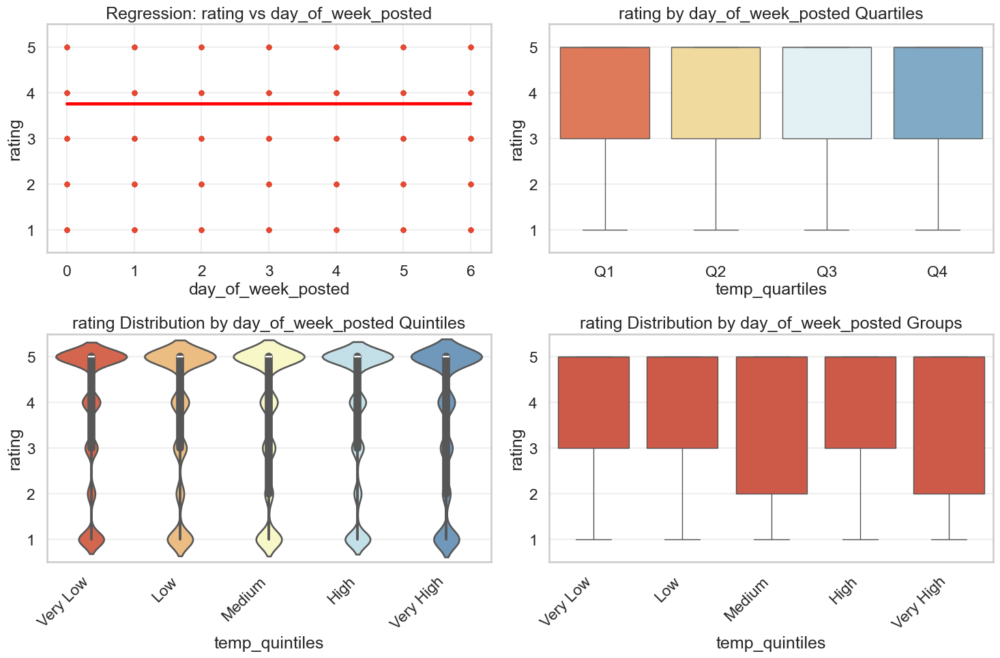

Correlation with rating: 0.001
Analyzing days_between_experience_and_post vs rating
Could not create quartile plot for days_between_experience_and_post
Could not create quintile plot for days_between_experience_and_post


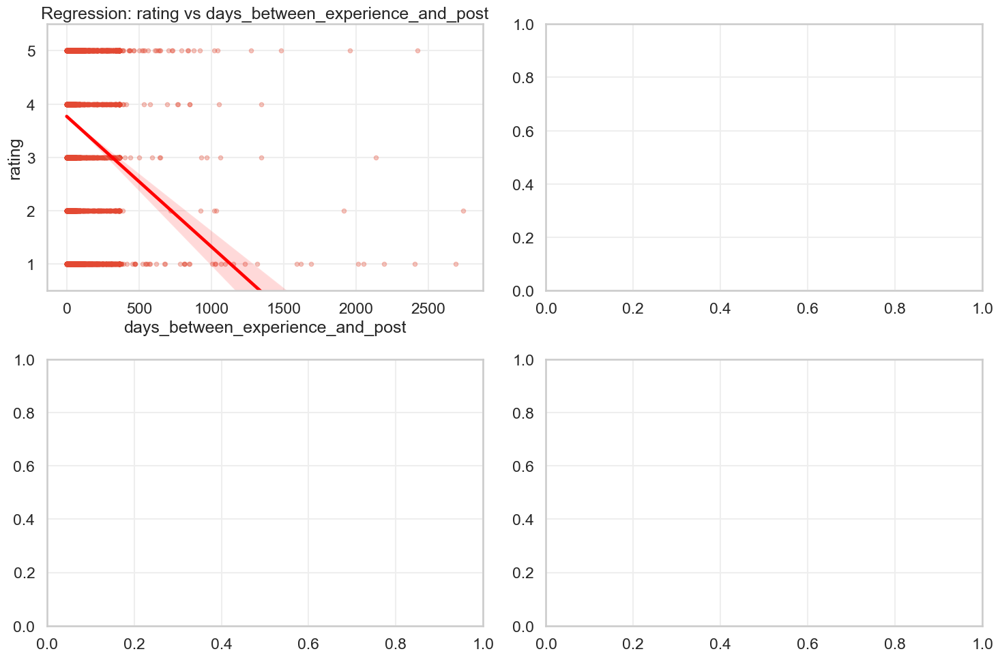

Correlation with rating: -0.042
Analyzing local_date_posted vs rating


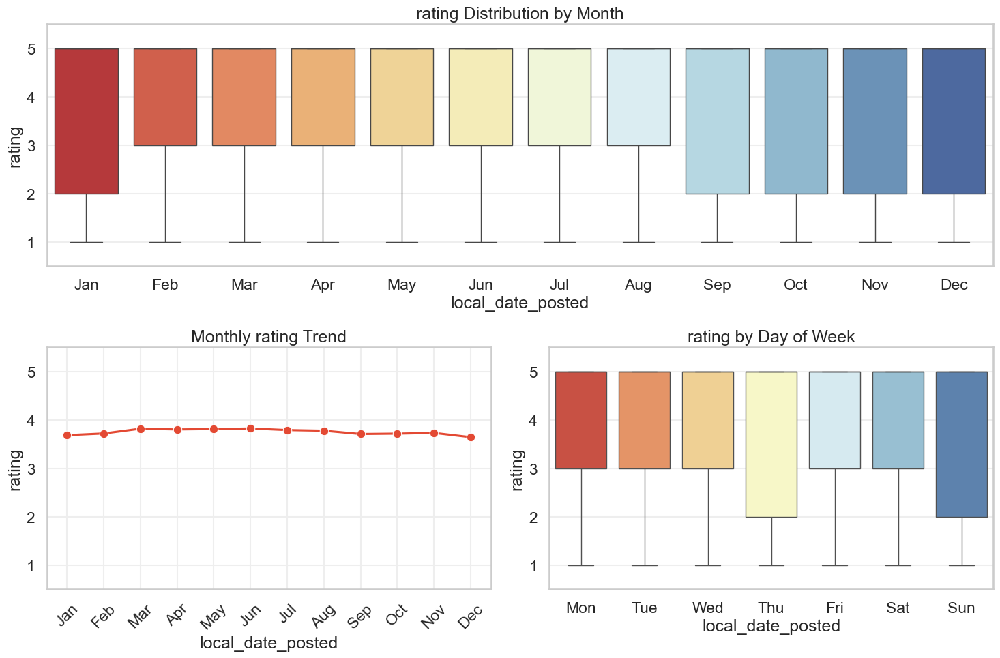

Analyzing local_hour vs rating


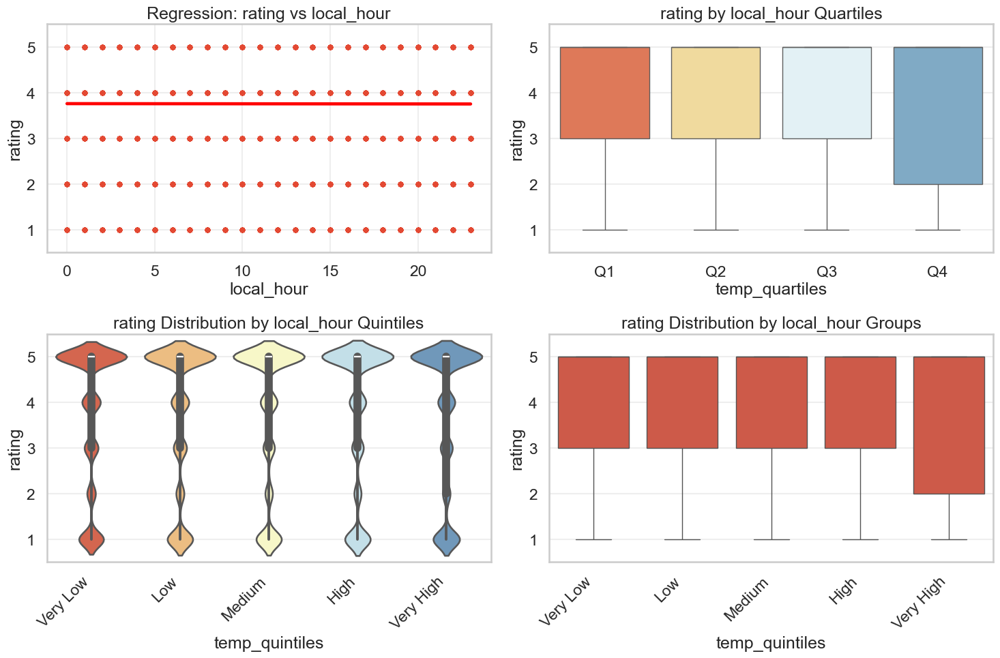

Correlation with rating: -0.001
Analyzing location vs rating


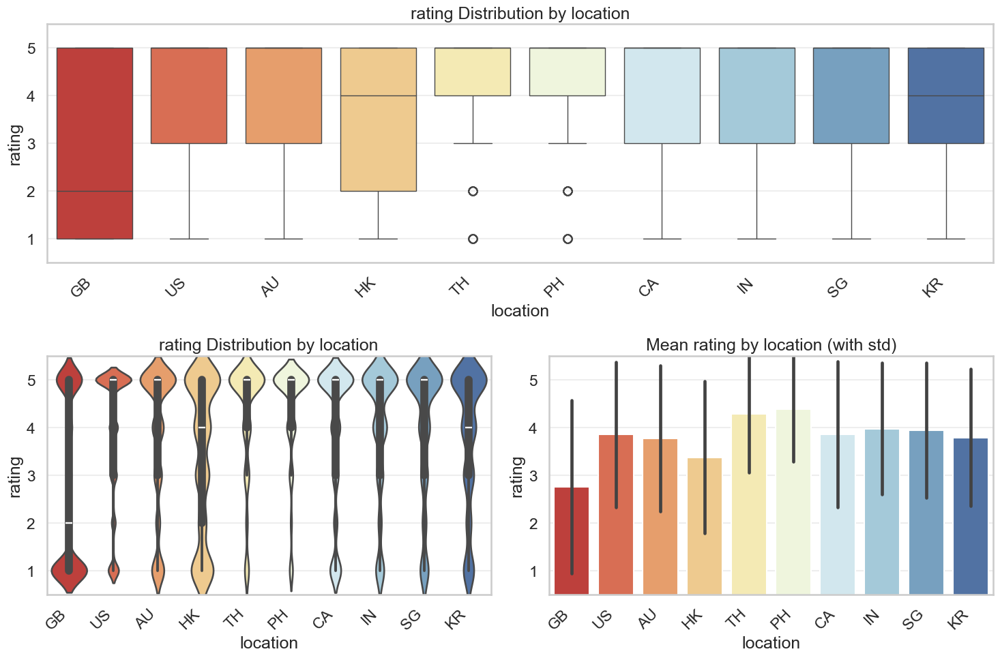

Summary Statistics for Top Categories:
           count  mean   std  median
location                            
AU          9806  3.76  1.53     5.0
CA         12541  3.85  1.53     5.0
GB         30826  2.75  1.82     2.0
HK          3120  3.37  1.59     4.0
IN          3190  3.97  1.38     5.0
KR          2232  3.79  1.44     4.0
PH          3731  4.39  1.11     5.0
SG          2448  3.94  1.42     5.0
TH          2284  4.28  1.22     5.0
US        216645  3.85  1.52     5.0
Analyzing month_local vs rating


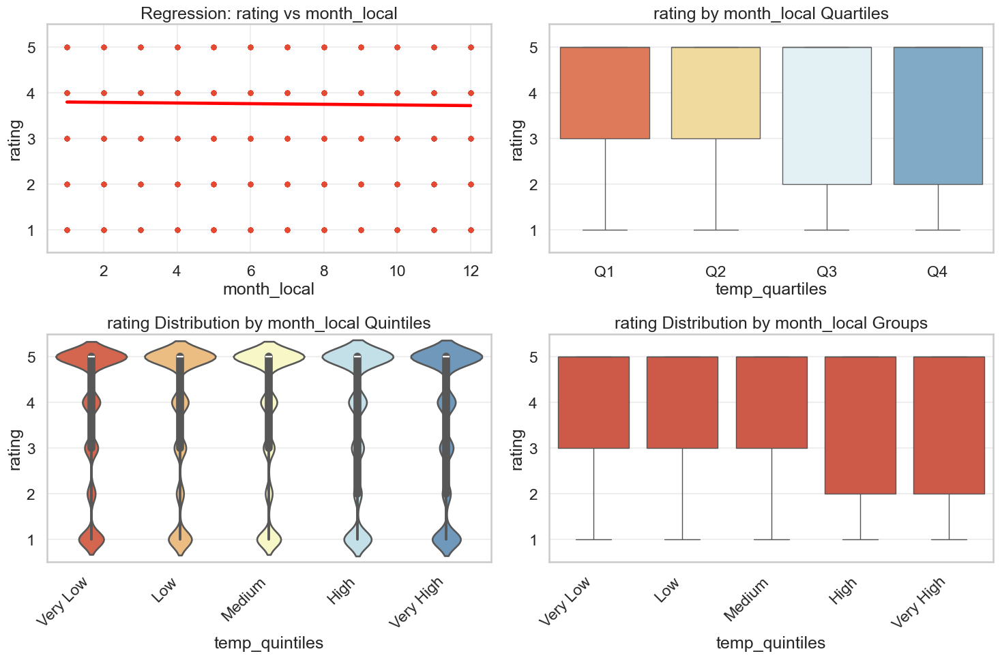

Correlation with rating: -0.015
Analyzing number_reviews vs rating
Could not create quartile plot for number_reviews
Could not create quintile plot for number_reviews


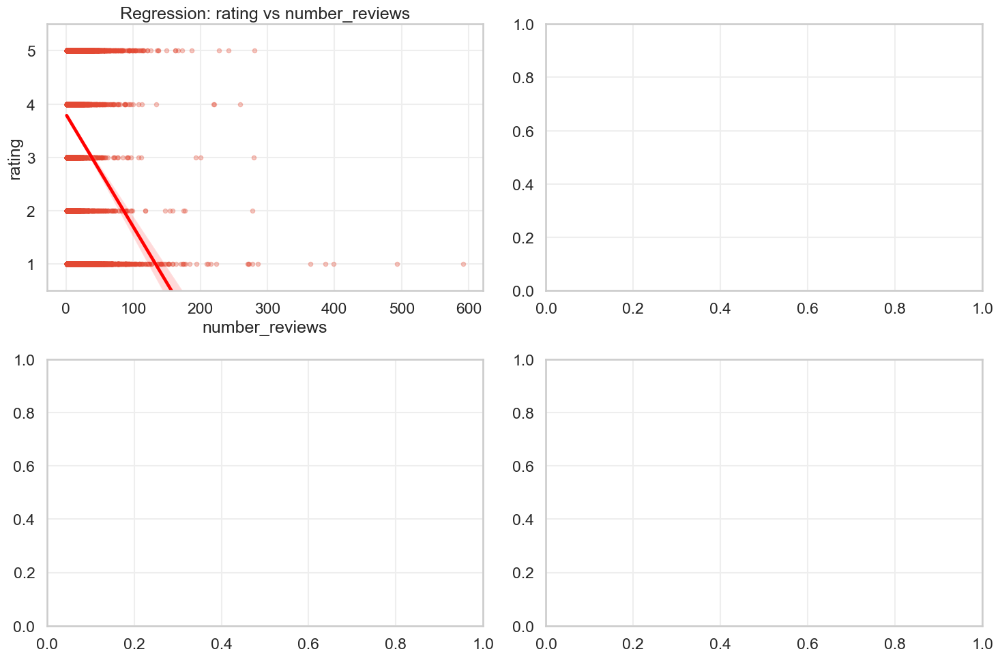

Correlation with rating: -0.077
Analyzing punctuation_counts vs rating


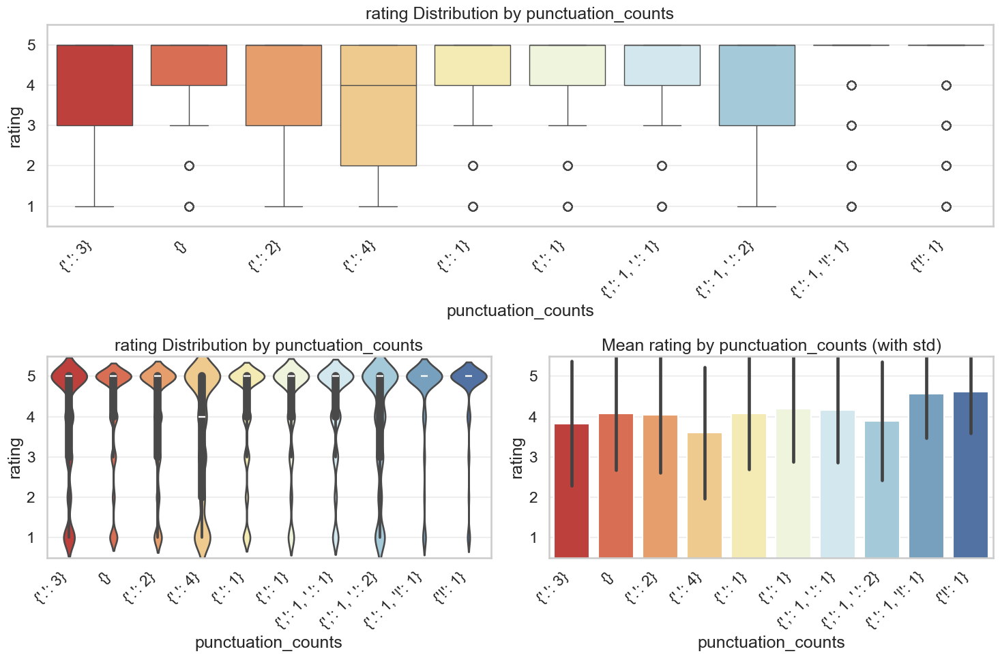

Summary Statistics for Top Categories:
                    count  mean   std  median
punctuation_counts                           
{'!': 1}             6338  4.61  1.02     5.0
{',': 1, '.': 1}     9042  4.16  1.30     5.0
{',': 1, '.': 2}     3653  3.89  1.47     5.0
{',': 1}             8147  4.20  1.33     5.0
{'.': 1, '!': 1}     3265  4.57  1.09     5.0
{'.': 1}            35234  4.08  1.39     5.0
{'.': 2}            26536  4.04  1.43     5.0
{'.': 3}            11949  3.83  1.54     5.0
{'.': 4}             5035  3.60  1.63     4.0
{}                  48898  4.09  1.41     5.0
Analyzing subject_length vs rating


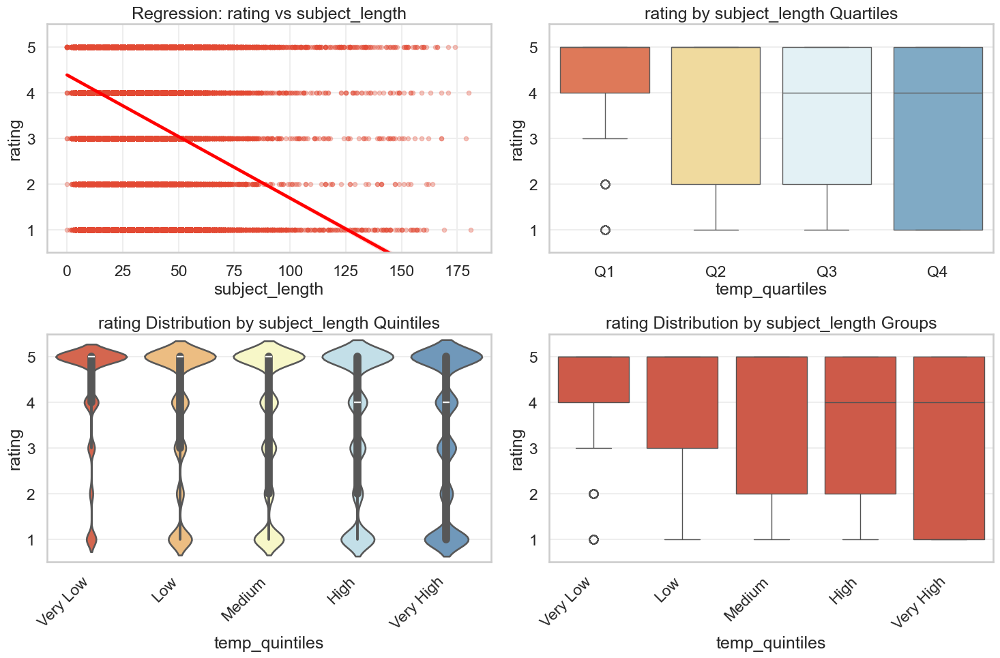

Correlation with rating: -0.183
Analyzing subject_word_length vs rating


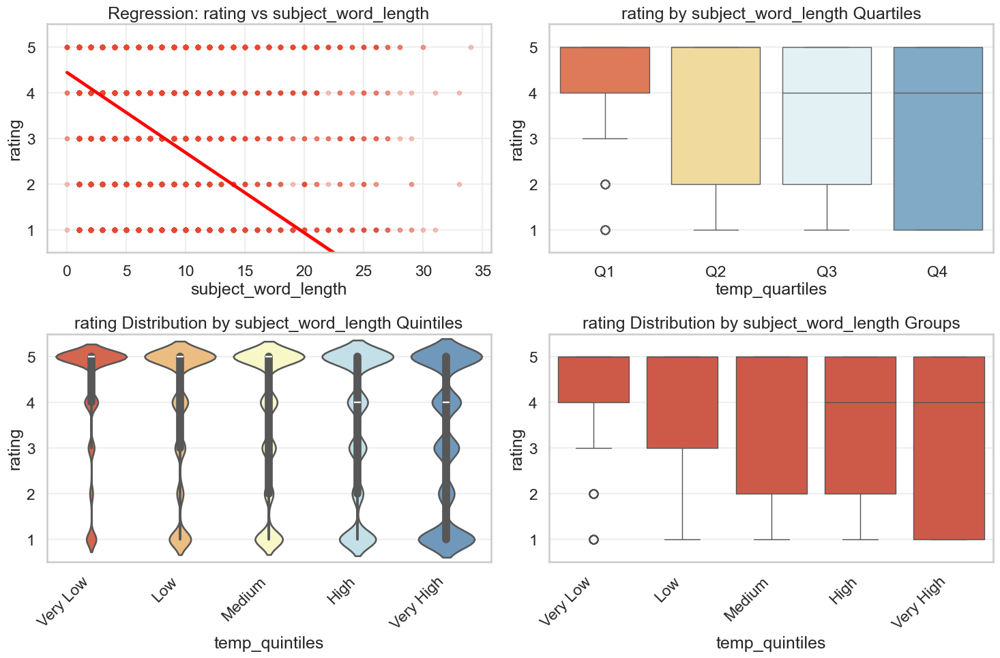

Correlation with rating: -0.198
Analyzing text_length vs rating


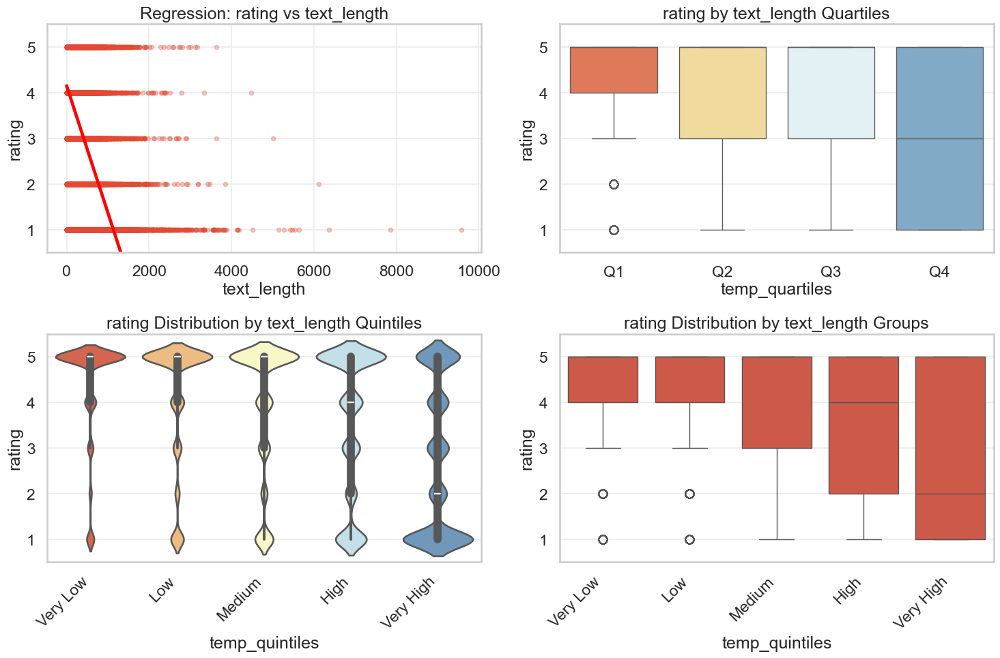

Correlation with rating: -0.335
Analyzing text_word_length vs rating


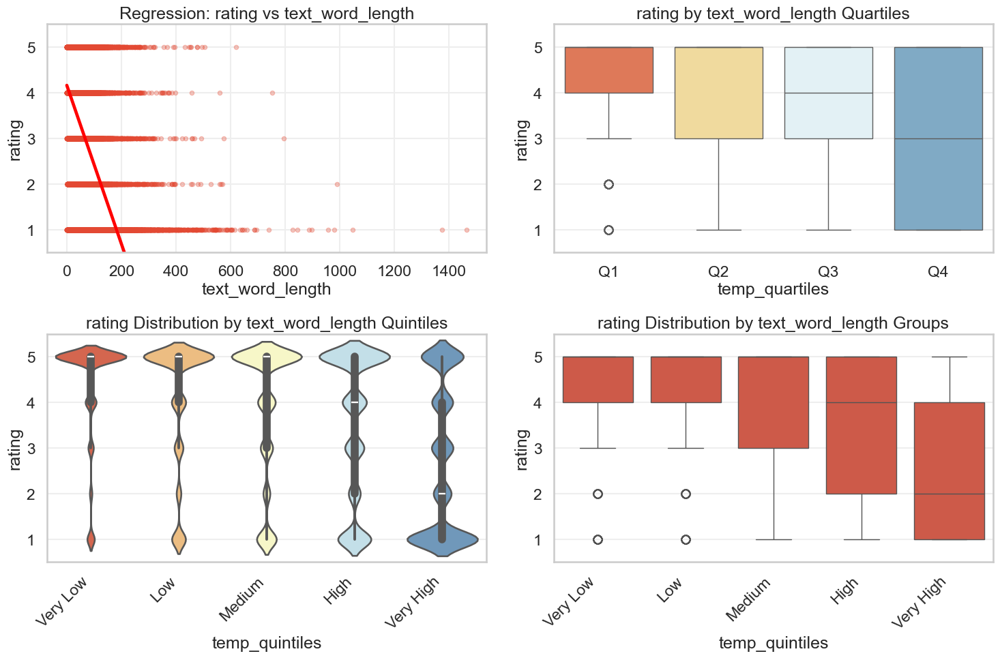

Correlation with rating: -0.343
Analyzing time_of_day vs rating


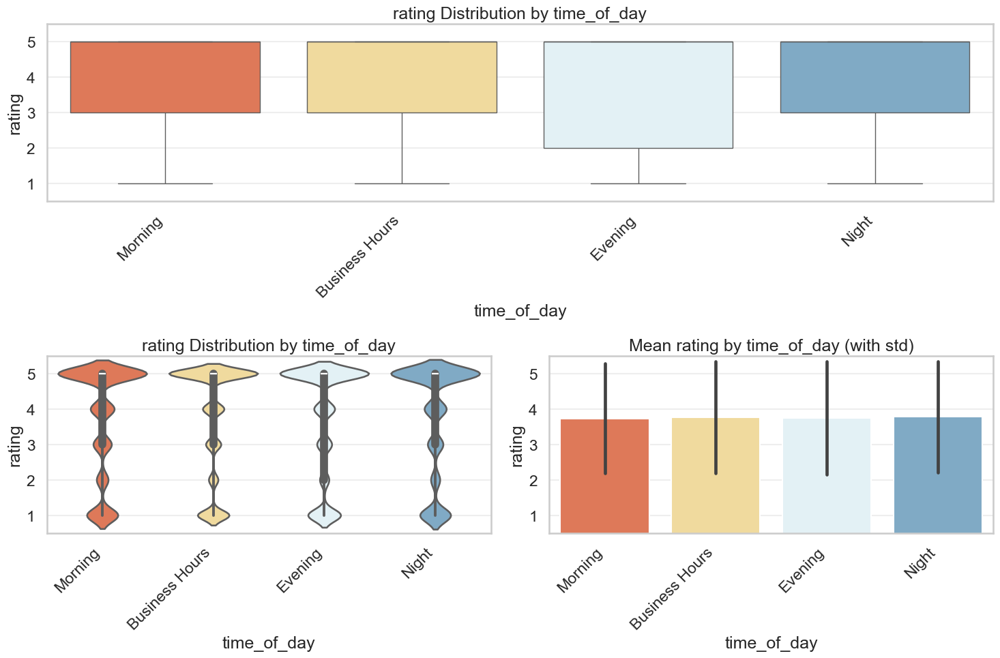

Summary Statistics for Top Categories:
                 count  mean   std  median
time_of_day                               
Business Hours  180595  3.76  1.58     5.0
Evening          70877  3.74  1.60     5.0
Morning          37201  3.73  1.56     5.0
Night            31414  3.78  1.57     5.0
Analyzing verification vs rating


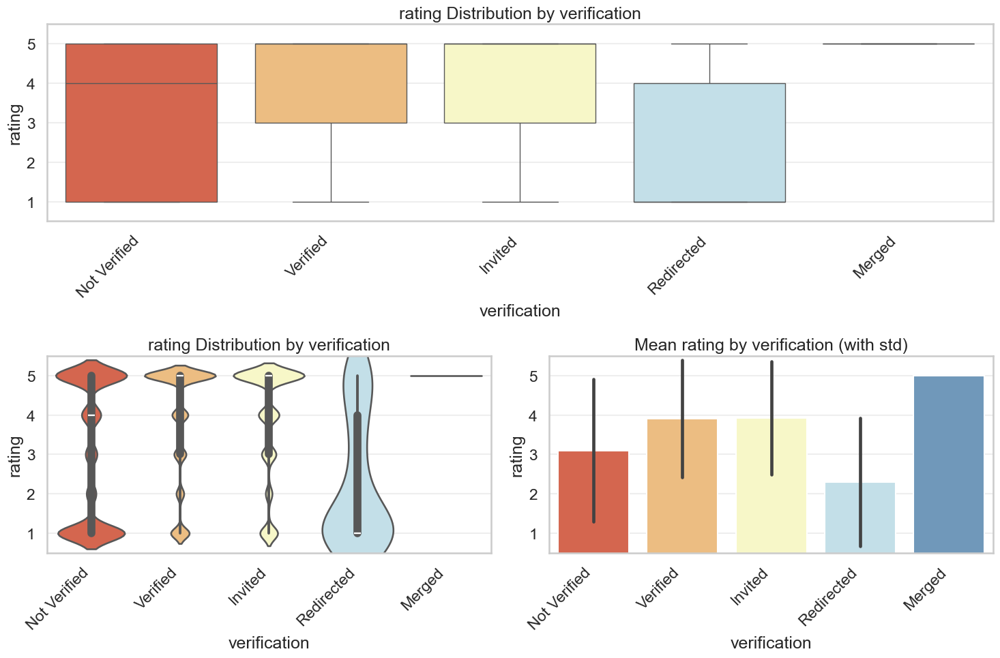

Summary Statistics for Top Categories:
               count  mean   std  median
verification                            
Invited        60799  3.93  1.44     5.0
Merged             1  5.00   NaN     5.0
Not Verified   61671  3.10  1.80     4.0
Redirected        73  2.30  1.63     1.0
Verified      197543  3.91  1.49     5.0


In [10]:
#Multivariate analysis of remaining columns

multivariate_pending_columns = list(set(df_trustpilot.columns) - 
                                  set(binary_columns) - 
                                  set(sentiment_columns) - 
                                  set(text_based_columns) - 
                                  set(administrative_columns))

def analyze_multivariate_pending(df, column, target='rating'):
    print(f"Analyzing {column} vs {target}")
    
    try:
        df[column].astype(float)
        is_numeric = True
    except:
        is_numeric = False
    
    if is_numeric:
        fig = plt.figure(figsize=(15, 10))
        gs = fig.add_gridspec(2, 2)
        
        # Scatter plot with regression line
        ax1 = fig.add_subplot(gs[0, 0])
        sns.regplot(data=df, x=column, y=target, 
                   scatter_kws={'alpha':0.3, 's':20},
                   line_kws={'color': 'red'},
                   ax=ax1)
        ax1.set_title(f'Regression: {target} vs {column}')
        ax1.set_ylim(0.5, 5.5)
        
        # Distribution by quartiles
        ax2 = fig.add_subplot(gs[0, 1])
        try:
            df['temp_quartiles'] = pd.qcut(df[column], q=4, 
                                         labels=['Q1', 'Q2', 'Q3', 'Q4'],
                                         duplicates='drop')
            sns.boxplot(data=df, x='temp_quartiles', y=target,
                       palette='RdYlBu',
                       ax=ax2)
            ax2.set_title(f'{target} by {column} Quartiles')
            ax2.set_ylim(0.5, 5.5)
        except:
            print(f"Could not create quartile plot for {column}")
            
        # Violin plot
        ax3 = fig.add_subplot(gs[1, 0])
        try:
            df['temp_quintiles'] = pd.qcut(df[column], q=5, 
                                         labels=['Very Low', 'Low', 'Medium', 'High', 'Very High'],
                                         duplicates='drop')
            sns.violinplot(data=df, x='temp_quintiles', y=target,
                         palette='RdYlBu',
                         ax=ax3)
            ax3.set_xticklabels(ax3.get_xticklabels(), rotation=45, ha='right')
            ax3.set_title(f'{target} Distribution by {column} Quintiles')
            ax3.set_ylim(0.5, 5.5)
        except:
            print(f"Could not create quintile plot for {column}")
            
        # Distribution plot
        ax4 = fig.add_subplot(gs[1, 1])
        if 'temp_quintiles' in df.columns:
            sns.boxplot(data=df, x='temp_quintiles', y=target, ax=ax4)
            ax4.set_xticklabels(ax4.get_xticklabels(), rotation=45, ha='right')
            ax4.set_title(f'{target} Distribution by {column} Groups')
            ax4.set_ylim(0.5, 5.5)
        
        plt.tight_layout()
        plt.show()
        
        df.drop(['temp_quartiles', 'temp_quintiles'], axis=1, errors='ignore', inplace=True)
        
        # Statistical analysis
        correlation = df[column].corr(df[target])
        print(f"Correlation with {target}: {correlation:.3f}")
        
    elif pd.api.types.is_datetime64_dtype(df[column]):
        fig = plt.figure(figsize=(15, 10))
        gs = fig.add_gridspec(2, 2)
        
        # Monthly boxplot
        ax1 = fig.add_subplot(gs[0, :])
        sns.boxplot(data=df, x=df[column].dt.month, y=target,
                   palette='RdYlBu',
                   ax=ax1)
        ax1.set_title(f'{target} Distribution by Month')
        ax1.set_xticklabels(['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun',
                            'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
        ax1.set_ylim(0.5, 5.5)
        
        # Monthly trend
        ax2 = fig.add_subplot(gs[1, 0])
        monthly_means = df.groupby(df[column].dt.month)[target].mean()
        sns.lineplot(data=monthly_means, marker='o', ax=ax2)
        ax2.set_title(f'Monthly {target} Trend')
        ax2.set_xticks(range(1, 13))
        ax2.set_xticklabels(['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun',
                            'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'],
                           rotation=45)
        ax2.set_ylim(0.5, 5.5)
        
        # Day of week analysis
        ax3 = fig.add_subplot(gs[1, 1])
        sns.boxplot(data=df, x=df[column].dt.dayofweek, y=target,
                   palette='RdYlBu',
                   ax=ax3)
        ax3.set_title(f'{target} by Day of Week')
        ax3.set_xticklabels(['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun'])
        ax3.set_ylim(0.5, 5.5)
        
        plt.tight_layout()
        plt.show()
        
    else:
        # Categorical analysis
        fig = plt.figure(figsize=(15, 10))
        gs = fig.add_gridspec(2, 2)
        
        # Get top categories
        top_cats = df[column].value_counts().head(10).index
        df_filtered = df[df[column].isin(top_cats)]
        
        # Boxplot
        ax1 = fig.add_subplot(gs[0, :])
        sns.boxplot(data=df_filtered, x=column, y=target,
                   palette='RdYlBu',
                   ax=ax1)
        ax1.set_xticklabels(ax1.get_xticklabels(), rotation=45, ha='right')
        ax1.set_title(f'{target} Distribution by {column}')
        ax1.set_ylim(0.5, 5.5)
        
        # Violin plot
        ax2 = fig.add_subplot(gs[1, 0])
        sns.violinplot(data=df_filtered, x=column, y=target,
                      palette='RdYlBu',
                      ax=ax2)
        ax2.set_xticklabels(ax2.get_xticklabels(), rotation=45, ha='right')
        ax2.set_title(f'{target} Distribution by {column}')
        ax2.set_ylim(0.5, 5.5)
        
        # Bar plot with error bars
        ax3 = fig.add_subplot(gs[1, 1])
        sns.barplot(data=df_filtered, x=column, y=target,
                   palette='RdYlBu',
                   ci='sd',
                   ax=ax3)
        ax3.set_xticklabels(ax3.get_xticklabels(), rotation=45, ha='right')
        ax3.set_title(f'Mean {target} by {column} (with std)')
        ax3.set_ylim(0.5, 5.5)
        
        plt.tight_layout()
        plt.show()
        
        # Statistical analysis
        print("Summary Statistics for Top Categories:")
        summary = df_filtered.groupby(column)[target].agg([
            'count', 'mean', 'std', 'median'
        ]).round(2)
        print(summary)

sns.set_theme(style="whitegrid", context="talk", palette="RdYlBu")
plt.rcParams['figure.facecolor'] = 'white'
plt.rcParams['axes.facecolor'] = 'white'
plt.rcParams['grid.color'] = '#EEEEEE'

for column in sorted(multivariate_pending_columns):
    if column not in binary_columns + sentiment_columns + ['rating']:
        analyze_multivariate_pending(df_trustpilot, column)

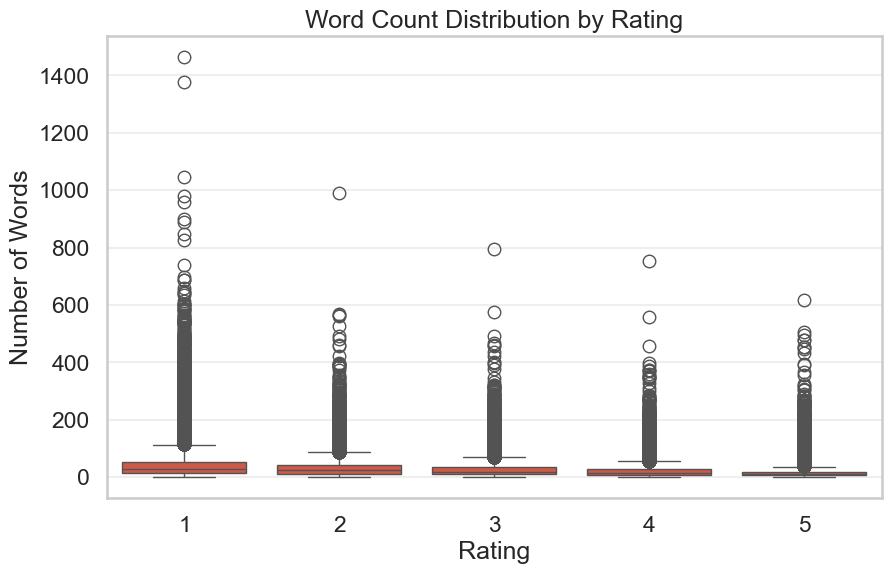

In [11]:
#Word length distribution by rating
plt.figure(figsize=(10, 6))
sns.boxplot(x='rating', y='text_word_length', data=df_trustpilot)
plt.title('Word Count Distribution by Rating')
plt.xlabel('Rating')
plt.ylabel('Number of Words')
plt.show()


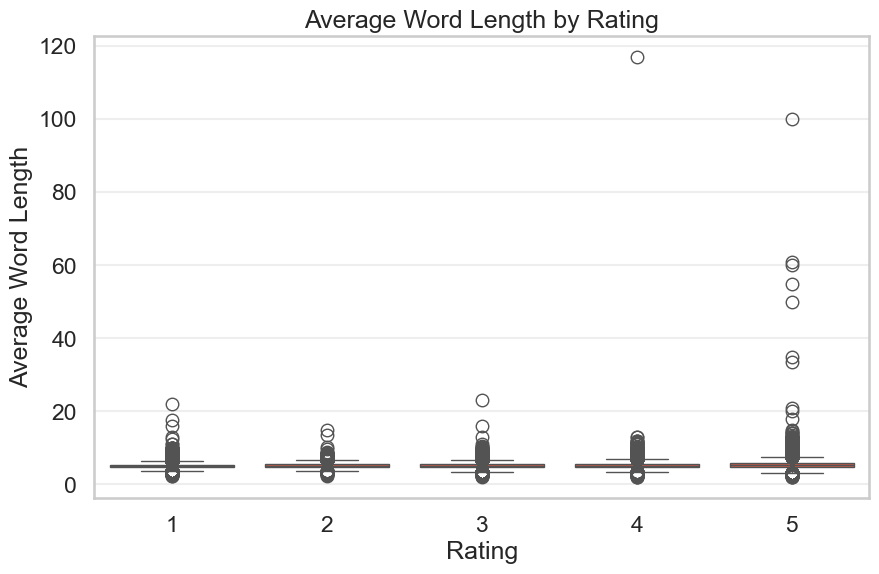

In [12]:
#Average word length by rating
df_trustpilot['avg_word_length'] = df_trustpilot['text_processed'].apply(lambda x: np.mean([len(word) for word in str(x).split()]) if pd.notna(x) else np.nan)
plt.figure(figsize=(10, 6))
sns.boxplot(x='rating', y='avg_word_length', data=df_trustpilot)
plt.title('Average Word Length by Rating')
plt.xlabel('Rating')
plt.ylabel('Average Word Length')
plt.show()

In [13]:
print(df_trustpilot.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 320087 entries, 0 to 320086
Data columns (total 36 columns):
 #   Column                            Non-Null Count   Dtype         
---  ------                            --------------   -----         
 0   rating                            320087 non-null  int64         
 1   location                          320087 non-null  object        
 2   username                          320069 non-null  object        
 3   number_reviews                    320087 non-null  int64         
 4   verification                      320087 non-null  object        
 5   repeat_reviewer                   320087 non-null  object        
 6   repeat_reviewer_encoded           320087 non-null  int64         
 7   company                           320087 non-null  object        
 8   text                              320087 non-null  object        
 9   text_processed                    320086 non-null  object        
 10  text_length                     

STAGE 3 - TEXT-BASED VISUALIZATIONS

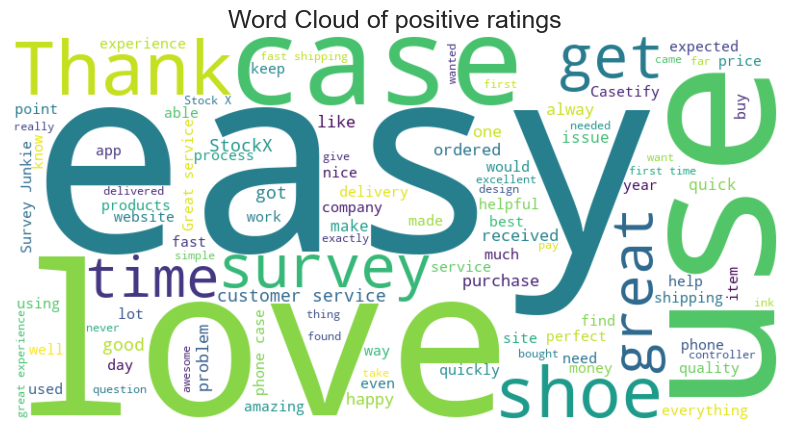

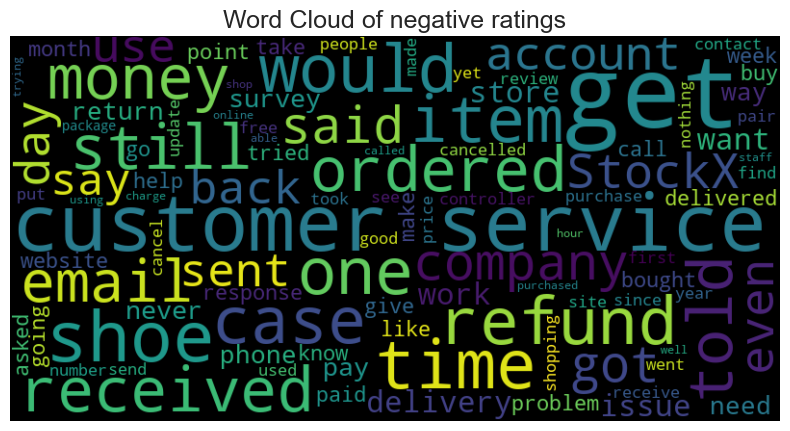

In [14]:
#Creating positive and negative wordclouds

# stop words
stop_words = set(stopwords.words('english'))
stop_words.update(["product", "order", "I've", "could", "I'm", "u", "also", "tell", "flashbay", "asda", "quicken", "steelseries"])

# splitting good and bad rated words
df_pos = df_trustpilot.loc[df_trustpilot["rating"]==5]
df_neg = df_trustpilot.loc[df_trustpilot["rating"]==1]

#creating positive word cloud
text = " ".join(df_pos["text"])
wordcloud = WordCloud(background_color="white", max_words=100, stopwords=stop_words, width = 800, height = 400). generate(text)
plt.figure(figsize = (10, 5))
plt.imshow(wordcloud, interpolation = "bilinear")
plt.axis("off")
plt.title("Word Cloud of positive ratings")
plt.show()

#creating negative word cloud
text = " ".join(df_neg["text"])
wordcloud = WordCloud(background_color="black", max_words=100, stopwords=stop_words, width = 800, height = 400). generate(text)
plt.figure(figsize = (10, 5))
plt.imshow(wordcloud, interpolation = "bilinear")
plt.title("Word Cloud of negative ratings")
plt.axis("off")
plt.show()


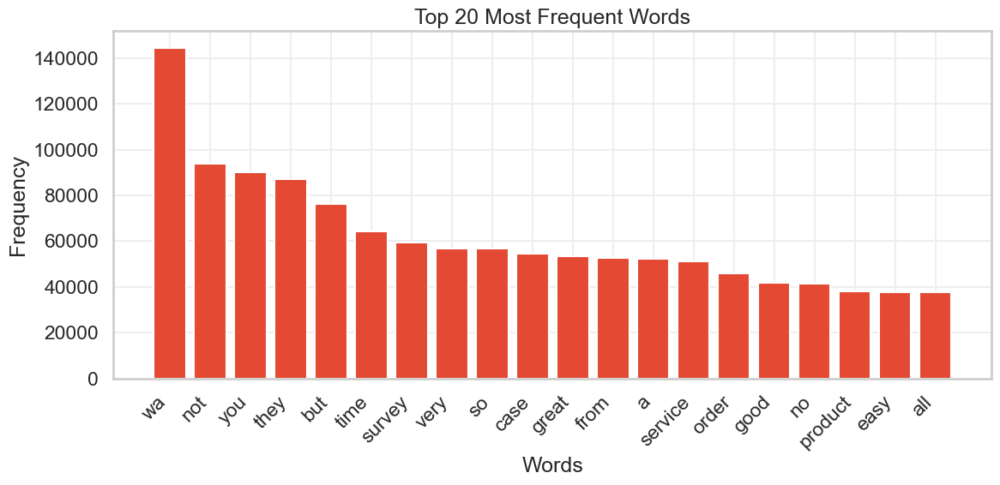

In [15]:
#Word Frequency plot
plt.figure(figsize=(12, 6))
word_freq = Counter(' '.join(df_trustpilot['text_processed'].dropna().astype(str)).split()).most_common(20)
words, counts = zip(*word_freq)
plt.bar(words, counts)
plt.xticks(rotation=45, ha='right')
plt.title('Top 20 Most Frequent Words')
plt.xlabel('Words')
plt.ylabel('Frequency')
plt.tight_layout()
plt.show()

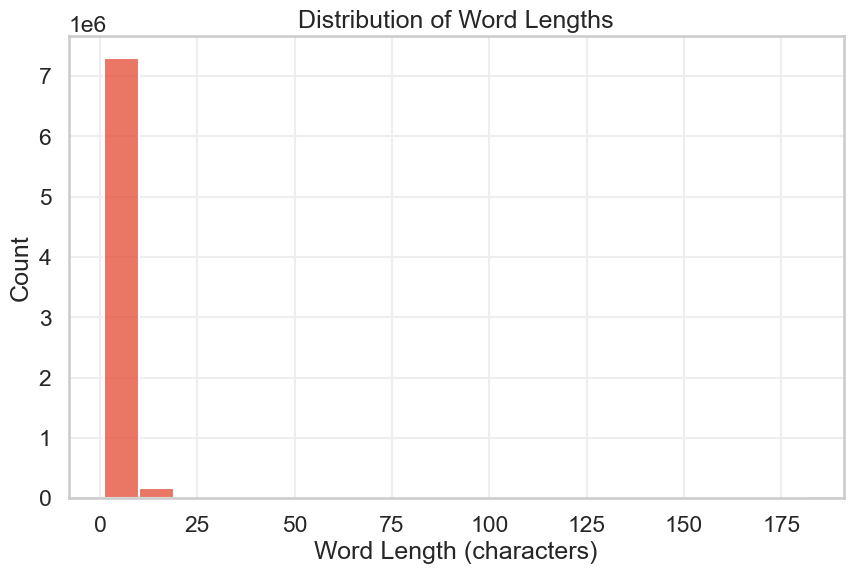

In [16]:
#Word Length distribution
df_trustpilot['text_processed'] = df_trustpilot['text_processed'].astype(str)
plt.figure(figsize=(10, 6))
word_lengths = [len(word) for word in ' '.join(df_trustpilot['text_processed']).split()]
sns.histplot(word_lengths, bins=20)
plt.title('Distribution of Word Lengths')
plt.xlabel('Word Length (characters)')
plt.ylabel('Count')
plt.show()

STAGE 4 - TIME SERIES PLOT

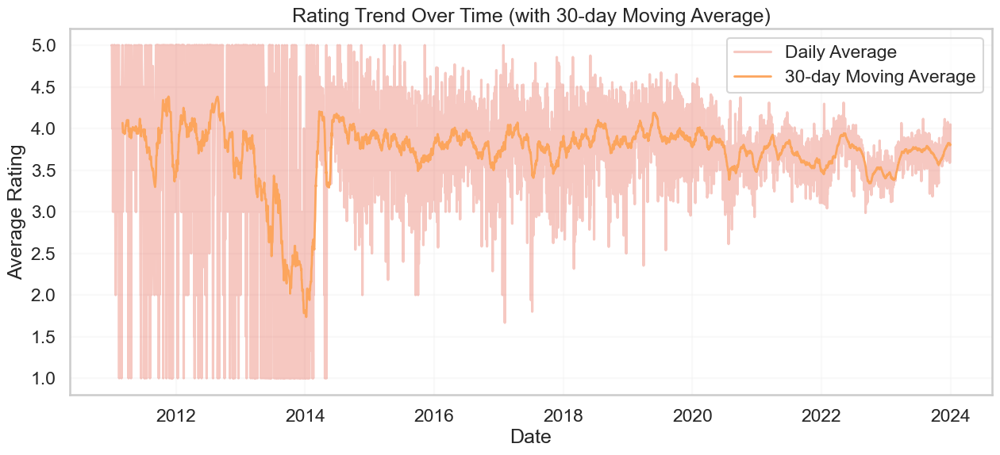

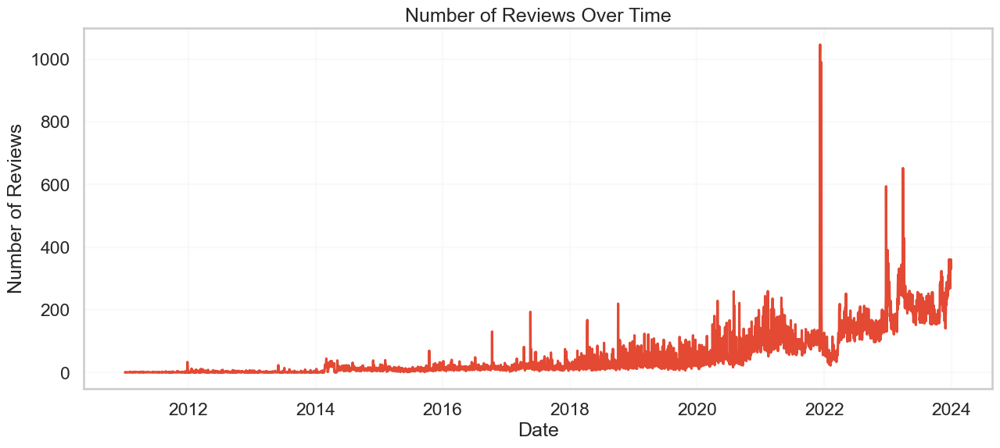

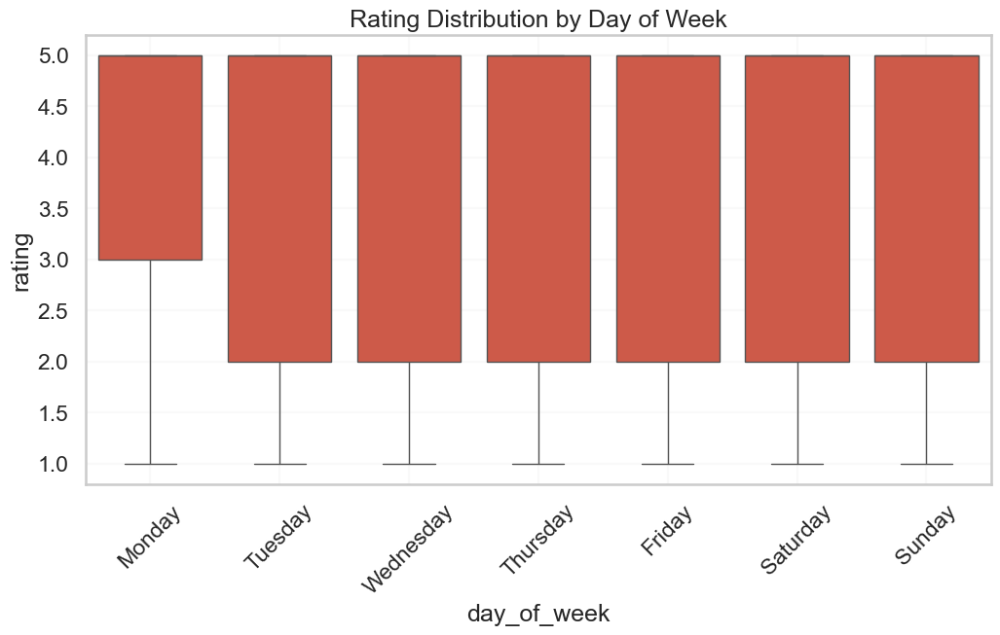

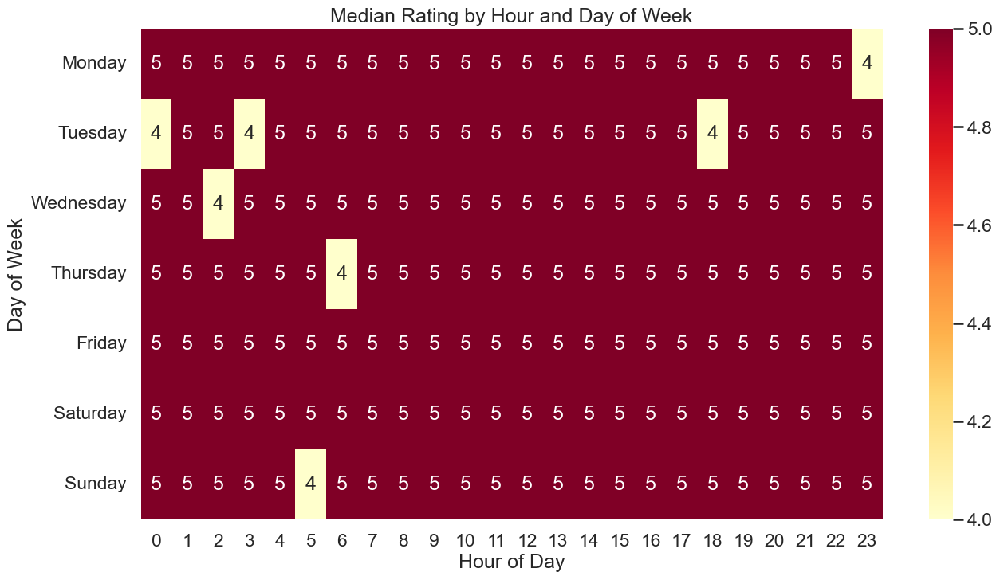

Time Series Statistics:
Start Date: 2011-01-02 00:00:00
End Date: 2023-12-31 00:00:00
Busiest Day: 2021-12-08 00:00:00 with 1046 reviews
Best Rating Day: 2011-01-02 00:00:00 with average rating of 5.00
Worst Rating Day: 2011-02-14 00:00:00 with average rating of 1.00


In [17]:
# Time series plot

# Defining reasonable date range
start_date = '2011-01-01'
end_date = '2023-12-31'

# Filtering the data
filtered_df = df_trustpilot[
    (df_trustpilot['local_date_posted'] >= start_date) & 
    (df_trustpilot['local_date_posted'] <= end_date)]

# Daily Average Rating Over Time 
daily_avg = filtered_df.groupby('local_date_posted')['rating'].mean()

# Rolling Average to Smooth Daily 
plt.figure(figsize=(15, 6))
rolling_avg = daily_avg.rolling(window=30).mean()
plt.plot(daily_avg.index, daily_avg.values, alpha=0.3, label='Daily Average')
plt.plot(rolling_avg.index, rolling_avg.values, linewidth=2, label='30-day Moving Average')
plt.title('Rating Trend Over Time (with 30-day Moving Average)')
plt.xlabel('Date')
plt.ylabel('Average Rating')
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()

# Volume of Reviews Over Time
plt.figure(figsize=(15, 6))
daily_count = filtered_df.groupby('local_date_posted').size()
plt.plot(daily_count.index, daily_count.values)
plt.title('Number of Reviews Over Time')
plt.xlabel('Date')
plt.ylabel('Number of Reviews')
plt.grid(True, alpha=0.3)
plt.show()

# Day of Week Analysis
plt.figure(figsize=(12, 6))
filtered_df['day_of_week'] = filtered_df['local_date_posted'].dt.day_name()
day_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
sns.boxplot(data=filtered_df, x='day_of_week', y='rating', order=day_order)
plt.title('Rating Distribution by Day of Week')
plt.xticks(rotation=45)
plt.grid(True, alpha=0.3)
plt.show()

# Heatmap: Hour vs Day of Week
plt.figure(figsize=(15, 8))
pivot_table = filtered_df.pivot_table(
    values='rating',
    index=filtered_df['local_date_posted'].dt.day_name(),
    columns='local_hour',
    aggfunc='median')
pivot_table = pivot_table.reindex(day_order)
pivot_table = pivot_table.round(0)
sns.heatmap(pivot_table, cmap='YlOrRd', annot=True, fmt='.0f')
plt.title('Median Rating by Hour and Day of Week')
plt.xlabel('Hour of Day')
plt.ylabel('Day of Week')
plt.show()

# Print statistics
print("Time Series Statistics:")
print(f"Start Date: {filtered_df['local_date_posted'].min()}")
print(f"End Date: {filtered_df['local_date_posted'].max()}")
print(f"Busiest Day: {daily_count.idxmax()} with {daily_count.max()} reviews")
print(f"Best Rating Day: {daily_avg.idxmax()} with average rating of {daily_avg.max():.2f}")
print(f"Worst Rating Day: {daily_avg.idxmin()} with average rating of {daily_avg.min():.2f}")

STAGE 5 - GROUPBY ANALYSES

LOCATION ANALYSIS
Basic Location Metrics:
          Total_Reviews  Avg_Rating  Std_Rating  Median_Rating  \
location                                                         
AU                 9806       3.762       1.528            5.0   
CA                12541       3.848       1.530            5.0   
GB                30826       2.749       1.817            2.0   
HK                 3120       3.374       1.590            4.0   
IN                 3190       3.972       1.381            5.0   
KR                 2232       3.789       1.435            4.0   
PH                 3731       4.388       1.111            5.0   
SG                 2448       3.940       1.418            5.0   
TH                 2284       4.276       1.217            5.0   
US               216645       3.850       1.520            5.0   

          Pct_Repeat_Reviewers  Pct_Verified  
location                                      
AU                       0.406           0.0  
CA                      

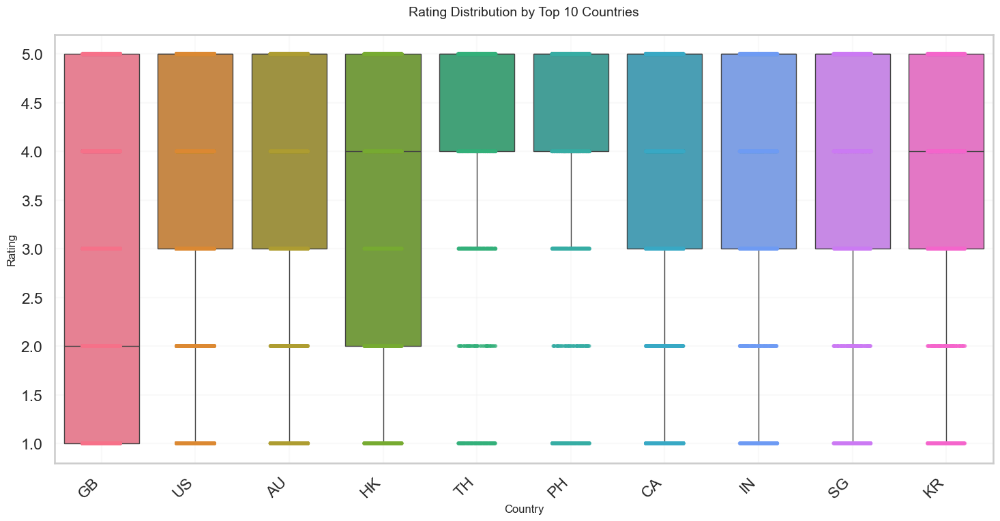

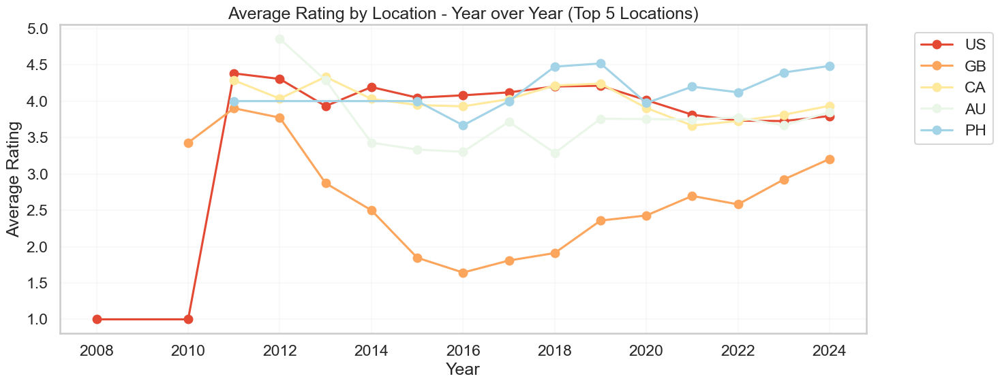

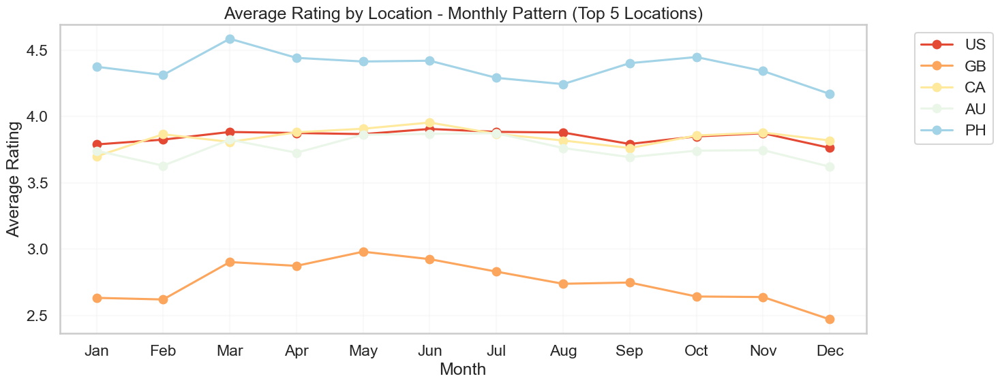

Summary Statistics by Location:
           count  mean  median   std
location                            
AU          9806  3.76     5.0  1.53
CA         12541  3.85     5.0  1.53
GB         30826  2.75     2.0  1.82
HK          3120  3.37     4.0  1.59
IN          3190  3.97     5.0  1.38
KR          2232  3.79     4.0  1.44
PH          3731  4.39     5.0  1.11
SG          2448  3.94     5.0  1.42
TH          2284  4.28     5.0  1.22
US        216645  3.85     5.0  1.52


In [18]:
# Location Analysis
print("LOCATION ANALYSIS")

# Get top 10 locations and filter DataFrame
top_locations = df_trustpilot['location'].value_counts().head(10).index
df_filtered = df_trustpilot[df_trustpilot['location'].isin(top_locations)]

# Basic metrics by location (separated by data type)
numeric_analysis = df_filtered.groupby('location').agg({
    'rating': ['count', 'mean', 'std', 'median'],
    'repeat_reviewer_encoded': 'mean'}).round(3)

# Handle verification separately (categorical)
verification_pcts = df_filtered.groupby('location')['verification'].apply(
    lambda x: (x == 'verified').mean()).round(3)

# Combine the analyses
location_analysis = numeric_analysis.copy()
location_analysis['verification'] = verification_pcts

# Flatten column names
location_analysis.columns = ['Total_Reviews', 'Avg_Rating', 'Std_Rating', 
                           'Median_Rating', 'Pct_Repeat_Reviewers', 'Pct_Verified']
print("Basic Location Metrics:")
print(location_analysis)

# Day of week distribution by location
day_distribution = pd.crosstab(df_filtered['location'], 
                              df_filtered['day_of_week_posted'], 
                              normalize='index').round(3) * 100
print("Day of Week Distribution by Location (%):")
print(day_distribution)

# Time of day distribution by location
time_distribution = pd.crosstab(df_filtered['location'], 
                               df_filtered['time_of_day'], 
                               normalize='index').round(3) * 100
print("Time of Day Distribution by Location (%):")
print(time_distribution)

# Rating distribution by location
rating_distribution = pd.crosstab(df_filtered['location'], 
                                 df_filtered['rating'], 
                                 normalize='index').round(3) * 100
print("Rating Distribution by Location (%):")
print(rating_distribution)

# Recent trends (last 90 days)
recent_cutoff = df_filtered['local_date_posted'].max() - pd.Timedelta(days=90)
recent_data = df_filtered[df_filtered['local_date_posted'] >= recent_cutoff]

recent_numeric = recent_data.groupby('location').agg({
    'rating': ['count', 'mean']
}).round(3)

recent_verification = recent_data.groupby('location')['verification'].apply(
    lambda x: (x == 'verified').mean()
).round(3)

recent_repeat = recent_data.groupby('location')['repeat_reviewer_encoded'].mean().round(3)

# Combine recent analyses
recent_analysis = pd.DataFrame({
    'Recent_Review_Count': recent_numeric[('rating', 'count')],
    'Recent_Avg_Rating': recent_numeric[('rating', 'mean')],
    'Recent_Verification_Rate': recent_verification,
    'Recent_Repeat_Reviewer_Rate': recent_repeat})

print("Recent 90-Day Metrics by Location:")
print(recent_analysis)

# Visualizations
plt.figure(figsize=(15, 8))
sns.boxplot(x='location', y='rating', data=df_filtered,
            palette='husl',
            showfliers=False)
sns.stripplot(x='location', y='rating', data=df_filtered,
              palette='husl',
              size=4,
              jitter=0.2,
              alpha=0.5)
plt.title('Rating Distribution by Top 10 Countries', fontsize=14, pad=20)
plt.xlabel('Country', fontsize=12)
plt.ylabel('Rating', fontsize=12)
plt.xticks(rotation=45, ha='right')
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

# Year over Year Analysis (Top 5)
top_5_locations = df_trustpilot['location'].value_counts().head(5).index
df_filtered_top5 = df_filtered[df_filtered['location'].isin(top_5_locations)]

plt.figure(figsize=(15, 6))
for location in top_5_locations:
    yearly_avg = df_filtered_top5[df_filtered_top5['location'] == location].groupby(
        df_filtered_top5['local_date_posted'].dt.year)['rating'].mean()
    plt.plot(yearly_avg.index, yearly_avg.values, marker='o', label=location)

plt.title('Average Rating by Location - Year over Year (Top 5 Locations)')
plt.xlabel('Year')
plt.ylabel('Average Rating')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

# Month over Month Analysis (Top 5)
plt.figure(figsize=(15, 6))
for location in top_5_locations:
    location_data = df_filtered_top5[df_filtered_top5['location'] == location]
    monthly_avg = location_data.groupby(
        location_data['local_date_posted'].dt.month)['rating'].mean()
    plt.plot(range(1, 13), monthly_avg, marker='o', label=location)

plt.title('Average Rating by Location - Monthly Pattern (Top 5 Locations)')
plt.xlabel('Month')
plt.ylabel('Average Rating')
plt.xticks(range(1, 13), 
          ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun',
           'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

print("Summary Statistics by Location:")
print(df_filtered.groupby('location')['rating'].agg(['count', 'mean', 'median', 'std']).round(2))

In [19]:
#Choropleth plot

# Aggregate ratings by location
location_ratings = df_trustpilot.groupby('location')['rating'].mean().reset_index()

# Convert ISO-2 to ISO-3 country codes
cc = coco.CountryConverter()
location_ratings['location_iso3'] = cc.convert(location_ratings['location'], to='ISO3')

# Create choropleth map
fig = px.choropleth(location_ratings,
                    locations='location_iso3', 
                    locationmode='ISO-3', 
                    color='rating',
                    color_continuous_scale="RdYlGn",
                    range_color=(1, 5),
                    title='Average Ratings by Country',
                    labels={'rating': 'Average Rating'})

# Update layout
fig.update_layout(
    margin={"r":0,"t":30,"l":0,"b":0},
    title_x=0.5,
    geo=dict(
        showframe=False,
        showcoastlines=True,
        projection_type='equirectangular'))

print("Rating statistics:")
print(location_ratings['rating'].describe())

fig.show()

Rating statistics:
count    209.000000
mean       3.873778
std        0.566248
min        1.000000
25%        3.625000
50%        3.905782
75%        4.105882
max        5.000000
Name: rating, dtype: float64


USERNAME ANALYSIS
Analyzing user patterns for top 10 companies:
company
StockX          84278
CASETiFY        55560
SurveyJunkie    28831
PDFSimpli       27198
Quicken         26752
Toluna          23549
Inkfarm.com     21764
Asda            12576
SteelSeries     12423
SCUFGaming      10385
Name: count, dtype: int64
USER ANALYSIS FOR StockX
Top 5 reviewers for StockX:
username
Customer      1065
Guest User     911
Michael        222
David          180
Chris          160
Name: count, dtype: int64
Reviewer Metrics for StockX:
            Total_Reviews  Avg_Rating  Std_Rating  Median_Rating  \
username                                                           
Chris                 160       3.762       1.643            5.0   
Customer             1065       3.990       1.557            5.0   
David                 180       3.861       1.616            5.0   
Guest User            911       4.190       1.460            5.0   
Michael               222       3.662       1.685            5

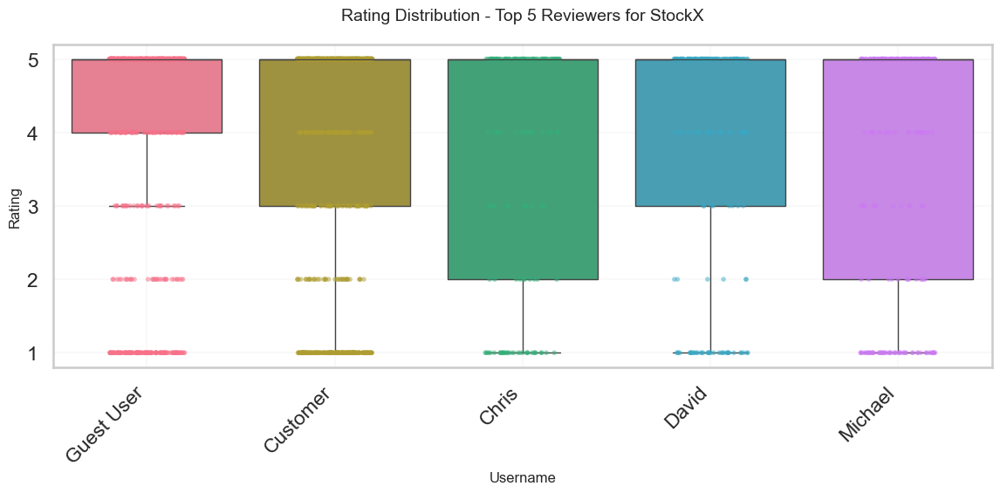

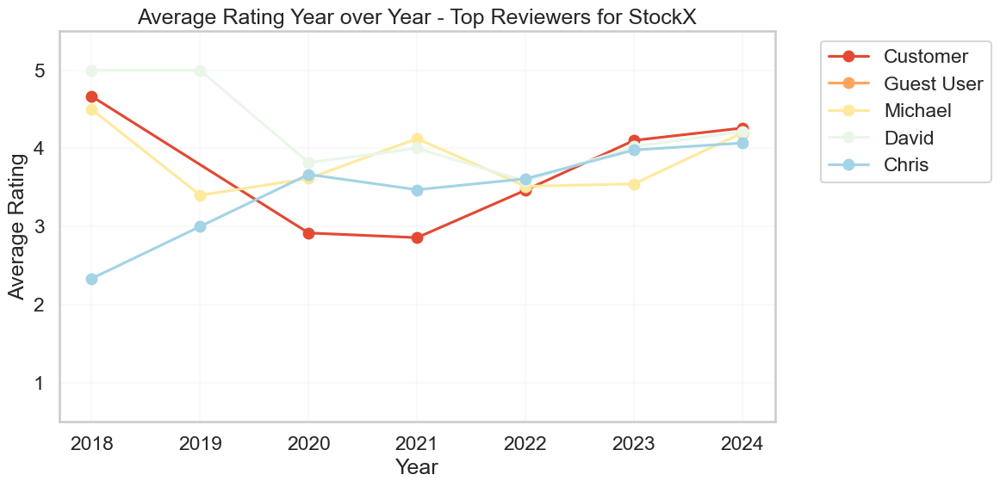

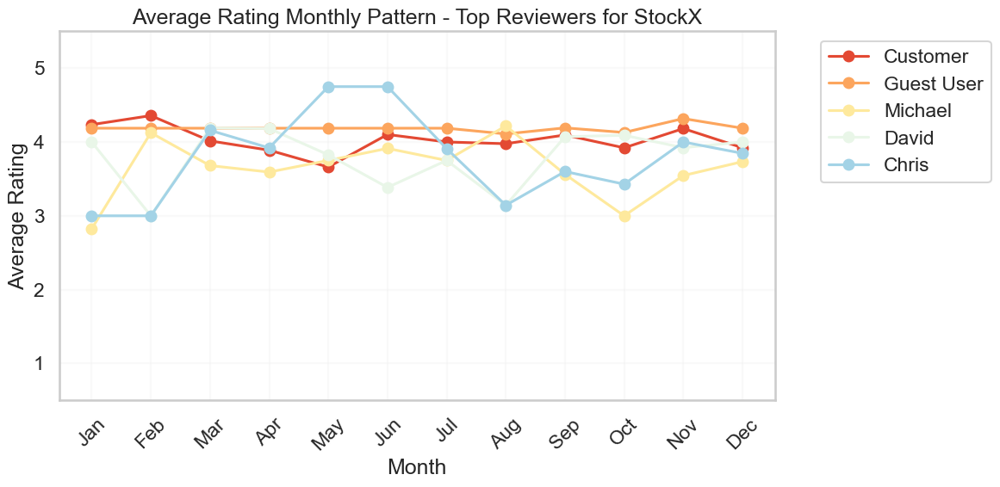

USER ANALYSIS FOR CASETiFY
Top 5 reviewers for CASETiFY:
username
Customer    634
Emily        81
Sarah        80
Michelle     59
Jessica      57
Name: count, dtype: int64
Reviewer Metrics for CASETiFY:
          Total_Reviews  Avg_Rating  Std_Rating  Median_Rating  \
username                                                         
Customer            634       3.385       1.603            4.0   
Emily                81       3.716       1.567            4.0   
Jessica              57       3.474       1.465            4.0   
Michelle             59       3.627       1.691            5.0   
Sarah                80       3.312       1.548            3.5   

          Pct_Repeat_Reviewer  Pct_Verified  
username                                     
Customer                0.626           0.0  
Emily                   0.346           0.0  
Jessica                 0.333           0.0  
Michelle                0.508           0.0  
Sarah                   0.338           0.0  


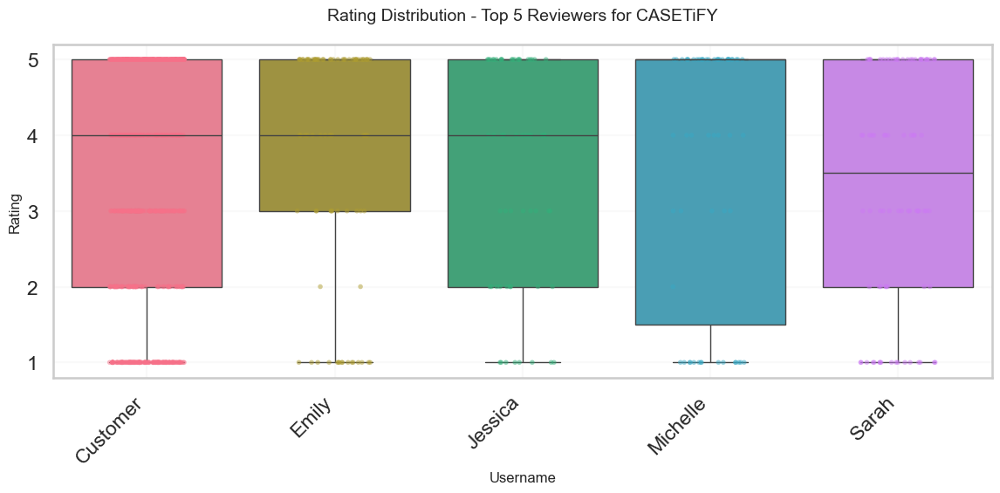

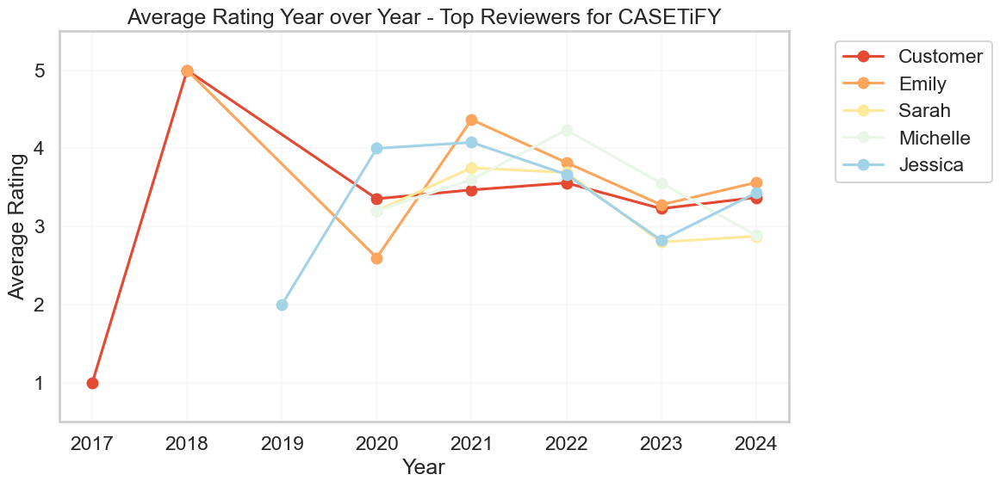

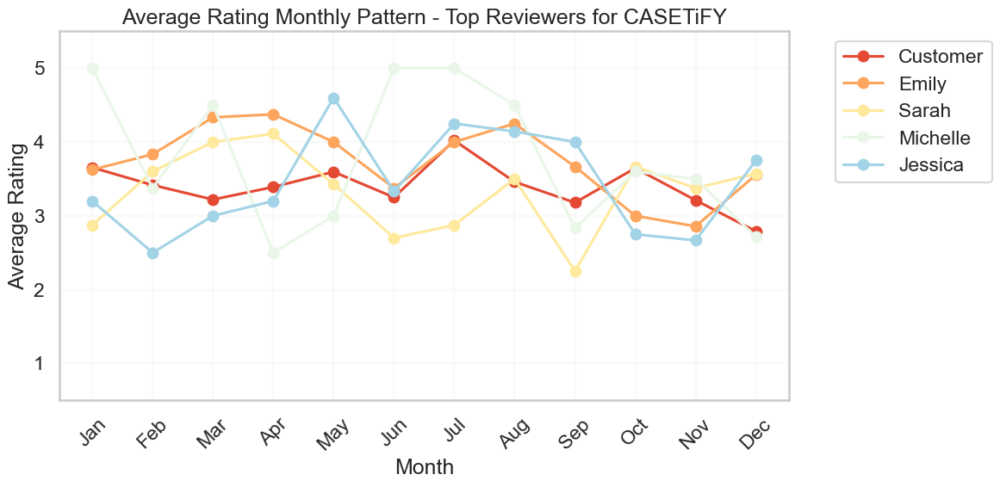

USER ANALYSIS FOR SurveyJunkie
Top 5 reviewers for SurveyJunkie:
username
Customer    296
John         41
Michael      39
David        34
Robert       34
Name: count, dtype: int64
Reviewer Metrics for SurveyJunkie:
          Total_Reviews  Avg_Rating  Std_Rating  Median_Rating  \
username                                                         
Customer            296       4.189       1.195            5.0   
David                34       4.294       1.115            5.0   
John                 41       4.049       1.224            4.0   
Michael              39       4.231       1.327            5.0   
Robert               34       4.529       0.825            5.0   

          Pct_Repeat_Reviewer  Pct_Verified  
username                                     
Customer                0.895           0.0  
David                   0.588           0.0  
John                    0.585           0.0  
Michael                 0.462           0.0  
Robert                  0.559           0.0  


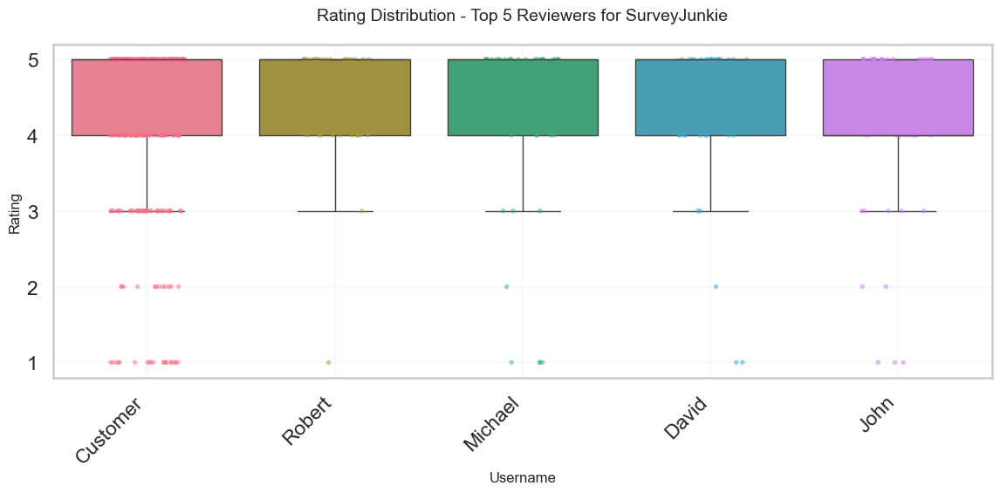

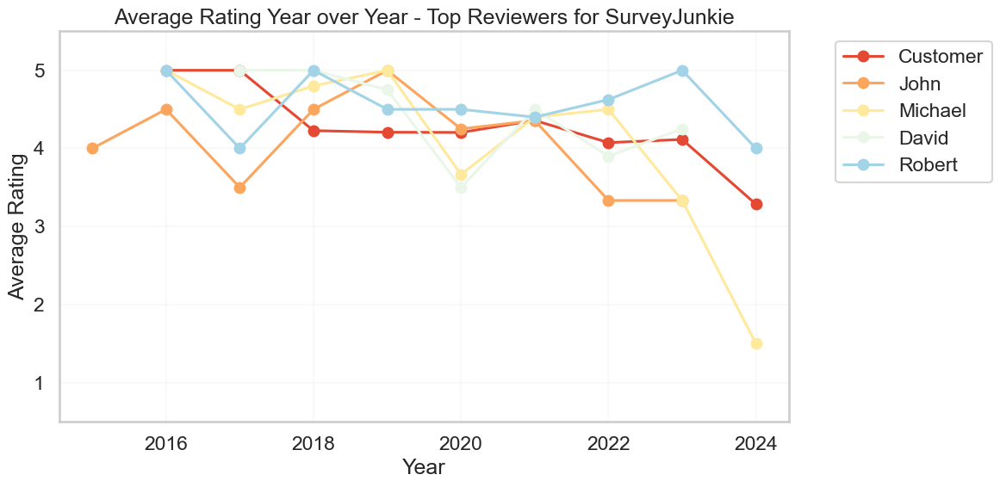

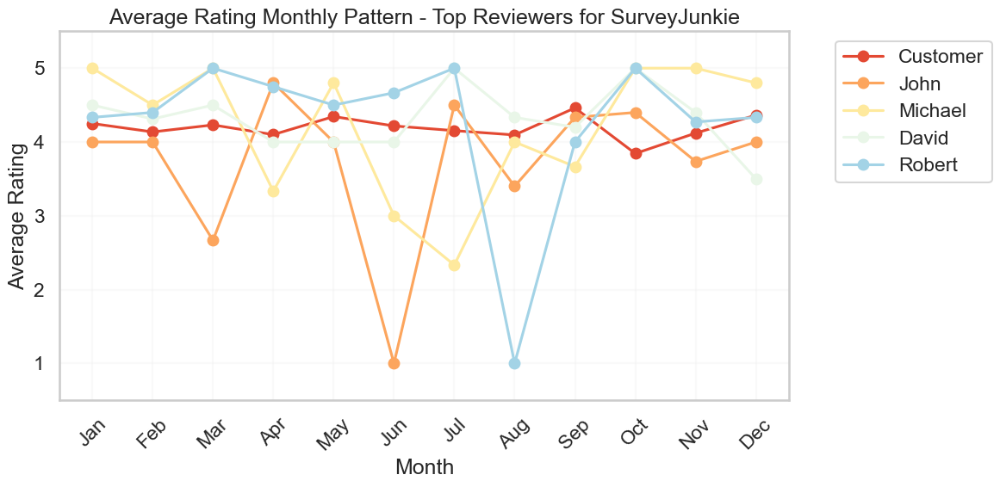

USER ANALYSIS FOR PDFSimpli
Top 5 reviewers for PDFSimpli:
username
Customer    226
John         54
Chris        43
Mike         37
Sam          33
Name: count, dtype: int64
Reviewer Metrics for PDFSimpli:
          Total_Reviews  Avg_Rating  Std_Rating  Median_Rating  \
username                                                         
Chris                43       3.698       1.641            5.0   
Customer            226       3.376       1.688            4.0   
John                 54       3.537       1.712            4.0   
Mike                 37       3.649       1.585            4.0   
Sam                  33       4.030       1.510            5.0   

          Pct_Repeat_Reviewer  Pct_Verified  
username                                     
Chris                   0.163           0.0  
Customer                0.628           0.0  
John                    0.426           0.0  
Mike                    0.054           0.0  
Sam                     0.242           0.0  


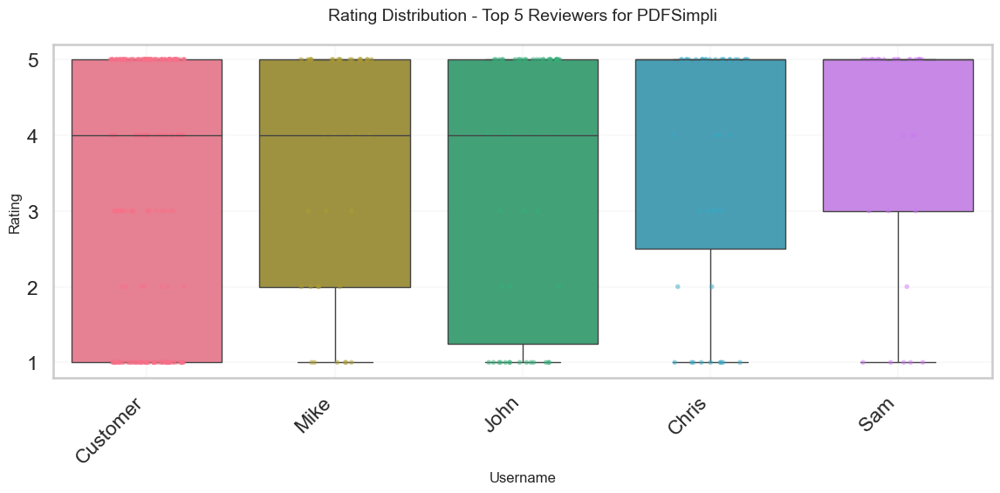

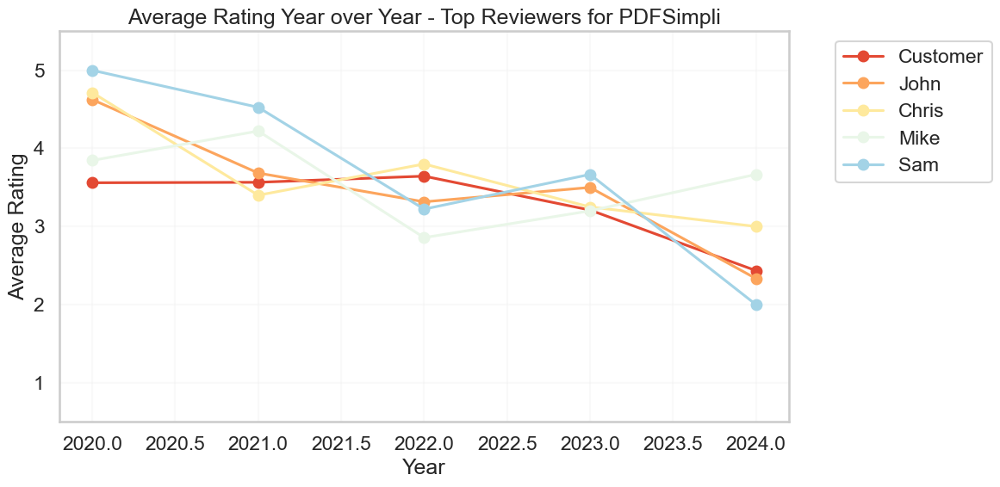

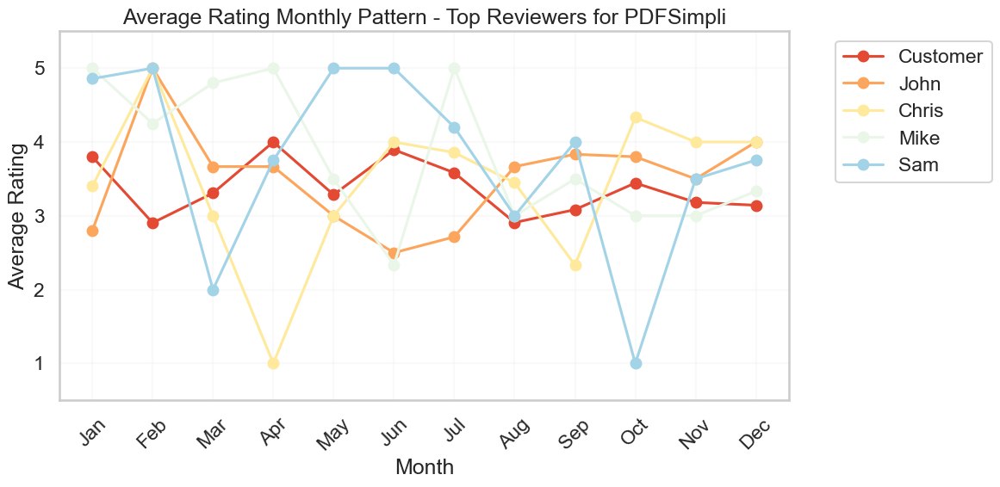

USER ANALYSIS FOR Quicken
Top 5 reviewers for Quicken:
username
Customer    521
John        109
David        73
Michael      68
Richard      58
Name: count, dtype: int64
Reviewer Metrics for Quicken:
          Total_Reviews  Avg_Rating  Std_Rating  Median_Rating  \
username                                                         
Customer            521       3.564       1.355            4.0   
David                73       3.534       1.375            4.0   
John                109       3.422       1.383            4.0   
Michael              68       3.206       1.451            3.0   
Richard              58       3.776       1.215            4.0   

          Pct_Repeat_Reviewer  Pct_Verified  
username                                     
Customer                0.710           0.0  
David                   0.781           0.0  
John                    0.761           0.0  
Michael                 0.765           0.0  
Richard                 0.810           0.0  


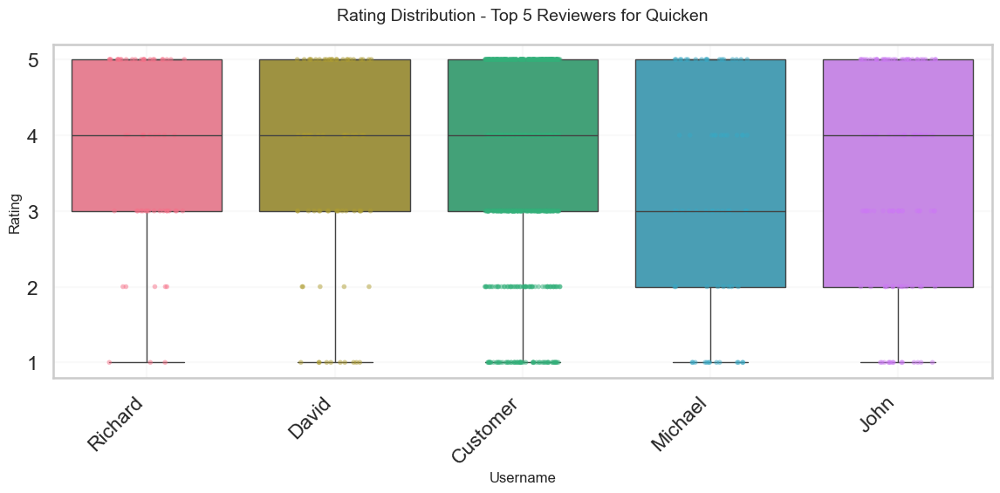

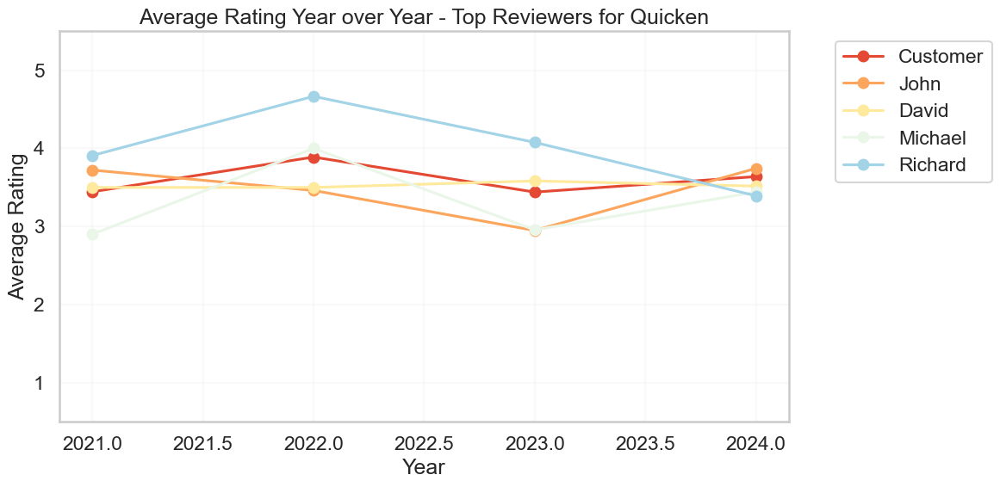

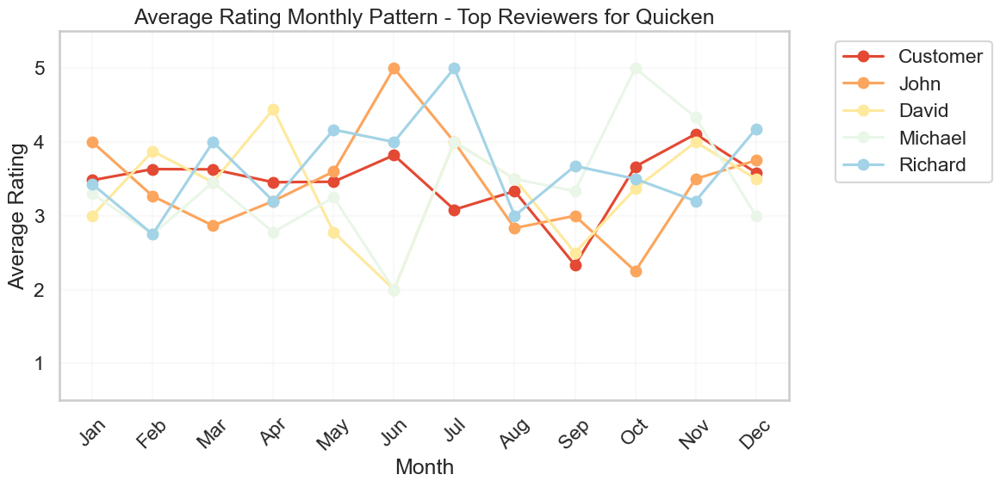

USER ANALYSIS FOR Toluna
Top 5 reviewers for Toluna:
username
Customer    356
John         43
David        32
Paul         24
Michael      23
Name: count, dtype: int64
Reviewer Metrics for Toluna:
          Total_Reviews  Avg_Rating  Std_Rating  Median_Rating  \
username                                                         
Customer            356       3.874       1.463            5.0   
David                32       3.781       1.699            5.0   
John                 43       3.744       1.364            4.0   
Michael              23       3.435       1.619            4.0   
Paul                 24       3.208       1.444            3.0   

          Pct_Repeat_Reviewer  Pct_Verified  
username                                     
Customer                0.938           0.0  
David                   0.875           0.0  
John                    0.860           0.0  
Michael                 0.870           0.0  
Paul                    0.917           0.0  


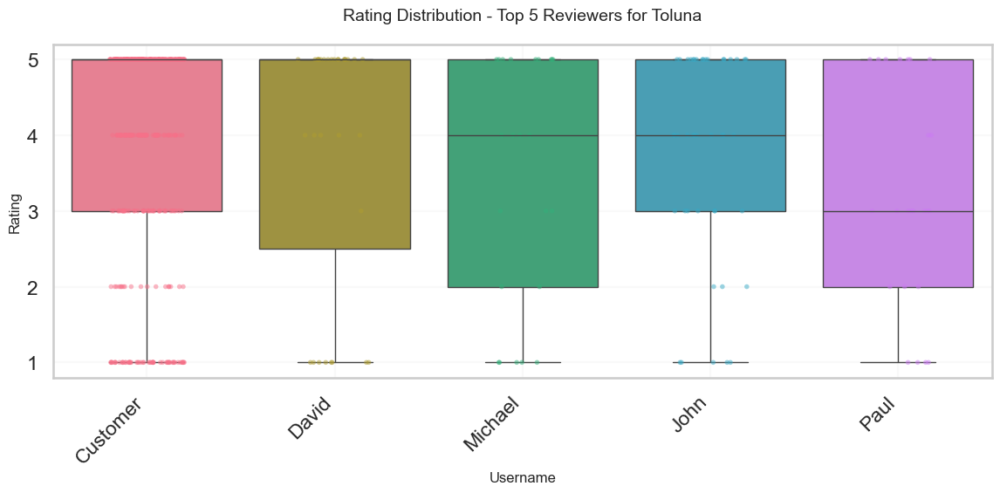

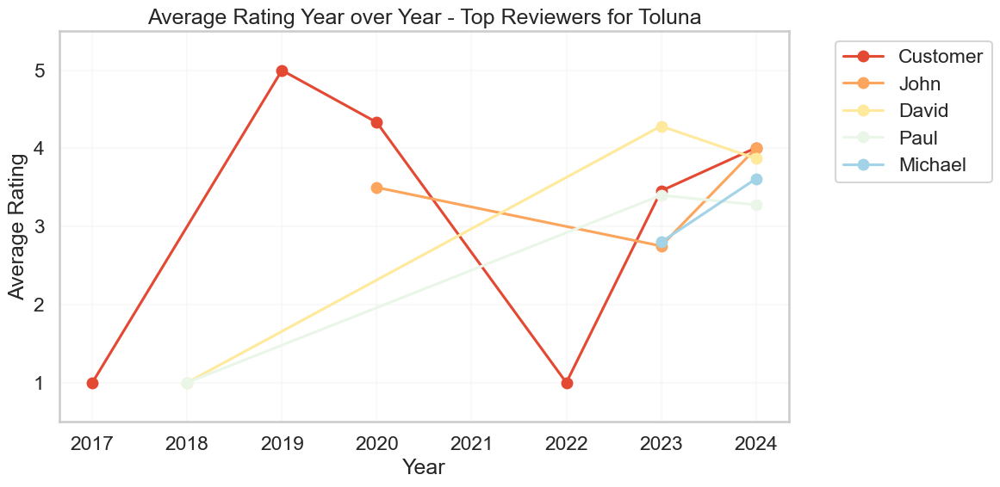

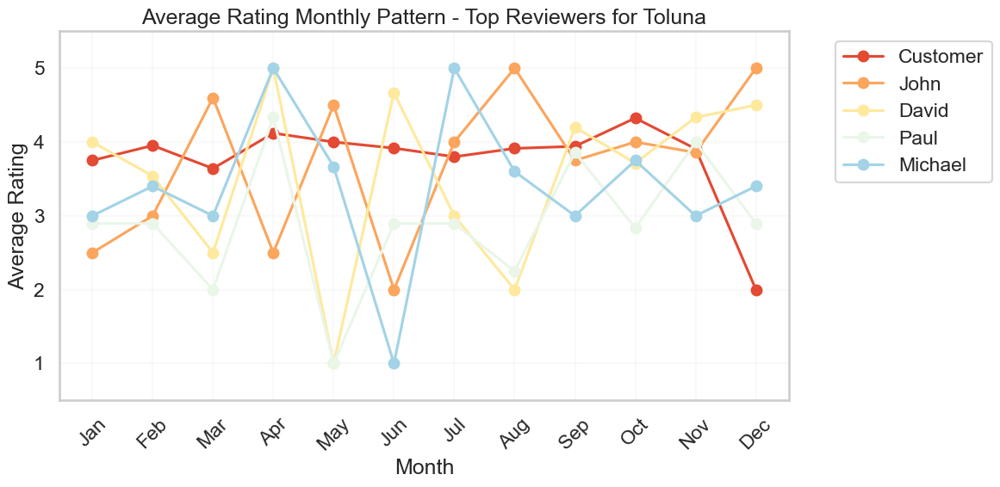

USER ANALYSIS FOR Inkfarm.com
Top 5 reviewers for Inkfarm.com:
username
John       505
Robert     471
James      384
David      359
Richard    292
Name: count, dtype: int64
Reviewer Metrics for Inkfarm.com:
          Total_Reviews  Avg_Rating  Std_Rating  Median_Rating  \
username                                                         
David               359       4.223       1.299            5.0   
James               384       4.143       1.347            5.0   
John                505       4.327       1.189            5.0   
Richard             292       4.271       1.305            5.0   
Robert              471       4.246       1.293            5.0   

          Pct_Repeat_Reviewer  Pct_Verified  
username                                     
David                   0.426           0.0  
James                   0.372           0.0  
John                    0.404           0.0  
Richard                 0.421           0.0  
Robert                  0.382           0.0  


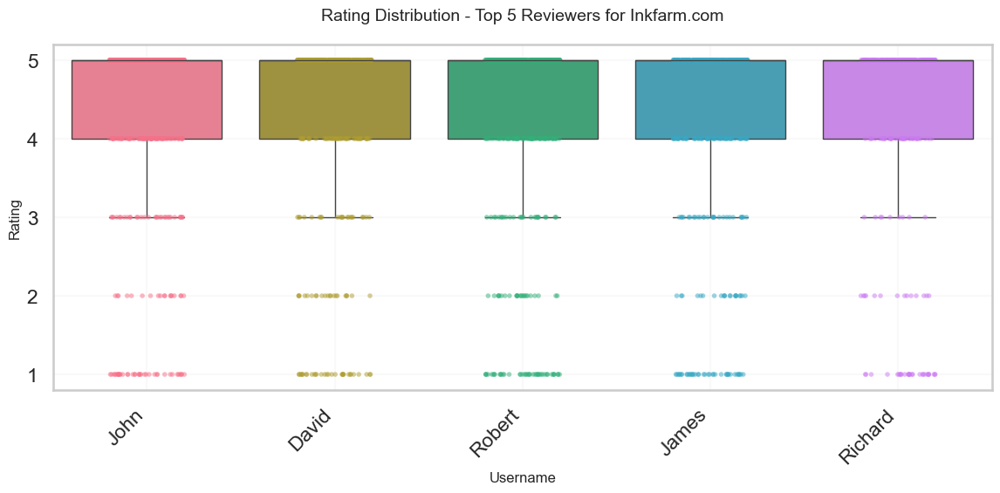

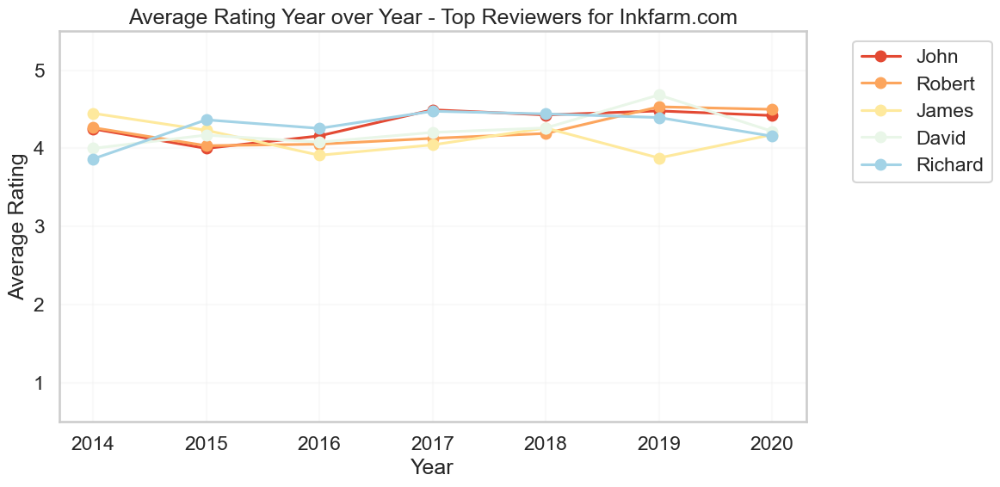

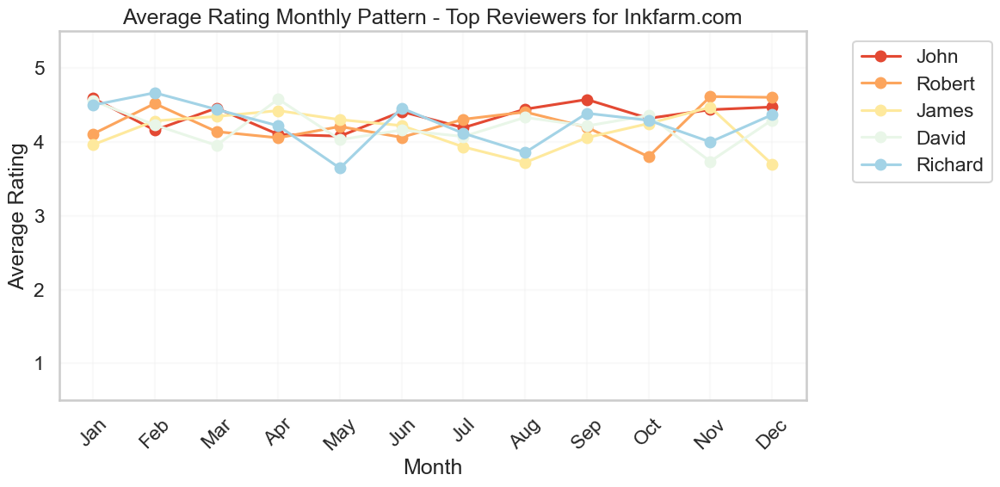

USER ANALYSIS FOR Asda
Top 5 reviewers for Asda:
username
Customer    147
Paul         43
Consumer     40
John         33
Mark         30
Name: count, dtype: int64
Reviewer Metrics for Asda:
          Total_Reviews  Avg_Rating  Std_Rating  Median_Rating  \
username                                                         
Consumer             40       1.425       1.107            1.0   
Customer            147       1.483       1.143            1.0   
John                 33       1.697       1.334            1.0   
Mark                 30       1.467       1.224            1.0   
Paul                 43       1.558       1.240            1.0   

          Pct_Repeat_Reviewer  Pct_Verified  
username                                     
Consumer                0.600           0.0  
Customer                0.980           0.0  
John                    0.970           0.0  
Mark                    0.867           0.0  
Paul                    0.930           0.0  


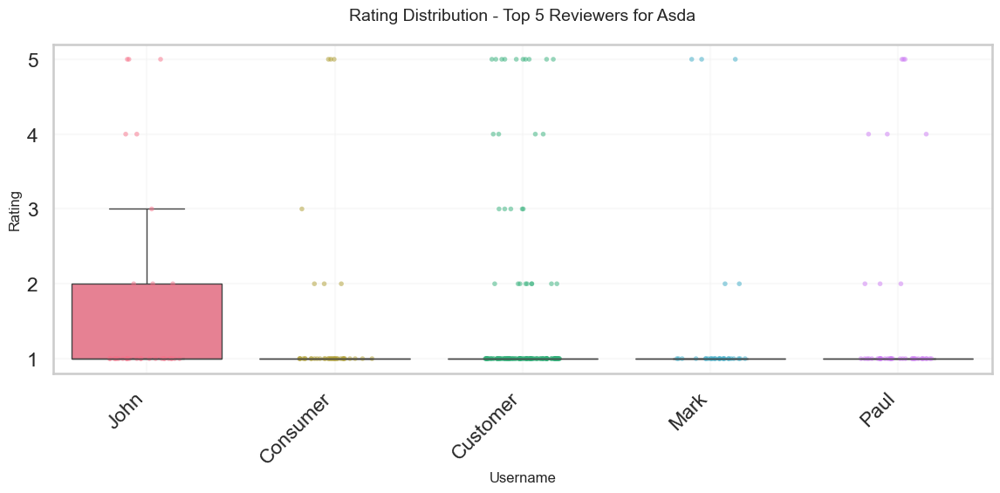

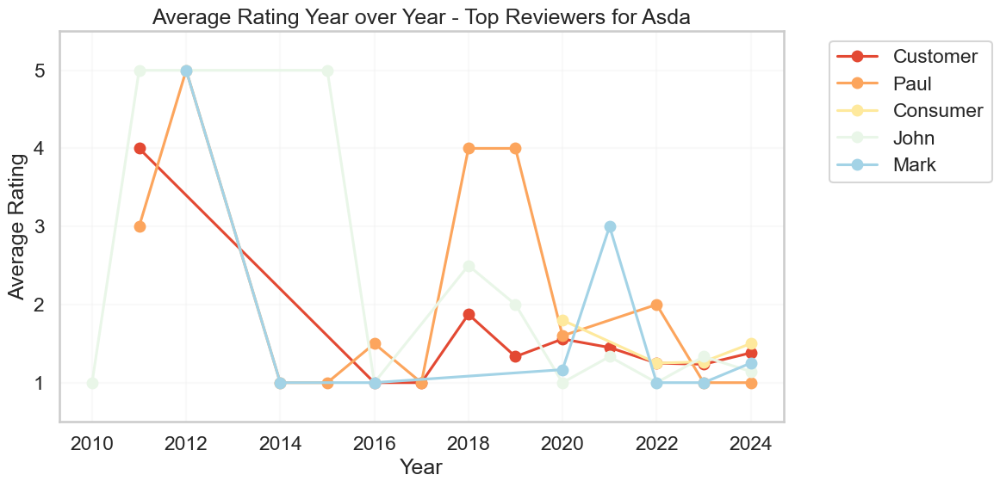

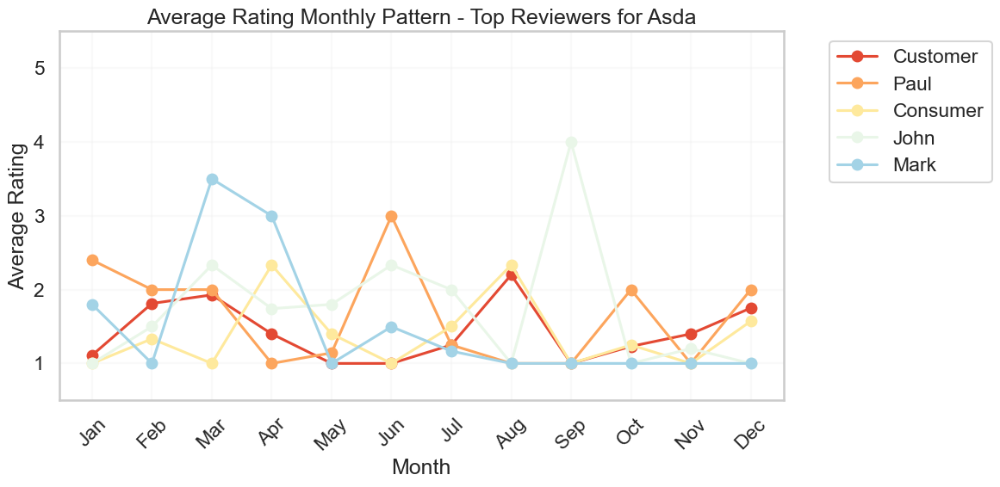

USER ANALYSIS FOR SteelSeries
Top 5 reviewers for SteelSeries:
username
Customer    109
Chris        53
Alex         50
Michael      45
Daniel       44
Name: count, dtype: int64
Reviewer Metrics for SteelSeries:
          Total_Reviews  Avg_Rating  Std_Rating  Median_Rating  \
username                                                         
Alex                 50       3.880       1.547            5.0   
Chris                53       3.547       1.738            5.0   
Customer            109       3.688       1.654            5.0   
Daniel               44       3.455       1.731            4.0   
Michael              45       3.067       1.900            3.0   

          Pct_Repeat_Reviewer  Pct_Verified  
username                                     
Alex                    0.260           0.0  
Chris                   0.283           0.0  
Customer                0.679           0.0  
Daniel                  0.386           0.0  
Michael                 0.378           0.0  


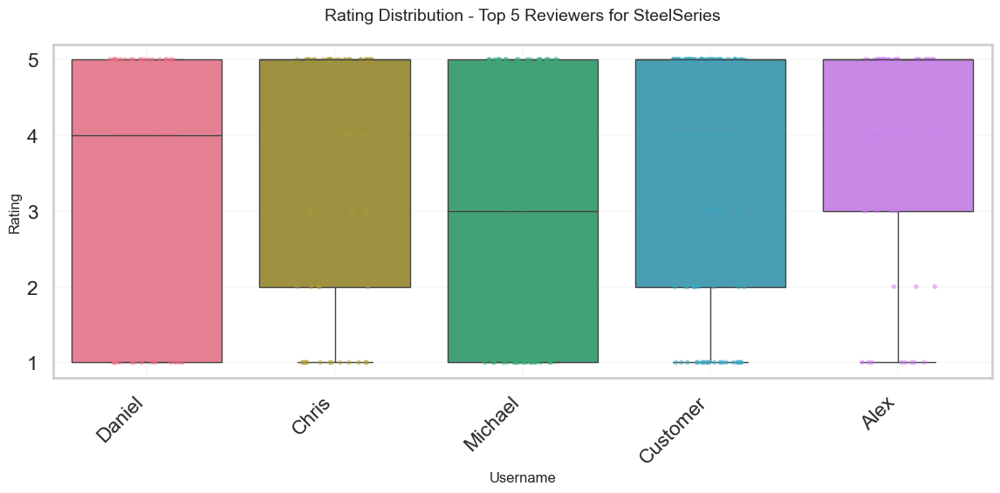

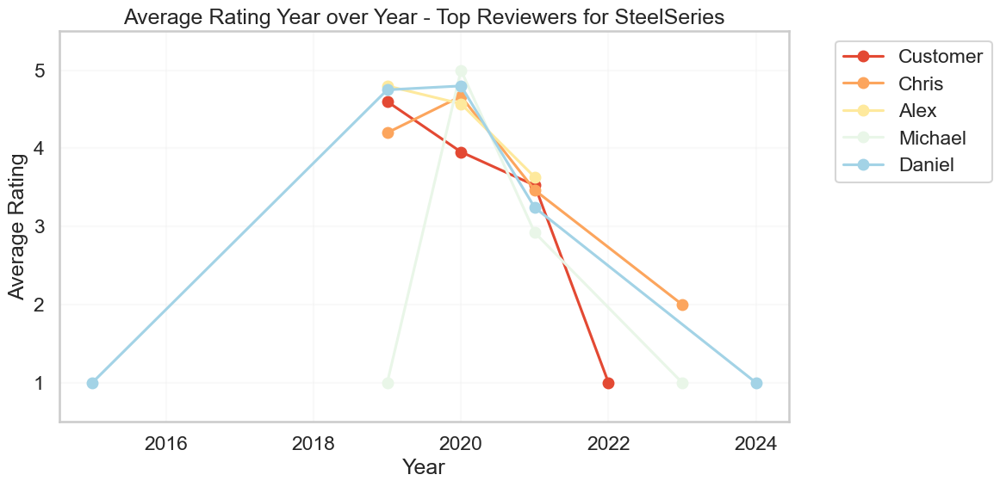

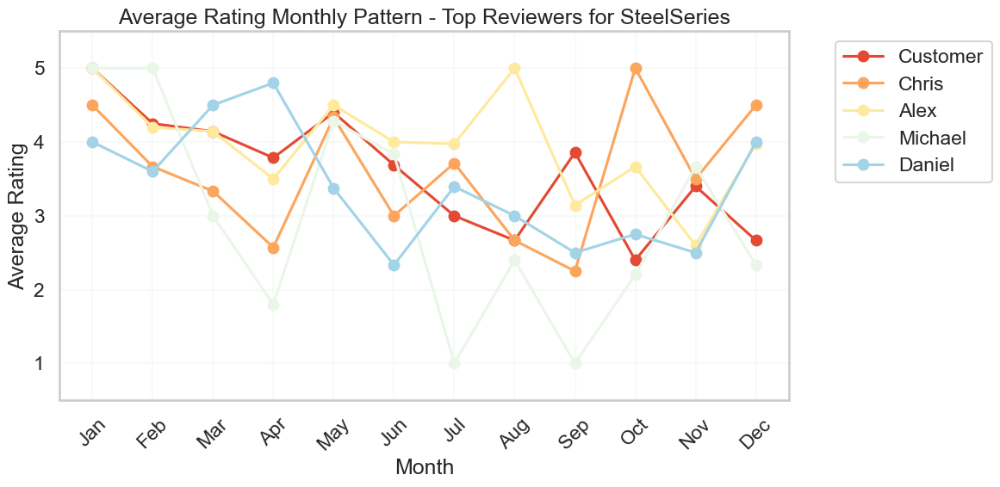

USER ANALYSIS FOR SCUFGaming
Top 5 reviewers for SCUFGaming:
username
Customer    69
Mike        21
Matt        20
Chris       17
Nick        14
Name: count, dtype: int64
Reviewer Metrics for SCUFGaming:
          Total_Reviews  Avg_Rating  Std_Rating  Median_Rating  \
username                                                         
Chris                17       3.294       1.724            4.0   
Customer             69       3.797       1.703            5.0   
Matt                 20       3.500       1.670            4.0   
Mike                 21       3.762       1.841            5.0   
Nick                 14       4.071       1.439            5.0   

          Pct_Repeat_Reviewer  Pct_Verified  
username                                     
Chris                   0.412           0.0  
Customer                0.768           0.0  
Matt                    0.350           0.0  
Mike                    0.333           0.0  
Nick                    0.500           0.0  


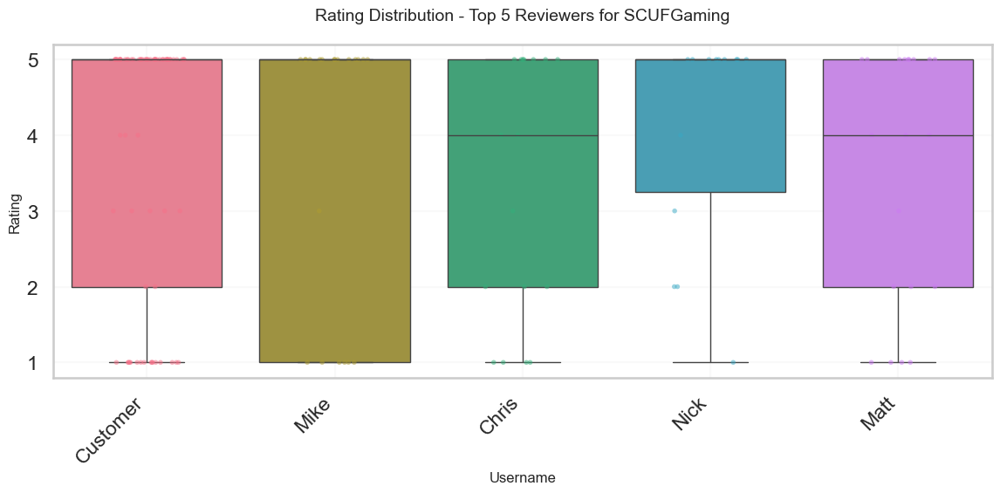

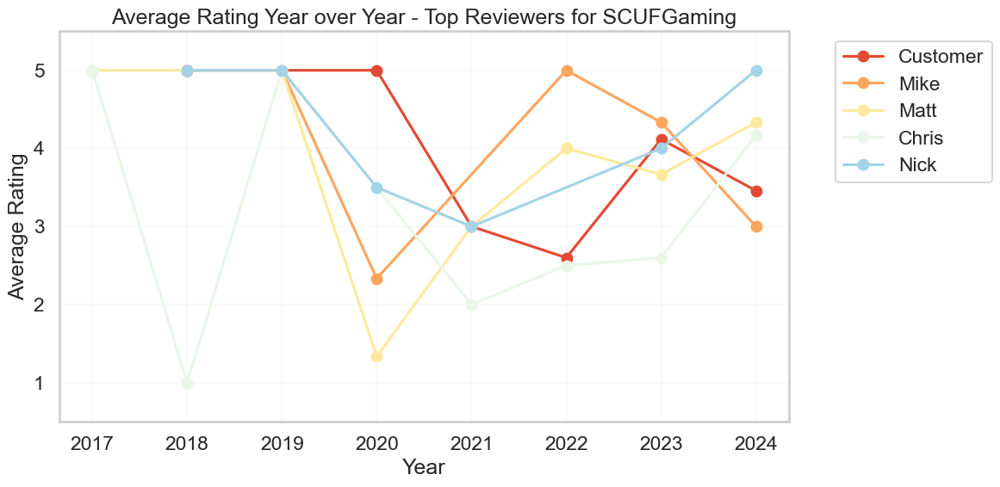

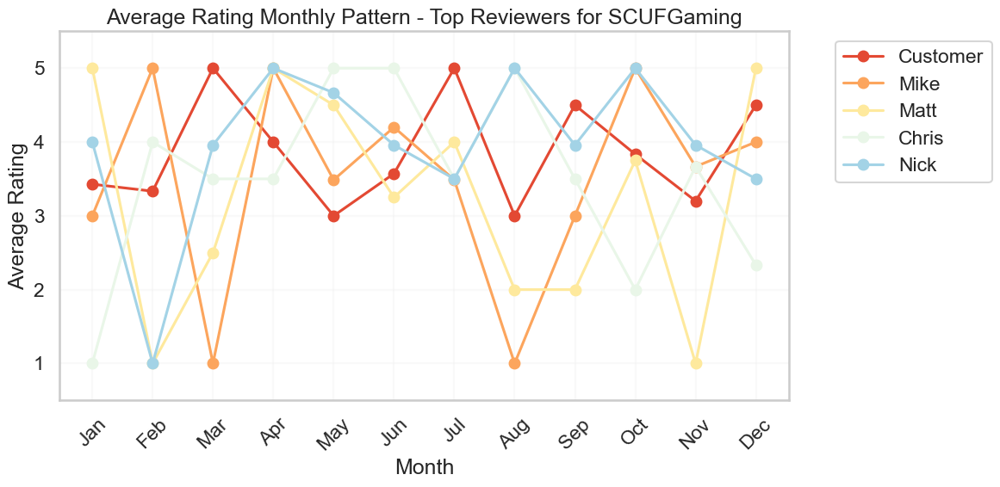

In [20]:
# Username analysis
print("USERNAME ANALYSIS")

top_companies = df_trustpilot['company'].value_counts().head(10)
print("Analyzing user patterns for top 10 companies:")
print(top_companies)

for company in top_companies.index:
    print(f"USER ANALYSIS FOR {company}")
    
    # Get company data
    company_data = df_trustpilot[df_trustpilot['company'] == company]
    
    # Get top reviewers
    top_company_users = company_data['username'].value_counts().head(5)
    print(f"Top 5 reviewers for {company}:")
    print(top_company_users)
    
    # Filter data for top reviewers
    df_filtered = company_data[company_data['username'].isin(top_company_users.index)]
    
    # Separate numeric and categorical analyses
    numeric_analysis = df_filtered.groupby('username').agg({
        'rating': ['count', 'mean', 'std', 'median'],
        'repeat_reviewer_encoded': 'mean'}).round(3)
    
    # Handle verification separately
    verification_pcts = df_filtered.groupby('username')['verification'].apply(
        lambda x: (x == 'verified').mean()).round(3)
    
    # Combine analyses
    user_analysis = numeric_analysis.copy()
    user_analysis[('verification', 'mean')] = verification_pcts
    
    # Flatten column names
    user_analysis.columns = ['Total_Reviews', 'Avg_Rating', 'Std_Rating', 
                           'Median_Rating', 'Pct_Repeat_Reviewer', 'Pct_Verified']
    
    print(f"Reviewer Metrics for {company}:")
    print(user_analysis)
    
    # Rating distribution plot
    plt.figure(figsize=(12, 6))
    colors = sns.color_palette("husl", n_colors=len(top_company_users))
    
    sns.boxplot(x='username', y='rating', data=df_filtered,
                palette=colors,
                boxprops={'zorder': 1},
                showfliers=False)
    
    sns.stripplot(x='username', y='rating', data=df_filtered,
                  palette=colors,
                  size=4,
                  jitter=0.2,
                  alpha=0.5,
                  zorder=2)
    
    plt.title(f'Rating Distribution - Top 5 Reviewers for {company}', fontsize=14, pad=20)
    plt.xlabel('Username', fontsize=12)
    plt.ylabel('Rating', fontsize=12)
    plt.xticks(rotation=45, ha='right')
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()
    
    # Year over Year Analysis
    plt.figure(figsize=(12, 6))
    for user in top_company_users.index:
        user_data = df_filtered[df_filtered['username'] == user]
        yearly_avg = user_data.groupby(
            user_data['local_date_posted'].dt.year)['rating'].mean()
        if not yearly_avg.empty:  
            plt.plot(yearly_avg.index, yearly_avg.values, marker='o', label=user)
    
    plt.title(f'Average Rating Year over Year - Top Reviewers for {company}')
    plt.xlabel('Year')
    plt.ylabel('Average Rating')
    plt.ylim(0.5, 5.5)  
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()
    
    # Monthly Pattern Analysis
    plt.figure(figsize=(12, 6))
    months = range(1, 13)
    
    for user in top_company_users.index:
        user_data = df_filtered[df_filtered['username'] == user]
        user_monthly = user_data.groupby(
            user_data['local_date_posted'].dt.month)['rating'].mean()
        
        if not user_monthly.empty:  
            monthly_avg = pd.Series(index=months)
            monthly_avg[user_monthly.index] = user_monthly
            monthly_avg = monthly_avg.fillna(user_monthly.mean())
            
            plt.plot(months, monthly_avg, marker='o', label=user)
    
    plt.title(f'Average Rating Monthly Pattern - Top Reviewers for {company}')
    plt.xlabel('Month')
    plt.ylabel('Average Rating')
    plt.ylim(0.5, 5.5)  
    plt.xticks(months, ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun',
                       'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'],
               rotation=45)
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()

COMPANY ANALYSIS - UNIQUE PATTERNS
Company Metrics:
              Total_Reviews  Avg_Rating  Rating_Std  Repeat_Reviewer_Rate  \
company                                                                     
Asda                  12576       1.514       1.198                 0.826   
CASETiFY              55560       3.682       1.565                 0.275   
Inkfarm.com           21764       4.217       1.320                 0.436   
PDFSimpli             27198       3.670       1.604                 0.237   
Quicken               26752       3.543       1.431                 0.474   
SCUFGaming            10385       3.675       1.672                 0.251   
SteelSeries           12423       3.777       1.635                 0.345   
StockX                84278       3.912       1.607                 0.316   
SurveyJunkie          28831       4.276       1.110                 0.407   
Toluna                23549       3.907       1.367                 0.494   

              Unique_Re

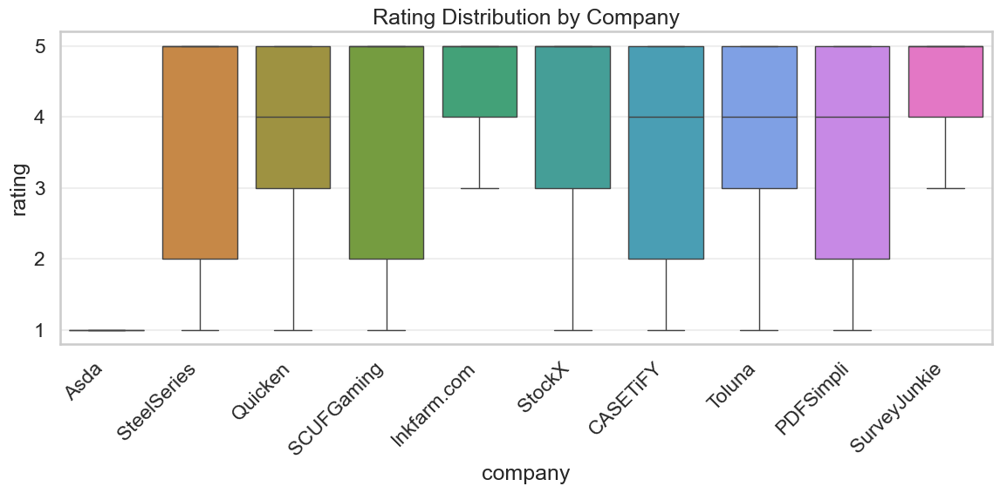

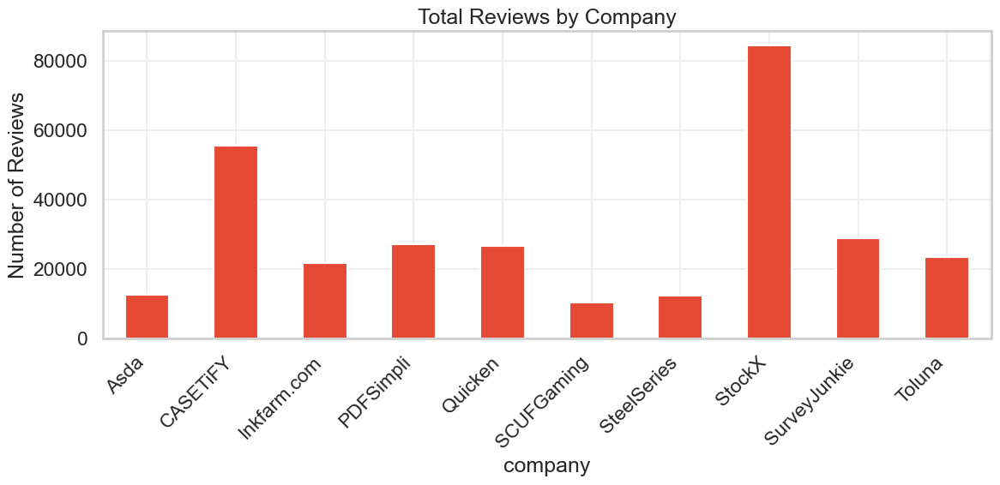

In [21]:
# Company analysis
print("COMPANY ANALYSIS - UNIQUE PATTERNS")

top_companies = df_trustpilot['company'].value_counts().head(10)
df_filtered = df_trustpilot[df_trustpilot['company'].isin(top_companies.index)]

# Split aggregations by data type
numeric_analysis = df_filtered.groupby('company').agg({
    'rating': ['count', 'mean', 'std'],
    'repeat_reviewer_encoded': 'mean',
    'username': 'nunique',
    'local_hour': lambda x: x.mode()[0]}).round(3)

# Handle categorical columns separately
verification_rate = df_filtered.groupby('company')['verification'].apply(
    lambda x: (x == 'verified').mean()).round(3)

location_count = df_filtered.groupby('company')['location'].nunique()

review_time_encoded = df_filtered.groupby('company')['review_time_encoded'].mean().round(3)

# Combine all analyses
company_analysis = numeric_analysis.copy()
company_analysis['verification_rate'] = verification_rate
company_analysis['countries_present'] = location_count
company_analysis['avg_review_time'] = review_time_encoded

# Flatten and rename columns
company_analysis.columns = ['Total_Reviews', 'Avg_Rating', 'Rating_Std',
                          'Repeat_Reviewer_Rate', 'Unique_Reviewers', 
                          'Peak_Hour', 'Verification_Rate', 
                          'Countries_Present', 'Avg_Review_Time']

print("Company Metrics:")
print(company_analysis)

print("Customer Base Analysis:")
print("="*50)

for company in top_companies.index:
    company_data = df_filtered[df_filtered['company'] == company]
    reviews_per_user = company_data.groupby('username').size()
    
    print(f"{company}:")
    print("-"*30)
    print(f"Total Reviews: {len(company_data):,}")
    print(f"Unique Reviewers: {len(reviews_per_user):,}")
    print(f"Reviews per Customer: {reviews_per_user.mean():.2f}")
    print(f"One-time Reviewers: {(reviews_per_user == 1).sum():,} "
          f"({(reviews_per_user == 1).mean()*100:.1f}%)")
    print(f"Loyal Customers (>5 reviews): {(reviews_per_user > 5).sum():,}")
    print(f"Countries: {company_data['location'].nunique()}")
    
    # Handle potential empty mode
    most_common_country = company_data['location'].mode()
    if len(most_common_country) > 0:
        print(f"Most Common Country: {most_common_country[0]}")
    else:
        print("Most Common Country: No data")

# Optional: Add visualizations
plt.figure(figsize=(12, 6))
sns.boxplot(data=df_filtered, x='company', y='rating', 
            palette='husl',
            showfliers=False)
plt.xticks(rotation=45, ha='right')
plt.title('Rating Distribution by Company')
plt.tight_layout()
plt.show()

# Reviews per company
plt.figure(figsize=(12, 6))
company_analysis['Total_Reviews'].plot(kind='bar')
plt.title('Total Reviews by Company')
plt.xticks(rotation=45, ha='right')
plt.ylabel('Number of Reviews')
plt.tight_layout()
plt.show()

Sentiment Scores by Location:
         Sentiment_Blob               Sentiment_VADER              
                   mean    std median            mean    std median
location                                                           
AD                0.335  0.068  0.335           0.640  0.283  0.640
AE                0.304  0.333  0.318           0.410  0.480  0.572
AF                0.401  0.350  0.372           0.587  0.504  0.707
AG                0.365  0.233  0.322           0.376  0.455  0.431
AI                0.207  0.153  0.250           0.236  0.586  0.515
AL                0.226  0.392  0.222           0.211  0.549  0.290
AM                0.167  0.406  0.126           0.121  0.615  0.166
AO                0.415  0.298  0.500           0.490  0.339  0.531
AR                0.245  0.305  0.250           0.353  0.463  0.462
AS                0.427  0.166  0.500           0.560  0.416  0.747
AT                0.299  0.296  0.300           0.431  0.493  0.579
AU                

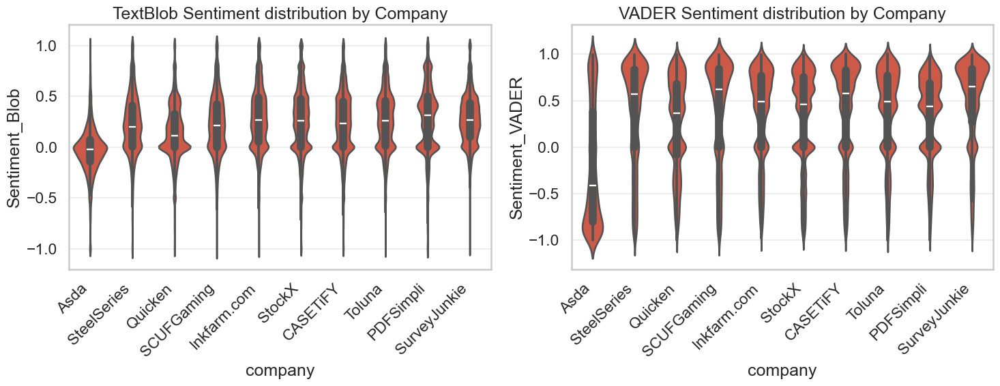

Sentiment Analysis for Top Reviewers of StockX:
           Sentiment_Blob               Sentiment_VADER              
                     mean    std median            mean    std median
username                                                             
Chris               0.218  0.308  0.238           0.314  0.519  0.440
Customer            0.279  0.315  0.286           0.328  0.521  0.493
David               0.236  0.317  0.250           0.351  0.484  0.440
Guest User          0.301  0.343  0.325           0.361  0.449  0.493
Michael             0.205  0.350  0.200           0.244  0.515  0.418
Sentiment Analysis for Top Reviewers of CASETiFY:
         Sentiment_Blob               Sentiment_VADER              
                   mean    std median            mean    std median
username                                                           
Customer          0.195  0.318  0.200           0.333  0.548  0.485
Emily             0.209  0.288  0.202           0.400  0.535  0.593
Je

In [22]:
#sentiment
def analyze_sentiment_by_groups():
    # Location analysis
    location_sentiment = df_filtered.groupby('location').agg({
        'Sentiment_Blob': ['mean', 'std', 'median'],
        'Sentiment_VADER': ['mean', 'std', 'median']}).round(3)
    print("Sentiment Scores by Location:")
    print(location_sentiment)
    
    # Company analysis
    company_sentiment = df_filtered.groupby('company').agg({
        'Sentiment_Blob_cat': ['mean', 'std', 'median'],
        'Sentiment_VADER_cat': ['mean', 'std', 'median']}).round(3)
    print("Sentiment Scores by Company:")
    print(company_sentiment)
    
    # Visualize for top companies
    plt.figure(figsize=(15, 6))
    plt.subplot(121)
    sns.violinplot(data=df_filtered, x='company', y='Sentiment_Blob')
    plt.xticks(rotation=45, ha='right')
    plt.title('TextBlob Sentiment distribution by Company')
    
    plt.subplot(122)
    sns.violinplot(data=df_filtered, x='company', y='Sentiment_VADER')
    plt.xticks(rotation=45, ha='right')
    plt.title('VADER Sentiment distribution by Company')
    plt.tight_layout()
    plt.show()
    
    # Username analysis (top reviewers per company)
    for company in top_companies.index:
        company_data = df_filtered[df_filtered['company'] == company]
        top_reviewers = company_data['username'].value_counts().head(5).index
        reviewer_sentiment = company_data[company_data['username'].isin(top_reviewers)].groupby('username').agg({
            'Sentiment_Blob': ['mean', 'std', 'median'],
            'Sentiment_VADER': ['mean', 'std', 'median']
        }).round(3)
        print(f"Sentiment Analysis for Top Reviewers of {company}:")
        print(reviewer_sentiment)

analyze_sentiment_by_groups()

In [23]:
# Add sentiment interaction features
df_trustpilot['sentiment_divergence'] = abs(df_trustpilot['Sentiment_Blob'] - df_trustpilot['Sentiment_VADER'])
df_trustpilot['sentiment_intensity'] = (abs(df_trustpilot['Sentiment_Blob']) + abs(df_trustpilot['Sentiment_VADER'])) / 2

# Create sentiment interactions with other features
df_trustpilot['sentiment_length_ratio'] = df_trustpilot['sentiment_intensity'] / df_trustpilot['text_word_length']

# Encode verification status (0 for 'Not Verified', 1 for 'Verified')
df_trustpilot['verification_encoded'] = (df_trustpilot['verification'] == 'Verified').astype(int)
df_trustpilot['verified_sentiment'] = df_trustpilot['verification_encoded'] * df_trustpilot['sentiment_intensity']

# Time-based sentiment interaction
df_trustpilot['time_sentiment'] = df_trustpilot['local_hour'] * df_trustpilot['sentiment_intensity']

# Add extreme vs moderate sentiment patterns
df_trustpilot['extreme_sentiment'] = ((df_trustpilot['Sentiment_Blob'].abs() > df_trustpilot['Sentiment_Blob'].std()) & 
                                    (df_trustpilot['Sentiment_VADER'].abs() > df_trustpilot['Sentiment_VADER'].std())).astype(int)

In [24]:
#Inspecting final output 
df_trustpilot = df_trustpilot.drop('avg_word_length', axis=1)
print(df_trustpilot.columns)
print(df_trustpilot.info())
print("The Trustpilot dataset has ", df_trustpilot.shape[1], "columns")
print("The Trustpilot dataset has ", df_trustpilot.shape[0], "rows")
display(df_trustpilot.head())

Index(['rating', 'location', 'username', 'number_reviews', 'verification',
       'repeat_reviewer', 'repeat_reviewer_encoded', 'company', 'text',
       'text_processed', 'text_length', 'text_word_length', 'Sentiment_Blob',
       'Sentiment_Blob_cat', 'Sentiment_VADER', 'Sentiment_VADER_cat',
       'subject', 'subject_processed', 'subject_length', 'subject_word_length',
       'answer', 'answer_processed', 'answered_encoded', 'date_of_experience',
       'date_posted', 'local_date_posted', 'month_local', 'local_hour',
       'time_of_day', 'day_of_week_posted', 'day_type',
       'days_between_experience_and_post', 'review_time',
       'review_time_encoded', 'punctuation_counts', 'sentiment_divergence',
       'sentiment_intensity', 'sentiment_length_ratio', 'verification_encoded',
       'verified_sentiment', 'time_sentiment', 'extreme_sentiment'],
      dtype='object')
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 320087 entries, 0 to 320086
Data columns (total 42 columns):
 

,rating,location,username,number_reviews,verification,repeat_reviewer,repeat_reviewer_encoded,company,text,text_processed,text_length,text_word_length,Sentiment_Blob,Sentiment_Blob_cat,Sentiment_VADER,Sentiment_VADER_cat,subject,subject_processed,subject_length,subject_word_length,answer,answer_processed,answered_encoded,date_of_experience,date_posted,local_date_posted,month_local,local_hour,time_of_day,day_of_week_posted,day_type,days_between_experience_and_post,review_time,review_time_encoded,punctuation_counts,sentiment_divergence,sentiment_intensity,sentiment_length_ratio,verification_encoded,verified_sentiment,time_sentiment,extreme_sentiment
0,1,GB,Sstreetly,4,Not Verified,repeat,1,Asda,Asda at fosse park leicester is old yes. Thoug...,asda fosse park leicester old yes though reall...,330,54,0.111099,5,0.8685,5,Asda at fosse park leicester is old…,asda fosse park leicester old,29,5,0,0,0,2024-11-20,2024-11-22 09:22:38,2024-11-22,11,8,Morning,4,Business Day,2,late_review,0,"{'.': 2, ""'"": 2, '?': 1}",0.757401,0.489799,0.009070,0,0.0,3.918396,0
1,1,GB,Ciaran,1,Not Verified,one-time,0,Asda,Ordered flowers this morning and paid extra fo...,ordered flower morning paid extra express deli...,301,47,0.100000,5,0.3612,5,Ordered flowers this morning and paid…,ordered flower morning paid,27,4,0,0,0,2024-11-22,2024-11-22 12:21:22,2024-11-22,11,11,Business Hours,4,Business Day,0,quick_review,1,"{'-': 2, '.': 4, ""'"": 1, '!': 1}",0.261200,0.230600,0.004906,0,0.0,2.536600,0
2,1,GB,Rosie Brocklehurst,63,Not Verified,repeat,1,Asda,Why is Asda taking money for a grocery deliver...,why asda taking money grocery delivery day bef...,375,62,0.043333,4,-0.2263,3,Why is Asda taking money for a grocery…,why asda taking money grocery,29,5,0,0,0,2024-11-22,2024-11-22 14:14:39,2024-11-22,11,13,Business Hours,4,Business Day,0,quick_review,1,"{'.': 5, ""'"": 1}",0.269633,0.134817,0.002174,0,0.0,1.752617,0
3,1,GB,Heidi Warfield,1,Not Verified,one-time,0,Asda,I’m absolutely disgusted that a company like A...,absolutely disgusted company like asda ha robb...,304,54,-0.288889,1,-0.6531,2,I’m absolutely disgusted robbed by Asda that a...,absolutely disgusted robbed asda company,40,5,0,0,0,2024-11-19,2024-11-22 09:30:19,2024-11-22,11,8,Morning,4,Business Day,3,late_review,0,"{'.': 3, ',': 1}",0.364211,0.470994,0.008722,0,0.0,3.767956,0
4,1,GB,Noetic Aphrodite,3,Not Verified,repeat,1,Asda,"For those who haven't seen my previous review,...",those who havent seen previous review if asda ...,354,56,0.217424,5,0.6369,5,For those who haven't seen my previous…,those who havent seen previous,30,5,0,0,0,2024-11-19,2024-11-19 22:58:03,2024-11-19,11,21,Evening,1,Business Day,0,quick_review,1,"{""'"": 1, ',': 3, '/': 2, '.': 3, ':': 1, '-': ...",0.419476,0.427162,0.007628,0,0.0,8.970405,0


In [25]:
import os

os.makedirs('data', exist_ok=True)

csv_path = 'data/data_trustpilot_2.csv'
df_trustpilot.to_csv(csv_path, index=False)
print(f"DataFrame exported to {csv_path}")

DataFrame exported to data/data_trustpilot_2.csv
